# SMBR

## Geotracer Samples from Agricultural Irrigation Drain Systems

### General Plots of Raw Data for SMBR

This notebook takes in .csv files that contain isotope fractionation values, nitrate concentrations, and Radon-222 activities (previously decay-corrected for radon in water), specifically for the SMBR site

It can separate the data into SMBR site-specific data as well as by type and can plot accordingly.

## Section 1 -- Loading the Data

In [108]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [109]:
%matplotlib notebook
import numpy as np 
from scipy import stats 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as pat
import datetime as dt

### Load Data File

In [110]:
filename = '../../Processed_Data/SampleLog2018and2019_updated.csv'
data = pd.read_csv(filename, sep=',')
# data

### Replace unknowns with NaN values & Remove blank rows

In [111]:
# Replace unknowns with NaN values
data = data.replace('#VALUE!', np.NaN)
data = data.replace('-', np.NaN)
data = data.replace('NA?', np.NaN)
data = data.replace('<0.005', 0)
data = data.replace('<0.05', 0) 
data = data.replace('<0.010', 0)
data = data.replace('Sediment at bottom', np.NaN)
# data = data.replace('?', np.NaN)  # There is a site called '?' !!

# Remove rows with no data
data = data.dropna(subset=['Date'])

# Convert date values to a recognized date type 
data['Date'] = pd.to_datetime(data['Date'])

# Convert variables to analyzed into a numeric type 
variables = ['Phosphate (mg/L)','Nitrite (mg/L)', 'Nitrate/Nitrite (mg/L)', 
             'Ammonia (mg/L)','Nitrate-N (mg/L)', 'Decay Corrected Avg Rn_wat (dpm/L)',
             'Decay Corrected Avg Uncertainty (dmp/L)', 'd15NAir (‰)','d18OVSMOW  (‰)', 
             'K (Soluble) (mg/L)', 'Ca (Soluble) (meq/L)','Mg (Soluble) (meq/L)', 
             'Na (Soluble) (meq/L)','Cl (meq/L)','SO4-S(Sol S) (mg/L)', 'NO3-N (mg/L)', 
             'HCO3 (meq/L)','B (Soluble) (mg/L)', 'Zn (Soluble) (mg/L)', 'Cu (Soluble) (mg/L)',
             'Mn (Soluble) (mg/L)', 'Fe (Soluble) (mg/L)']

for var in variables:
    data[var] = pd.to_numeric(data[var])
    data[var]
    

# Calculate Nitrate from the Nitrate+Nitrite values 
data['Nitrate-N (mg/L)'] = data['Nitrate/Nitrite (mg/L)'] - data['Nitrite (mg/L)']

# data.keys()
# data.head()

### Create SMBR dataframe  & Sample type dataframes

Define the index (as an array) for SMBR sites and types

In [112]:
# # Define an index as an array for each site (where that value is not)
## Then drop those values from the new data frame as a new data frame 

# Site_List = ['BR', 'BP', 'OS', 'WLA', 'PW', 'CD', 'MC', 'Harbor', 'Ducks', 'Snapshot', '??']

SiteName = 'BR'
        
# Define the total Site data frame 
no_Site, = np.where(data['Site Name'] != SiteName)

data['Site Name'][no_Site]
Site = data.drop(data.index[no_Site]) 

# Reset index
Site = Site.reset_index()

# Site

In [113]:
Types = ['SUMP', 'DITCH', 'MC', 'CLAY_PIT', 'SAND_PIT', 'TILE', 'TAIL DRAIN', 'FURROW', 
         'HARBOR', 'WETLAND', 'ES', 'MB', 'SPRING', 'IRRIG']

# Define SUMP sites 
no_Site_SUMP, = np.where((Site['Updated_Site_Type'] != 'SUMP'))
Site_SUMP = Site.drop(Site.index[no_Site_SUMP])
# Site_SUMP
SUMP, = np.where(Site['Updated_Site_Type'] == 'SUMP')


# # Define DITCH sites 
no_Site_DITCH, = np.where((Site['Updated_Site_Type'] != 'DITCH'))
Site_DITCH = Site.drop(Site.index[no_Site_DITCH])
# Site_DITCH
DITCH, = np.where(Site['Updated_Site_Type'] == 'DITCH')


# # Define CLAY_PIT sites 
no_Site_CLAY_PIT, = np.where((Site['Updated_Site_Type'] != 'CLAY_PIT'))
Site_CLAY_PIT = Site.drop(Site.index[no_Site_CLAY_PIT])
# Site_CLAY_PIT
CLAY_PIT, = np.where(Site['Updated_Site_Type'] == 'CLAY_PIT')


# # Define FURROW sites 
no_Site_FURROW, = np.where((Site['Updated_Site_Type'] != 'FURROW'))
Site_FURROW = Site.drop(Site.index[no_Site_FURROW])
# Site_FURROW
FURROW, = np.where(Site['Updated_Site_Type'] == 'FURROW')


# # Define TILE sites 
no_Site_TILE, = np.where((Site['Updated_Site_Type'] != 'TILE'))
Site_TILE = Site.drop(Site.index[no_Site_TILE])
# Site_TILE
TILE, = np.where(Site['Updated_Site_Type'] == 'TILE')


# # Define TAIL DRAIN sites 
no_Site_TAILDRAIN, = np.where((Site['Updated_Site_Type'] != 'TAIL DRAIN'))
Site_TAILDRAIN = Site.drop(Site.index[no_Site_TAILDRAIN])
# Site_TAILDRAIN
TAILDRAIN, = np.where(Site['Updated_Site_Type'] == 'TAIL DRAIN')


# # Define IRRIG sites 
no_Site_IRRIG, = np.where((Site['Updated_Site_Type'] != 'IRRIG'))
Site_IRRIG = Site.drop(Site.index[no_Site_IRRIG])
# Site_IRRIG
IRRIG, = np.where(Site['Updated_Site_Type'] == 'IRRIG')


# Define MC sites 
no_Site_MC, = np.where((Site['Updated_Site_Type'] != 'MC'))
Site_MC = Site.drop(Site.index[no_Site_MC])
# Site_MC
MC, = np.where(Site['Updated_Site_Type'] == 'MC')



# Define SAND_PIT sites 
no_Site_SAND_PIT, = np.where((Site['Updated_Site_Type'] != 'SAND_PIT'))
Site_SAND_PIT = Site.drop(Site.index[no_Site_SAND_PIT])
# Site_SAND_PIT
SAND_PIT, = np.where(Site['Updated_Site_Type'] == 'SAND_PIT')


# Define HARBOR sites 
no_Site_HARBOR, = np.where((Site['Updated_Site_Type'] != 'HARBOR'))
Site_HARBOR = Site.drop(Site.index[no_Site_HARBOR])
# Site_HARBOR
HARBOR, = np.where(Site['Updated_Site_Type'] == 'HARBOR')


# Define WETLAND sites 
no_Site_WETLAND, = np.where((Site['Updated_Site_Type'] != 'WETLAND'))
Site_WETLAND = Site.drop(Site.index[no_Site_WETLAND])
# Site_WETLAND
WETLAND, = np.where(Site['Updated_Site_Type'] == 'WETLAND')


# Define ES sites 
no_Site_ES, = np.where((Site['Updated_Site_Type'] != 'ES'))
Site_ES = Site.drop(Site.index[no_Site_ES])
# Site_ES
ES, = np.where(Site['Updated_Site_Type'] == 'ES')


# Define MB sites 
no_Site_MB, = np.where((Site['Updated_Site_Type'] != 'MB'))
Site_MB = Site.drop(Site.index[no_Site_MB])
# Site_MB
MB, = np.where(Site['Updated_Site_Type'] == 'MB')


# Define SPRING sites 
no_Site_SPRING, = np.where((Site['Updated_Site_Type'] != 'SPRING'))
Site_SPRING = Site.drop(Site.index[no_Site_SPRING])
# Site_SPRING
SPRING, = np.where(Site['Updated_Site_Type'] == 'SPRING')


In [114]:
Site['Date'] = pd.to_datetime(Site['Date'])

### Wet and dry season index 

In [115]:
start_wet18 = dt.datetime(2018, 11, 20)
start_dry19 = dt.datetime(2019, 6, 1)
start_wet19 = dt.datetime(2019, 11, 15)

In [116]:
# from Aug 2018 - Nov 2018
dry2018, = np.where(Site['Date'] <= start_wet18)

# from Nov 2018 - June 2019 
wet2019, = np.where((Site['Date'] > start_wet18) & (Site['Date'] <= start_dry19))

# from June 2019 - Nov 2019
dry2019, = np.where((Site['Date'] > start_dry19) & (Site['Date'] <= start_wet19))

In [117]:
not_dry2018 = np.concatenate((wet2019,dry2019))
dry2018_df = Site.drop(Site.index[not_dry2018])

not_wet2019 = np.concatenate((dry2018,dry2019))
wet2019_df = Site.drop(Site.index[not_wet2019])

not_dry2019 = np.concatenate((dry2018,wet2019))
dry2019_df = Site.drop(Site.index[not_dry2019])

### Sample Counts 
List how many of each sample type there are samples for 

In [118]:
# Overall 
print('Total SMBR samples =', np.count_nonzero(Site['Date']))
print('Dry season 2018 =', np.count_nonzero(Site['Date'][dry2018]))
print('Wet season 2019 =', np.count_nonzero(Site['Date'][wet2019]))
print('Dry season 2019 =', np.count_nonzero(Site['Date'][dry2019]),'\n')

    
print('Total SUMP samples =', np.count_nonzero(Site_SUMP['Date']))
print('Total DITCH samples =', np.count_nonzero(Site_DITCH['Date']))
print('Total FURROW samples =', np.count_nonzero(Site_FURROW['Date']))
print('Total TILE samples =', np.count_nonzero(Site_TILE['Date']))
print('Total TAIL DRAIN samples =', np.count_nonzero(Site_TAILDRAIN['Date']))
print('Total CLAY_PIT samples =', np.count_nonzero(Site_CLAY_PIT['Date']))

print('Total IRRIG samples =', np.count_nonzero(Site_IRRIG['Date']))
print('\nTotal SPRING samples =', np.count_nonzero(Site_SPRING['Date']))

print('Total SAND_PIT samples =', np.count_nonzero(Site_SAND_PIT['Date']))
print('Total WETLAND samples =', np.count_nonzero(Site_WETLAND['Date']))
print('Total MC samples =', np.count_nonzero(Site_MC['Date']))
print('Total HARBOR samples =', np.count_nonzero(Site_HARBOR['Date']))
print('Total ES samples =', np.count_nonzero(Site_ES['Date']))
print('Total MB samples =', np.count_nonzero(Site_MB['Date']))

Total SMBR samples = 69
Dry season 2018 = 22
Wet season 2019 = 31
Dry season 2019 = 16 

Total SUMP samples = 12
Total DITCH samples = 36
Total FURROW samples = 9
Total TILE samples = 5
Total TAIL DRAIN samples = 5
Total CLAY_PIT samples = 2
Total IRRIG samples = 0

Total SPRING samples = 0
Total SAND_PIT samples = 0
Total WETLAND samples = 0
Total MC samples = 0
Total HARBOR samples = 0
Total ES samples = 0
Total MB samples = 0


### Standard Deviations

In [119]:
variablenames = ['Phosphate (mg/L)', 'Nitrite (mg/L)', 'Ammonia (mg/L)',
                           'Nitrate-N (mg/L)', 'Decay Corrected Avg Rn_wat (dpm/L)',
                           'd15NAir (‰)','d18OVSMOW  (‰)']

# Hade to remove TILE for this Site set 
Types_index = [SUMP, DITCH, MC, CLAY_PIT, SAND_PIT, TAILDRAIN, FURROW, 
         HARBOR, WETLAND, ES, MB, SPRING, IRRIG]
Types = ['SUMP', 'DITCH', 'MC', 'CLAY_PIT', 'SAND_PIT', 'TAIL DRAIN', 'FURROW', 
         'HARBOR', 'WETLAND', 'ES', 'MB', 'SPRING', 'IRRIG']

for var in variablenames: 
    print(var, 'Standard Deviations for:')
    i = 0
    for Type_index in Types_index:
        print(Types[i],"=", np.std(dry2018_df[var][Type_index]))
        i = i+1
    print('\n')

Phosphate (mg/L) Standard Deviations for:
SUMP = 0.07877390987853161
DITCH = 0.05393720793663684
MC = nan
CLAY_PIT = 0.0
SAND_PIT = nan
TAIL DRAIN = 0.52
FURROW = 0.0
HARBOR = nan
WETLAND = nan
ES = nan
MB = nan
SPRING = nan
IRRIG = nan


Nitrite (mg/L) Standard Deviations for:
SUMP = 0.025710319456020227
DITCH = 0.1711679201836606
MC = nan
CLAY_PIT = 0.0
SAND_PIT = nan
TAIL DRAIN = 0.06524483802484987
FURROW = 0.0
HARBOR = nan
WETLAND = nan
ES = nan
MB = nan
SPRING = nan
IRRIG = nan


Ammonia (mg/L) Standard Deviations for:
SUMP = 0.11295280755560651
DITCH = 0.2247809958604152
MC = nan
CLAY_PIT = 0.0
SAND_PIT = nan
TAIL DRAIN = 3.3304862507848116
FURROW = 0.0
HARBOR = nan
WETLAND = nan
ES = nan
MB = nan
SPRING = nan
IRRIG = nan


Nitrate-N (mg/L) Standard Deviations for:
SUMP = 36.70417044079674
DITCH = 24.132091822651844
MC = nan
CLAY_PIT = 0.0
SAND_PIT = nan
TAIL DRAIN = 66.73950626794365
FURROW = 0.0
HARBOR = nan
WETLAND = nan
ES = nan
MB = nan
SPRING = nan
IRRIG = nan


Decay Corr

In [120]:
dry2018_df.keys()

Index(['index', 'Date', 'Site Name', 'Type', 'Correct Data? ', 'Updated? ',
       'Rn for equilibrated?', 'Depth/Temp/Wind', 'Site Name.1', 'Site_type',
       'Updated_Site_Type', 'Description', 'Latitude', 'Longitude', 'Label',
       'Replecate ', 'Total_Name', 'Sample Analysis', 'BB Sample Color',
       'BB Sediment?', 'Rn-222', 'Nutrients', 'Isotopes', 'Elements',
       'Water Iso.', 'Bkgd Run #', 'RAD7 Run #', 'BB #', 'Volume (L)',
       'Background Date', 'Collection DateTime', 'Analysis Date',
       'Analysis DateTime', 'Decay Time (days)', 'Radon Flag', 'Wind',
       'Nutrient Sample Name', 'Isotope Sample Names', 'Nut. Sample Freezer',
       'Iso. Sample Freezer', 'Elem. Sample Location',
       'Water Isotope Location', 'Field Irrigation Status ', 'Crop Status',
       'Rotation', 'Notes', 'Depth (meters)', 'Area (m2)', 'Flow Rate (m/s)',
       'Water Temp (deg C)', 'Cond. (uS/cm)', 'Salinity ', 'pH', 'DO (%)',
       'DO (mg/L)', 'Date_Check', 'Name_Check', 'Phospha

#  Plotting

## Distribution of Sample Values based on Sample-Type 
Radon, Nitrate, del15N, and del18O  for all sites

<IPython.core.display.Javascript object>


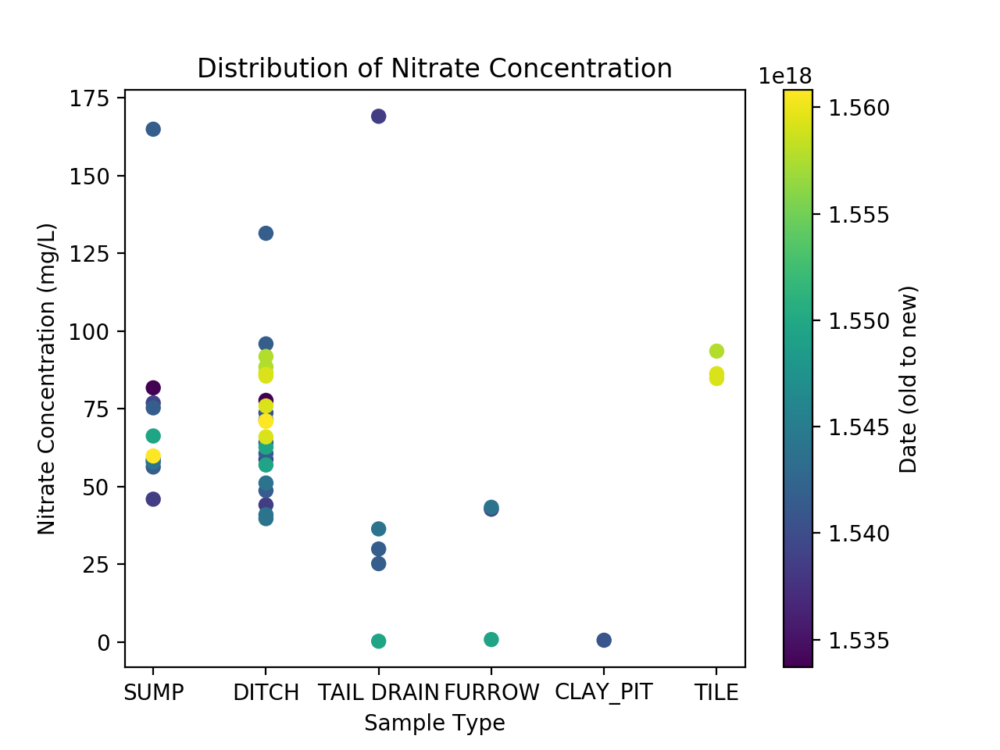

Text(0.5, 1.0, 'Distribution of Nitrate Concentration')

In [121]:
# Nitrate (mg/L)
plt.figure()
plt.scatter(Site['Updated_Site_Type'],Site['Nitrate-N (mg/L)'],c=Site['Date'])
plt.xlabel('Sample Type')
plt.ylabel('Nitrate Concentration (mg/L)')
# plt.colorbar()
cbar = plt.colorbar()
cbar.set_label('Date (old to new)')
# cbar.ax.set_yticklabels(['8/8/19','','','','','8/1/19'])
plt.title('Distribution of Nitrate Concentration')


<IPython.core.display.Javascript object>


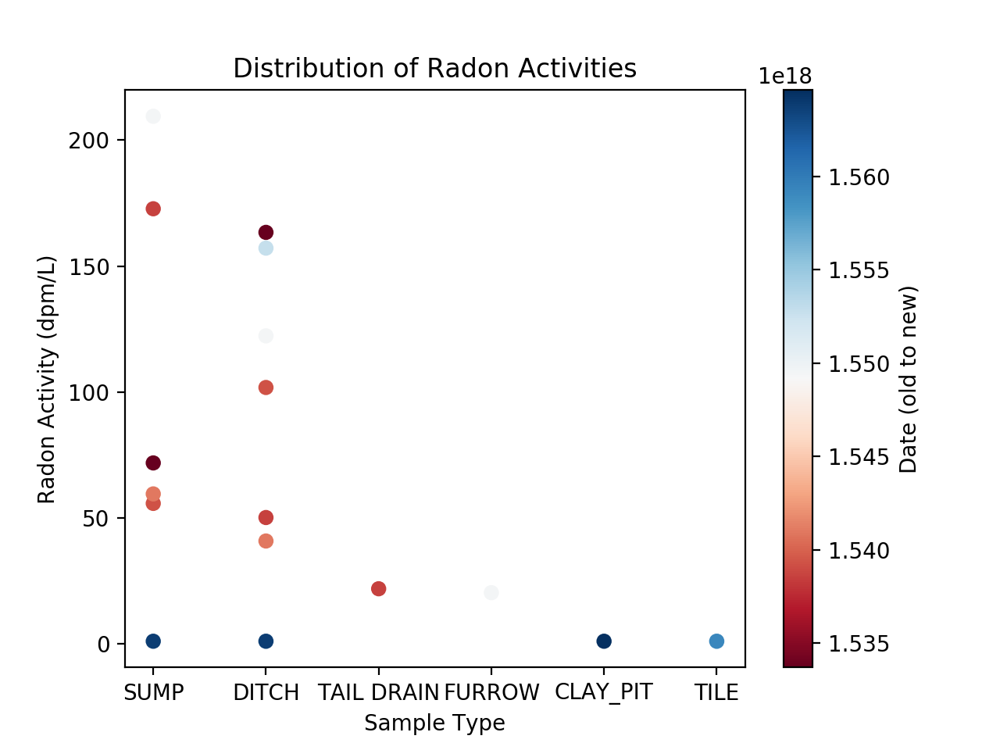

Text(0.5, 1.0, 'Distribution of Radon Activities')

In [122]:
# Radon (dpm/L)

plt.figure()
plt.scatter(Site['Updated_Site_Type'],Site['Decay Corrected Avg Rn_wat (dpm/L)'],c=Site['Date'], cmap='RdBu')
plt.xlabel('Sample Type')
plt.ylabel('Radon Activity (dpm/L)')
# plt.colorbar()
cbar = plt.colorbar()
cbar.set_label('Date (old to new)')
# cbar.ax.set_yticklabels(['8/8/19','','','','','8/1/19'])
plt.title('Distribution of Radon Activities')

<IPython.core.display.Javascript object>


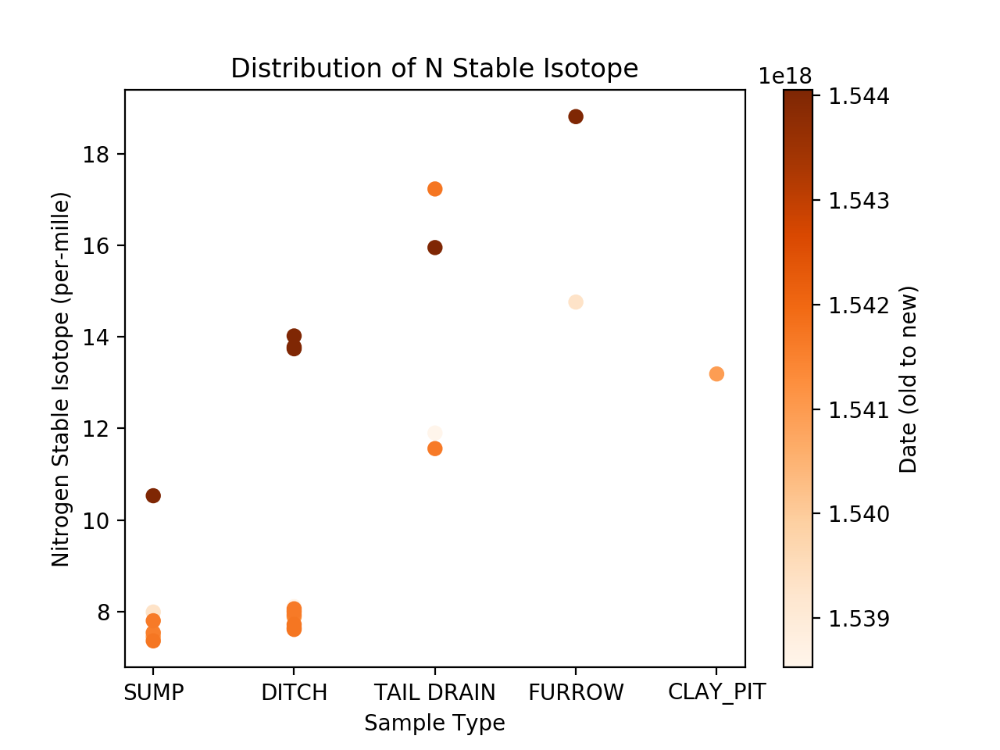

Text(0.5, 1.0, 'Distribution of N Stable Isotope')

In [123]:
# del15N (dpm/L)
plt.figure()
plt.scatter(Site['Updated_Site_Type'],Site['d15NAir (‰)'],c=Site['Date'], cmap='Oranges')
plt.xlabel('Sample Type')
plt.ylabel('Nitrogen Stable Isotope (per-mille)')
# plt.colorbar()
cbar = plt.colorbar()
cbar.set_label('Date (old to new)')
# cbar.ax.set_yticklabels(['8/8/19','','','','','8/1/19'])
plt.title('Distribution of N Stable Isotope')

<IPython.core.display.Javascript object>


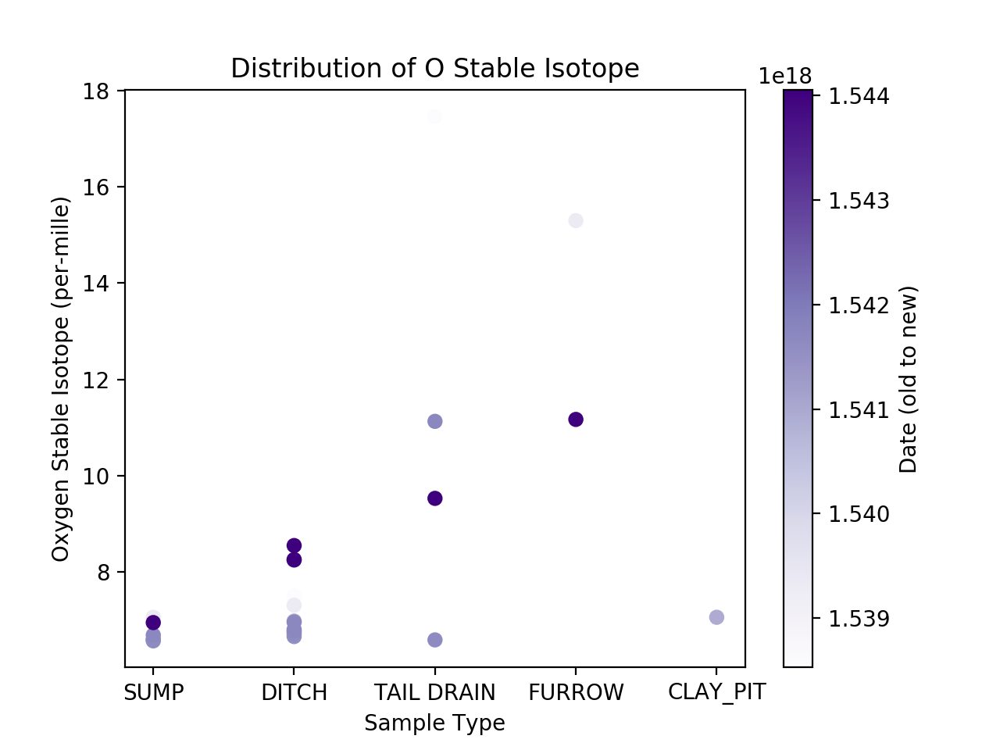

Text(0.5, 1.0, 'Distribution of O Stable Isotope')

In [124]:
# del8O (dpm/L)
plt.figure()
plt.scatter(Site['Updated_Site_Type'],Site['d18OVSMOW  (‰)'],c=Site['Date'], cmap='Purples')
plt.xlabel('Sample Type')
plt.ylabel('Oxygen Stable Isotope (per-mille)')
# plt.colorbar()
cbar = plt.colorbar()
cbar.set_label('Date (old to new)')
# cbar.ax.set_yticklabels(['8/8/19','','','','','8/1/19'])
plt.title('Distribution of O Stable Isotope')

## Bar Plots & Sample Distribution by Season 

<IPython.core.display.Javascript object>


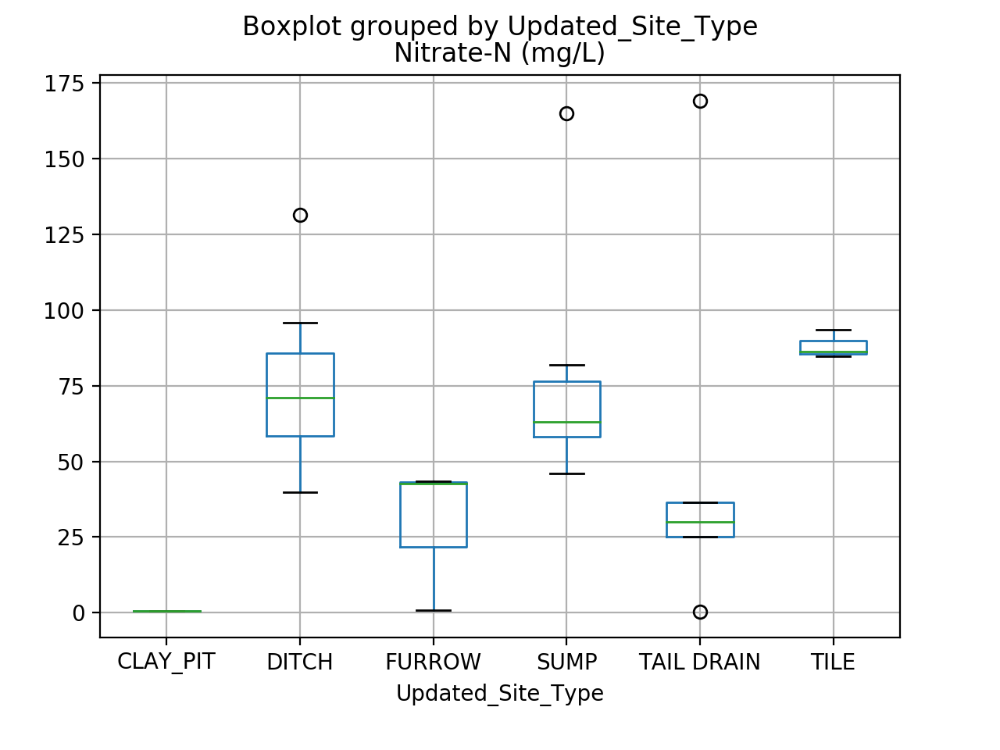

In [125]:
Site.boxplot('Nitrate-N (mg/L)','Updated_Site_Type')

<IPython.core.display.Javascript object>


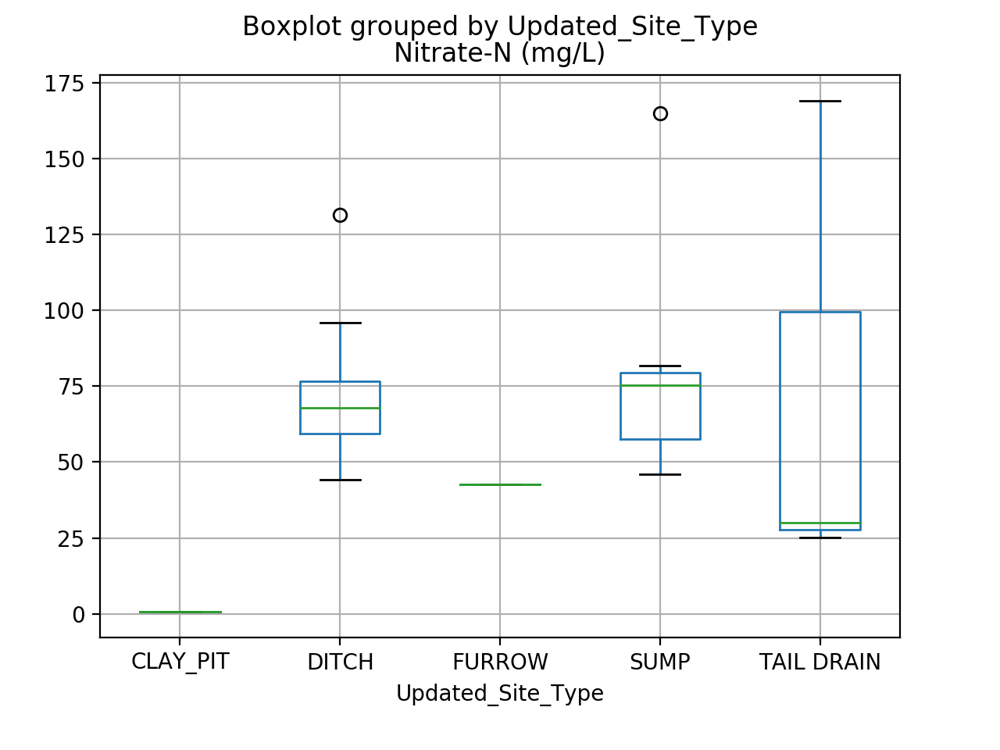

In [126]:
dry2018_df.boxplot('Nitrate-N (mg/L)','Updated_Site_Type')

<IPython.core.display.Javascript object>


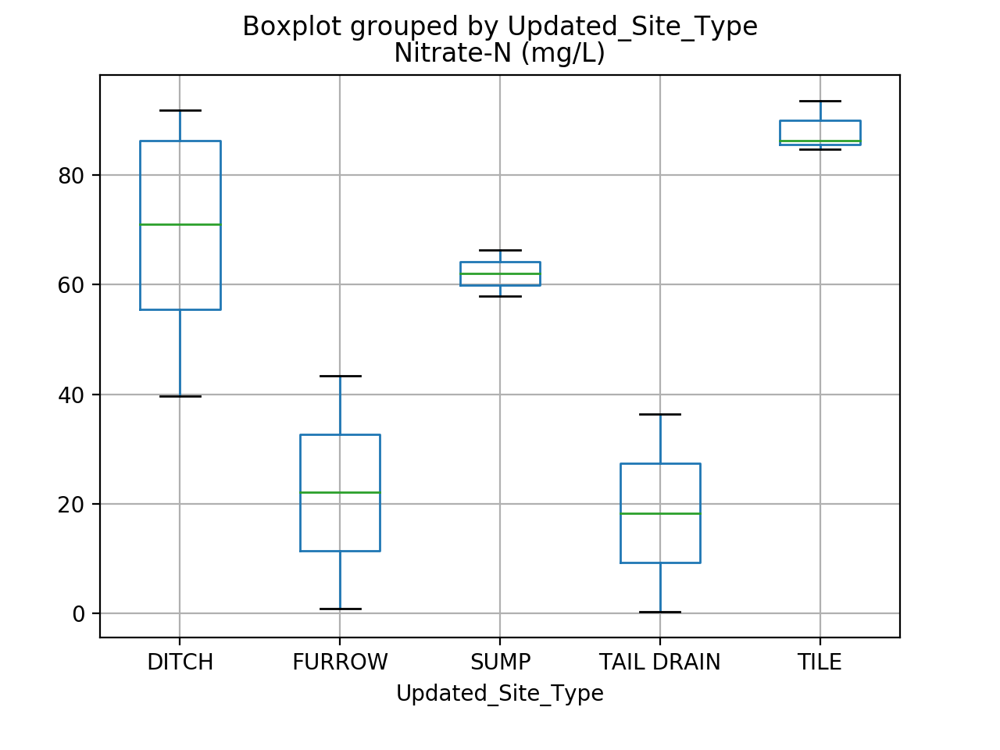

In [161]:
wet2019_df.boxplot('Nitrate-N (mg/L)','Updated_Site_Type')

<IPython.core.display.Javascript object>


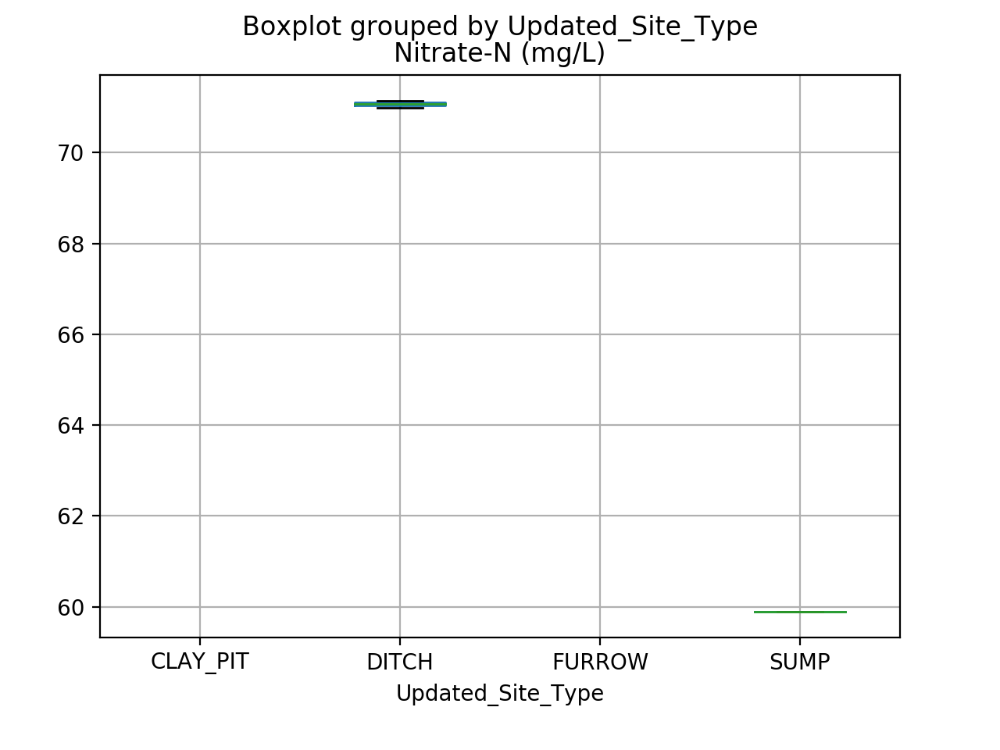

In [162]:
dry2019_df.boxplot('Nitrate-N (mg/L)','Updated_Site_Type')

## Histograms for each variable (over all, not by sample type) 

<IPython.core.display.Javascript object>


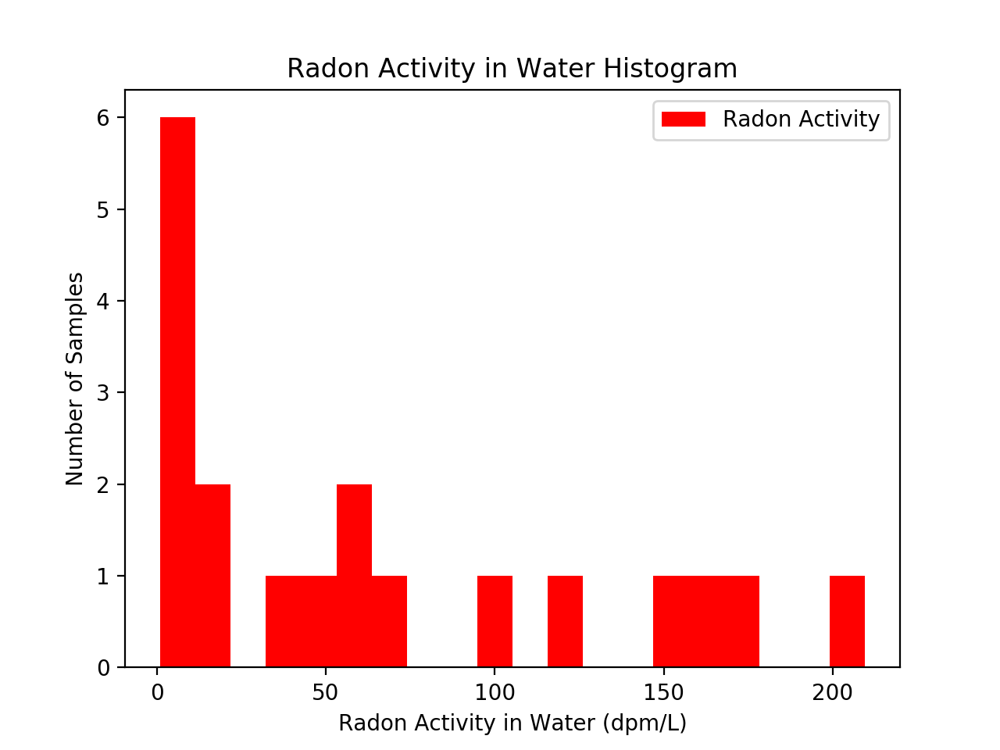

In [163]:
plt.figure()
plt.hist(Site['Decay Corrected Avg Rn_wat (dpm/L)'],20, color='r', label='Radon Activity')
plt.xlabel('Radon Activity in Water (dpm/L)')
plt.ylabel('Number of Samples')
plt.title('Radon Activity in Water Histogram')
plt.legend()

<IPython.core.display.Javascript object>


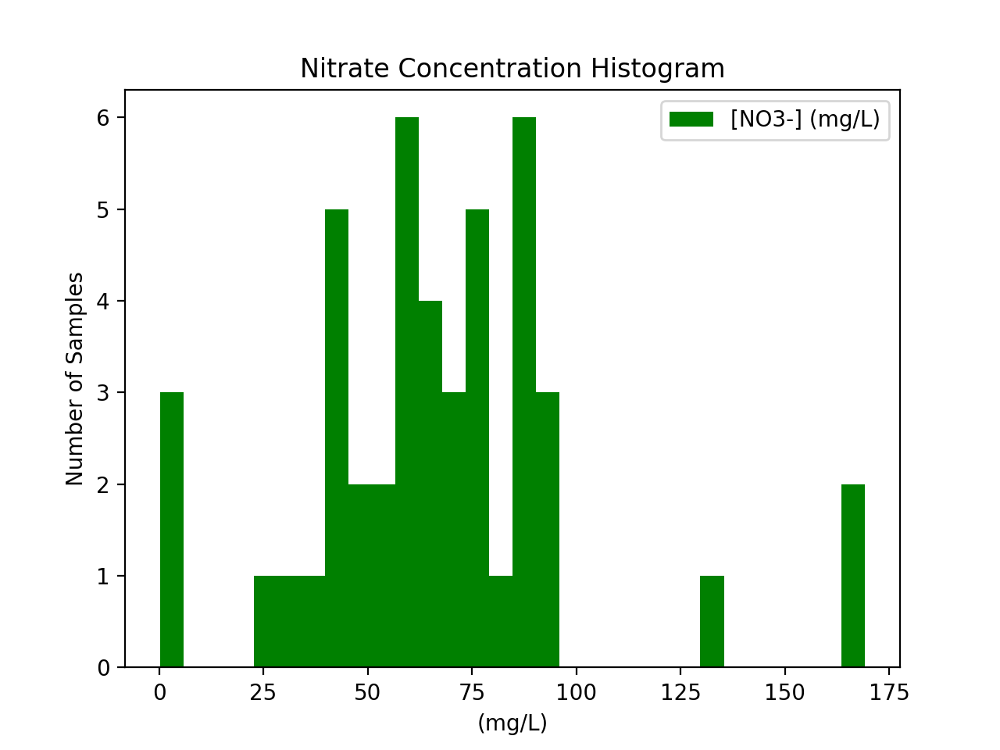

In [130]:
# Nitrate Concentration 
plt.figure()
plt.hist(Site['Nitrate-N (mg/L)'],30, label='[NO3-] (mg/L)',color='green')
plt.xlabel('(mg/L)')
plt.ylabel('Number of Samples')
plt.title('Nitrate Concentration Histogram')
plt.legend()

<IPython.core.display.Javascript object>


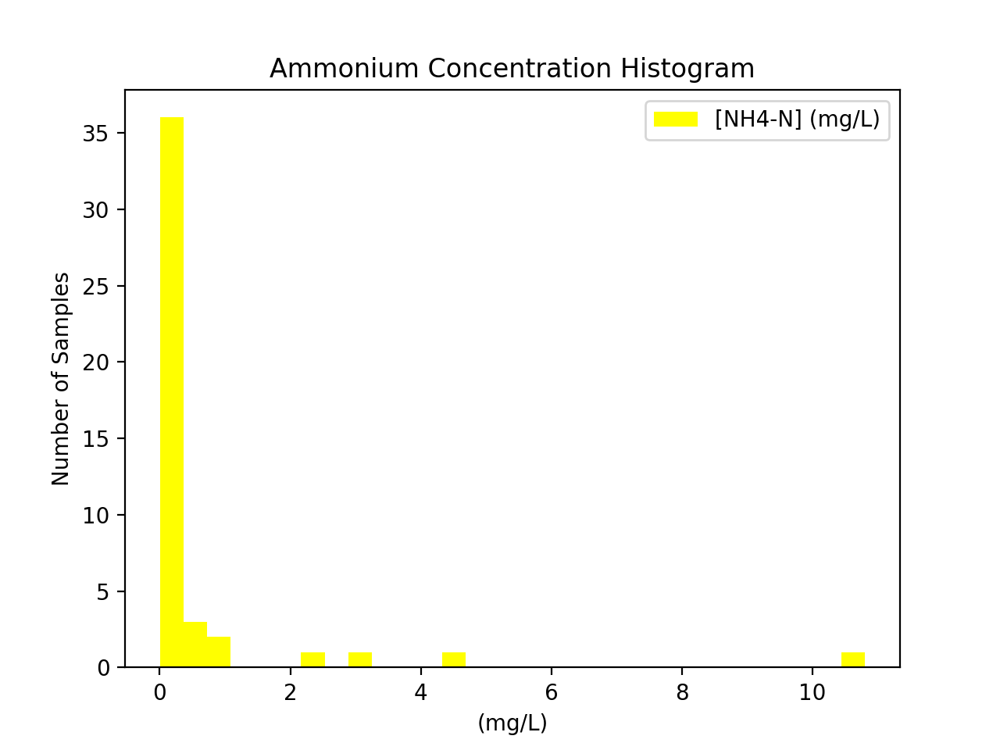

In [131]:
# Ammonium Concentrations
plt.figure()
plt.hist(Site['Ammonia (mg/L)'],30, label='[NH4-N] (mg/L)',color='yellow')
plt.xlabel('(mg/L)')
plt.ylabel('Number of Samples')
plt.title('Ammonium Concentration Histogram')
plt.legend()

<IPython.core.display.Javascript object>


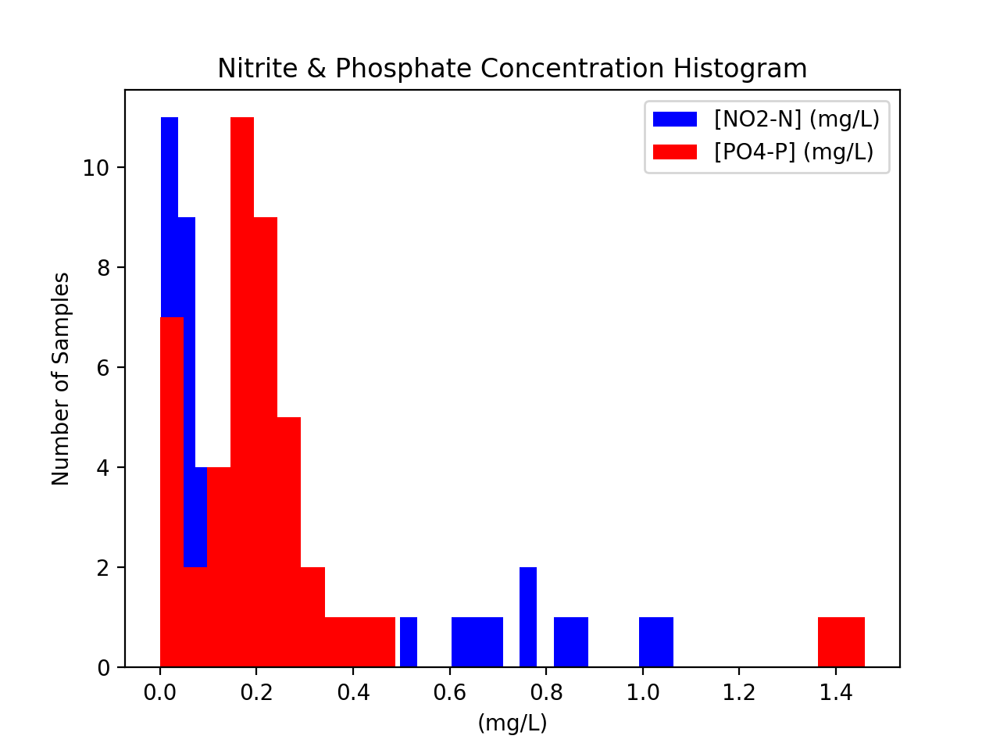

In [132]:
# Phosphate and Nitrite Concentrations
plt.figure()
plt.hist(Site['Nitrite (mg/L)'],30, label='[NO2-N] (mg/L)',color='blue')
plt.hist(Site['Phosphate (mg/L)'],30, label='[PO4-P] (mg/L)',color='red')
plt.xlabel('(mg/L)')
plt.ylabel('Number of Samples')
plt.title('Nitrite & Phosphate Concentration Histogram')
plt.legend()

<IPython.core.display.Javascript object>


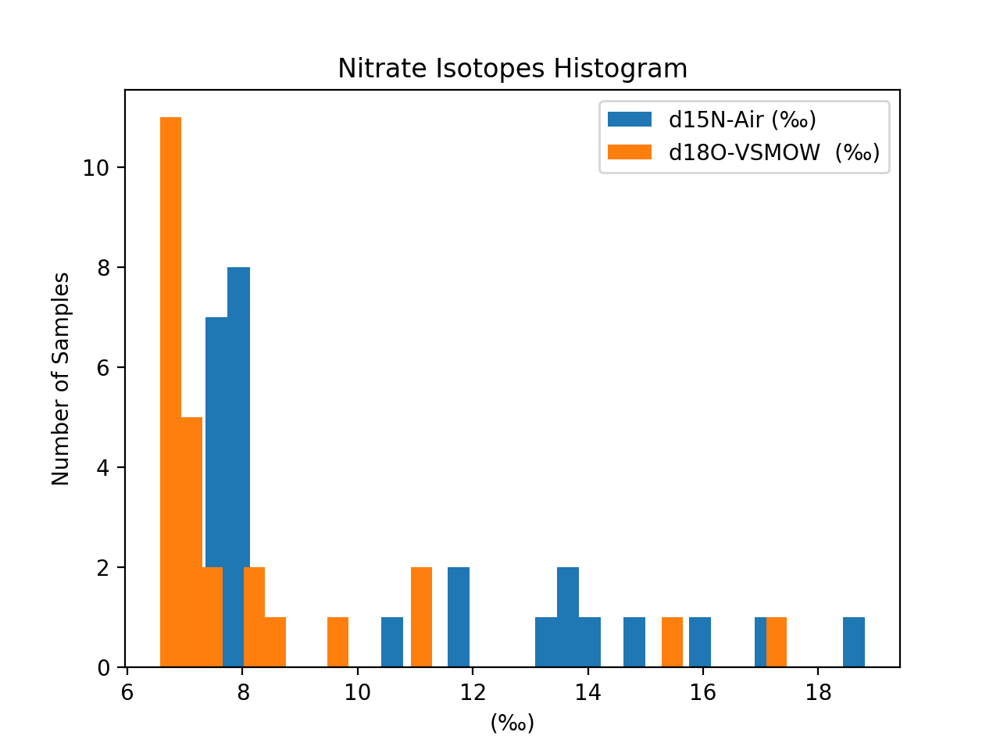

In [164]:
# Isotopes (del15N & del18O)
plt.figure()
plt.hist(Site['d15NAir (‰)'],30, label='d15N-Air (‰)')
plt.hist(Site['d18OVSMOW  (‰)'],30, label='d18O-VSMOW  (‰)')
plt.xlabel('(‰)')
plt.ylabel('Number of Samples')
plt.title('Nitrate Isotopes Histogram')
plt.legend()

<IPython.core.display.Javascript object>


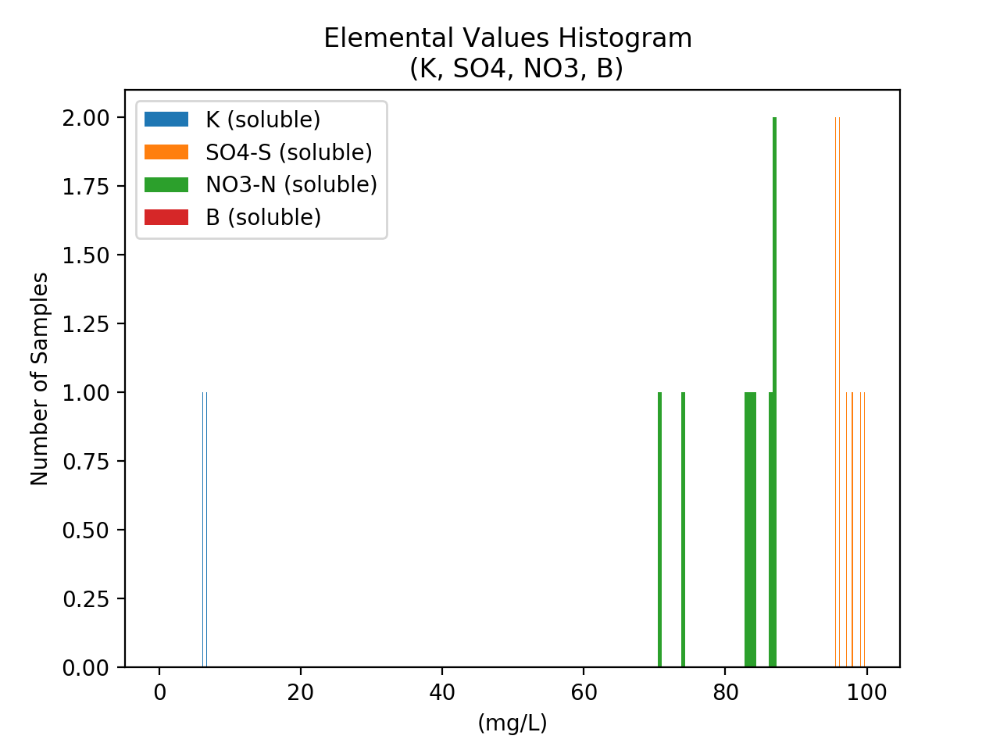

In [134]:
# Elemental Ions (K, SO4, NO3, B)
plt.figure()
plt.hist(Site['K (Soluble) (mg/L)'],30, label='K (soluble)')
plt.hist(Site['SO4-S(Sol S) (mg/L)'],30, label='SO4-S (soluble)')
plt.hist(Site['NO3-N (mg/L)'],30, label='NO3-N (soluble)')
plt.hist(Site['B (Soluble) (mg/L)'],30, label='B (soluble)')
plt.xlabel('(mg/L)')
plt.ylabel('Number of Samples')
plt.title('Elemental Values Histogram \n (K, SO4, NO3, B)')
plt.legend()

<IPython.core.display.Javascript object>


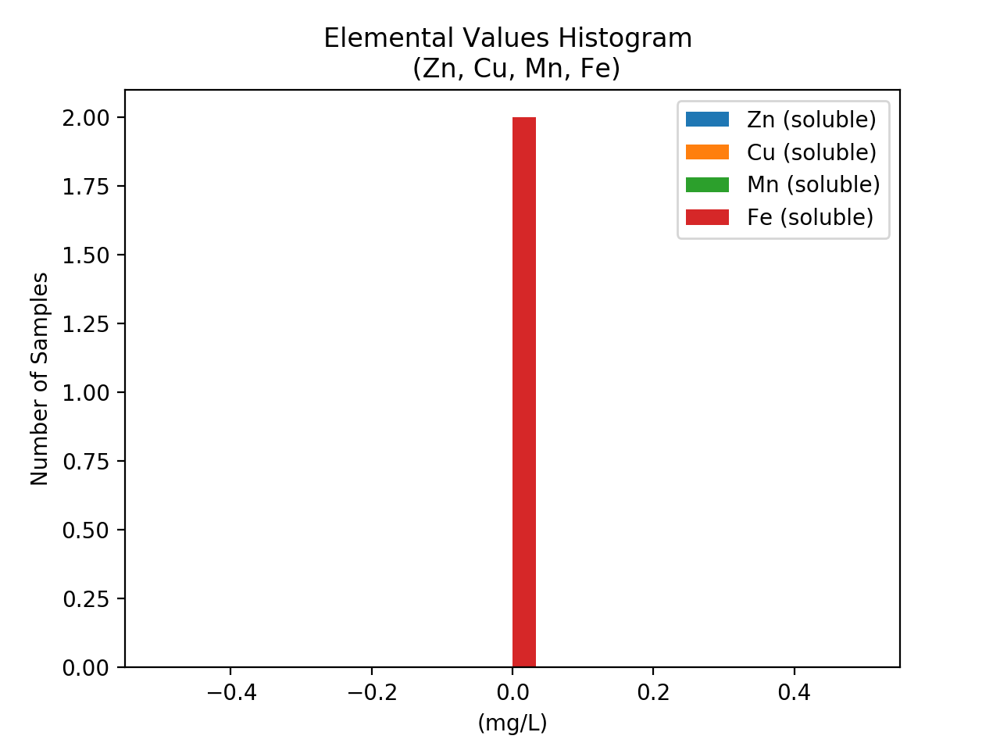

In [165]:
# Elemental Metals (Zn, Cu, Mn, Fe)
plt.figure()
plt.hist(Site['Zn (Soluble) (mg/L)'],30, label='Zn (soluble)')
plt.hist(Site['Cu (Soluble) (mg/L)'],30, label='Cu (soluble)')
plt.hist(Site['Mn (Soluble) (mg/L)'],30, label='Mn (soluble)')
plt.hist(Site['Fe (Soluble) (mg/L)'],30, label='Fe (soluble)')
plt.xlabel('(mg/L)')
plt.ylabel('Number of Samples')
plt.title('Elemental Values Histogram \n (Zn, Cu, Mn, Fe)')
plt.legend()

<IPython.core.display.Javascript object>


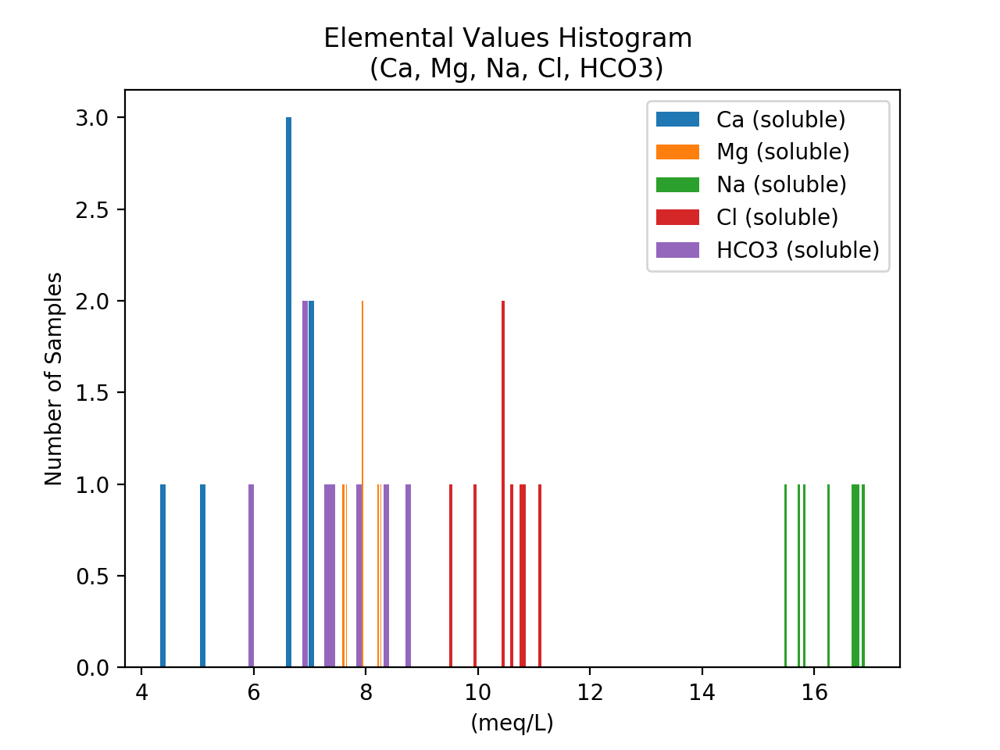

In [136]:
# Elemental Ions (Ca, Mg, Na, Cl, HCO3)
plt.figure()
plt.hist(Site['Ca (Soluble) (meq/L)'],30, label='Ca (soluble)')
plt.hist(Site['Mg (Soluble) (meq/L)'],30, label='Mg (soluble)')
plt.hist(Site['Na (Soluble) (meq/L)'],30, label='Na (soluble)')
plt.hist(Site['Cl (meq/L)'],30, label='Cl (soluble)')
plt.hist(Site['HCO3 (meq/L)'],30, label='HCO3 (soluble)')
plt.xlabel('(meq/L)')
plt.ylabel('Number of Samples')
plt.title('Elemental Values Histogram \n (Ca, Mg, Na, Cl, HCO3)')
plt.legend()

In [137]:
Site.keys()

Index(['index', 'Date', 'Site Name', 'Type', 'Correct Data? ', 'Updated? ',
       'Rn for equilibrated?', 'Depth/Temp/Wind', 'Site Name.1', 'Site_type',
       'Updated_Site_Type', 'Description', 'Latitude', 'Longitude', 'Label',
       'Replecate ', 'Total_Name', 'Sample Analysis', 'BB Sample Color',
       'BB Sediment?', 'Rn-222', 'Nutrients', 'Isotopes', 'Elements',
       'Water Iso.', 'Bkgd Run #', 'RAD7 Run #', 'BB #', 'Volume (L)',
       'Background Date', 'Collection DateTime', 'Analysis Date',
       'Analysis DateTime', 'Decay Time (days)', 'Radon Flag', 'Wind',
       'Nutrient Sample Name', 'Isotope Sample Names', 'Nut. Sample Freezer',
       'Iso. Sample Freezer', 'Elem. Sample Location',
       'Water Isotope Location', 'Field Irrigation Status ', 'Crop Status',
       'Rotation', 'Notes', 'Depth (meters)', 'Area (m2)', 'Flow Rate (m/s)',
       'Water Temp (deg C)', 'Cond. (uS/cm)', 'Salinity ', 'pH', 'DO (%)',
       'DO (mg/L)', 'Date_Check', 'Name_Check', 'Phospha

## Timeseries!! 
Variable Timeseries by season for the different site types 

##### Nitrate

<IPython.core.display.Javascript object>


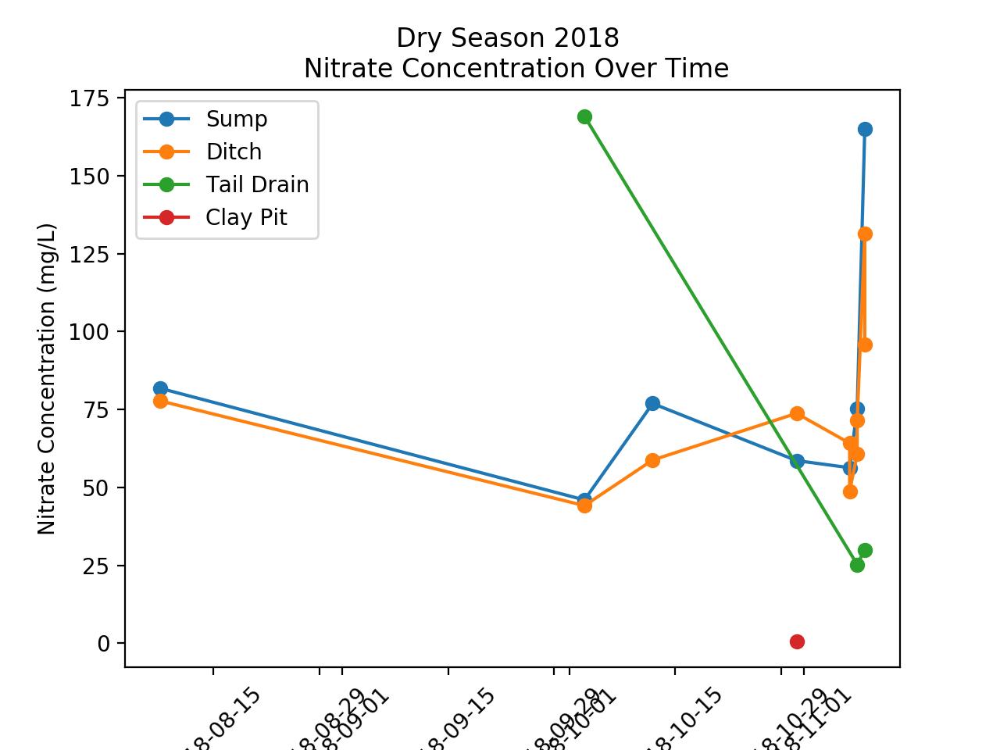

(array([736921., 736935., 736938., 736952., 736966., 736968., 736982.,
        736996., 736999.]), <a list of 9 Text xticklabel objects>)

In [166]:

# Dry Season Nitrate Timeseries

xvar = dry2018_df['Date']
yvar = dry2018_df['Nitrate-N (mg/L)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('Nitrate Concentration (mg/L)')
plt.title('Dry Season 2018 \n Nitrate Concentration Over Time')
plt.legend()
plt.xticks(rotation=45)


<IPython.core.display.Javascript object>


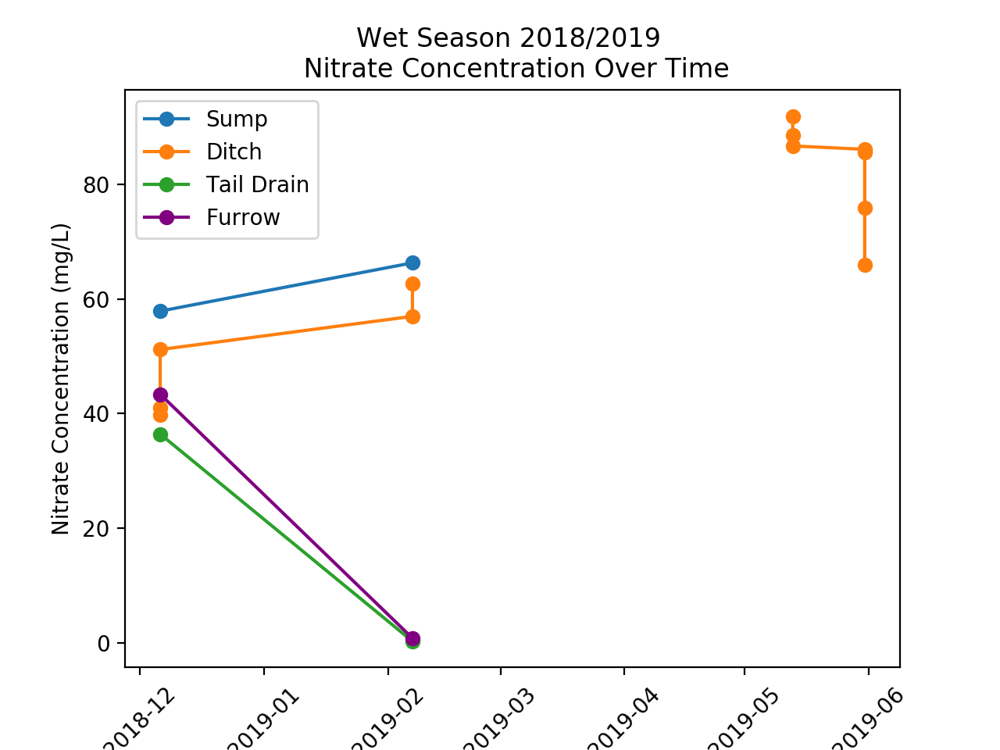

(array([737029., 737060., 737091., 737119., 737150., 737180., 737211.]),
 <a list of 7 Text xticklabel objects>)

In [167]:
# Wet season 2018/2019 Nitrate Timeseries

xvar = wet2019_df['Date']
yvar = wet2019_df['Nitrate-N (mg/L)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
# plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('Nitrate Concentration (mg/L)')
plt.title('Wet Season 2018/2019 \n Nitrate Concentration Over Time')
plt.legend()
plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


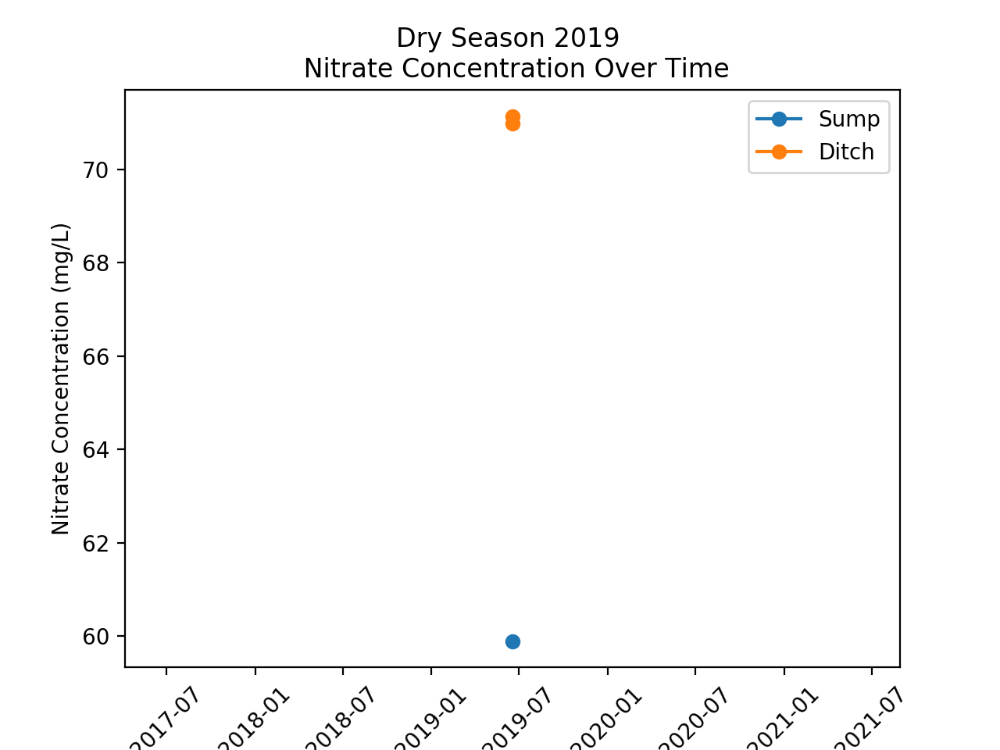

(array([736511., 736695., 736876., 737060., 737241., 737425., 737607.,
        737791., 737972.]), <a list of 9 Text xticklabel objects>)

In [168]:

# Dry Season 2019 Nitrate Timeseries

xvar = dry2019_df['Date']
yvar = dry2019_df['Nitrate-N (mg/L)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
# plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
# plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('Nitrate Concentration (mg/L)')
plt.title('Dry Season 2019 \n Nitrate Concentration Over Time')
plt.legend()
plt.xticks(rotation=45)

##### Radon

<IPython.core.display.Javascript object>


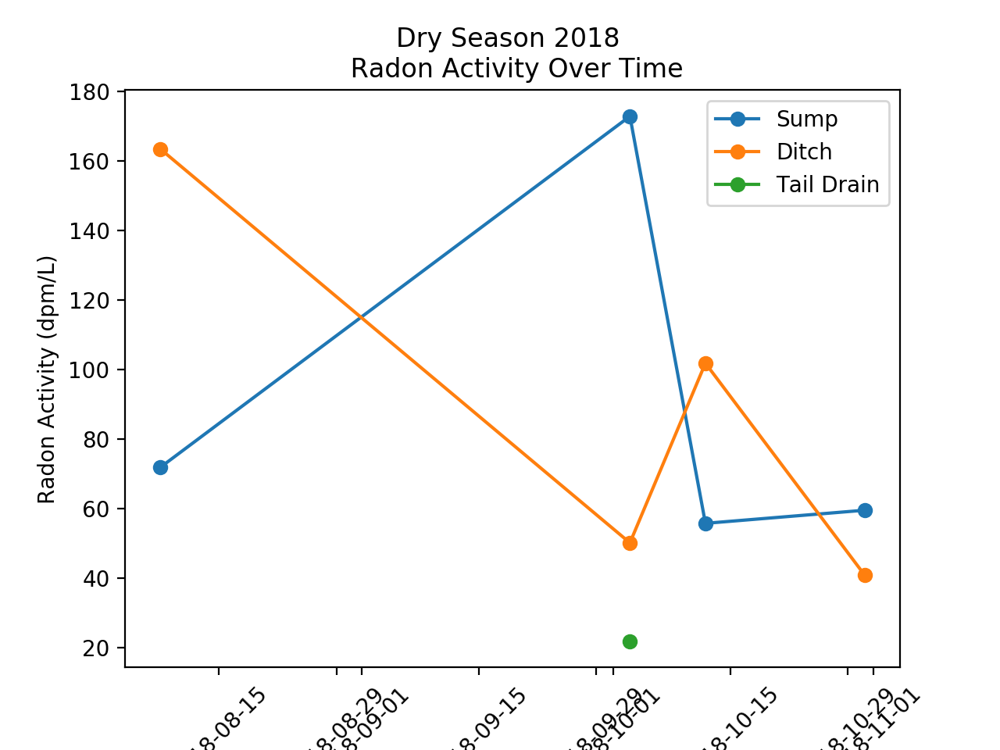

(array([736921., 736935., 736938., 736952., 736966., 736968., 736982.,
        736996., 736999.]), <a list of 9 Text xticklabel objects>)

In [169]:

# Dry Season Radon Timeseries

xvar = dry2018_df['Date']
yvar = dry2018_df['Decay Corrected Avg Rn_wat (dpm/L)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
# plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('Radon Activity (dpm/L)')
plt.title('Dry Season 2018 \n Radon Activity Over Time')
plt.legend()
plt.xticks(rotation=45)



/Users/jacquelinechisholm/miniconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


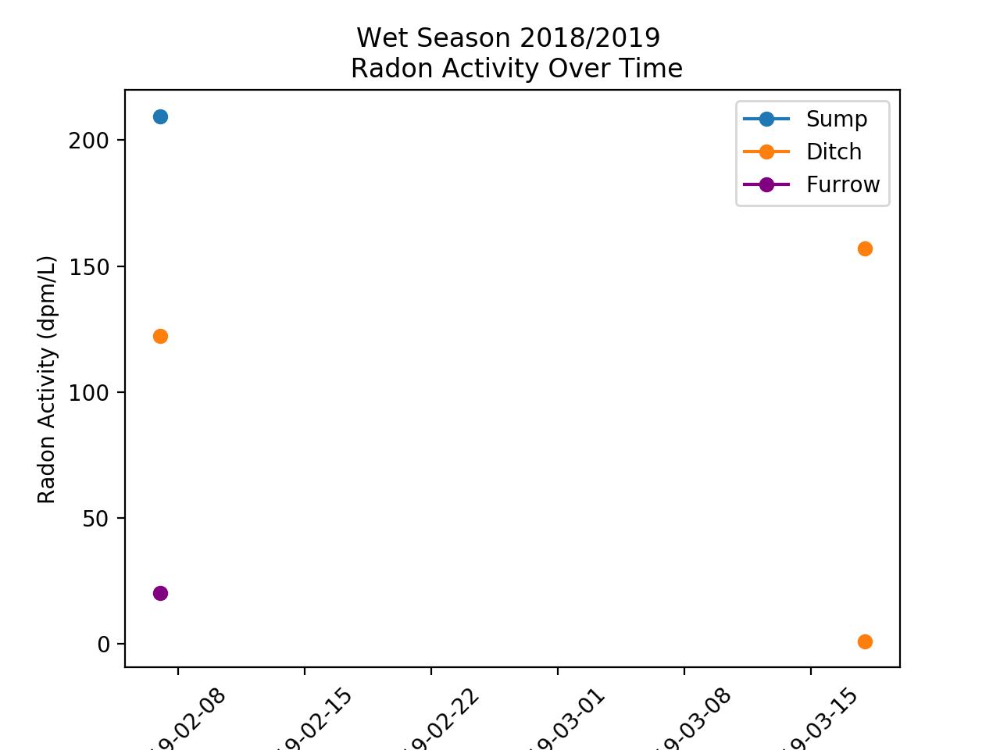

(array([737098., 737105., 737112., 737119., 737126., 737133.]),
 <a list of 6 Text xticklabel objects>)

In [142]:
# Wet season 2018/2019 Radon Timeseries

xvar = wet2019_df['Date']
yvar = wet2019_df['Decay Corrected Avg Rn_wat (dpm/L)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
# plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('Radon Activity (dpm/L)')
plt.title('Wet Season 2018/2019 \n Radon Activity Over Time')
plt.legend()
plt.xticks(rotation=45)

In [143]:

# Dry Season 2019 Radon Timeseries

xvar = dry2019_df['Date']
yvar = dry2019_df['Decay Corrected Avg Rn_wat (dpm/L)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
# plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('Radon Activity (dpm/L)')
plt.title('Dry Season 2019 \n Radon Activity Over Time')
plt.legend()
plt.xticks(rotation=45)

<IPython.core.display.Javascript object>

(array([737263., 737264., 737265., 737266., 737267., 737268., 737269.,
        737270., 737271., 737272.]), <a list of 10 Text xticklabel objects>)

##### N Stable Isotopes 

<IPython.core.display.Javascript object>


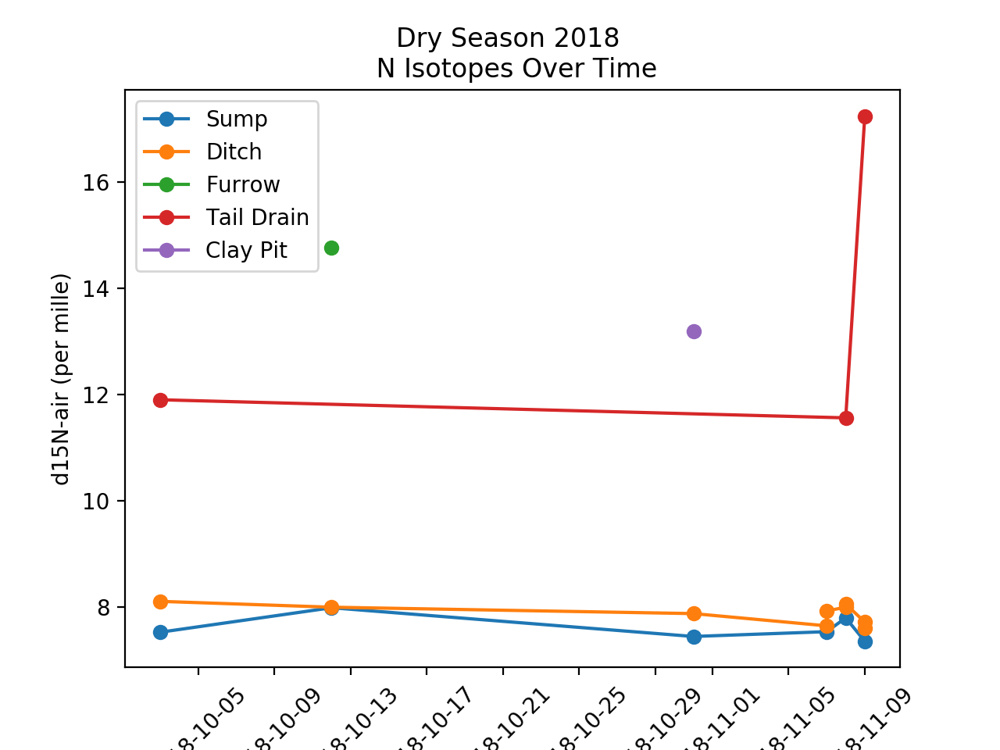

(array([736972., 736976., 736980., 736984., 736988., 736992., 736996.,
        736999., 737003., 737007.]), <a list of 10 Text xticklabel objects>)

In [144]:

# Dry Season N Isotopes Timeseries

xvar = dry2018_df['Date']
yvar = dry2018_df['d15NAir (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d15N-air (per mille)')
plt.title('Dry Season 2018 \n N Isotopes Over Time')
plt.legend()
plt.xticks(rotation=45)



<IPython.core.display.Javascript object>


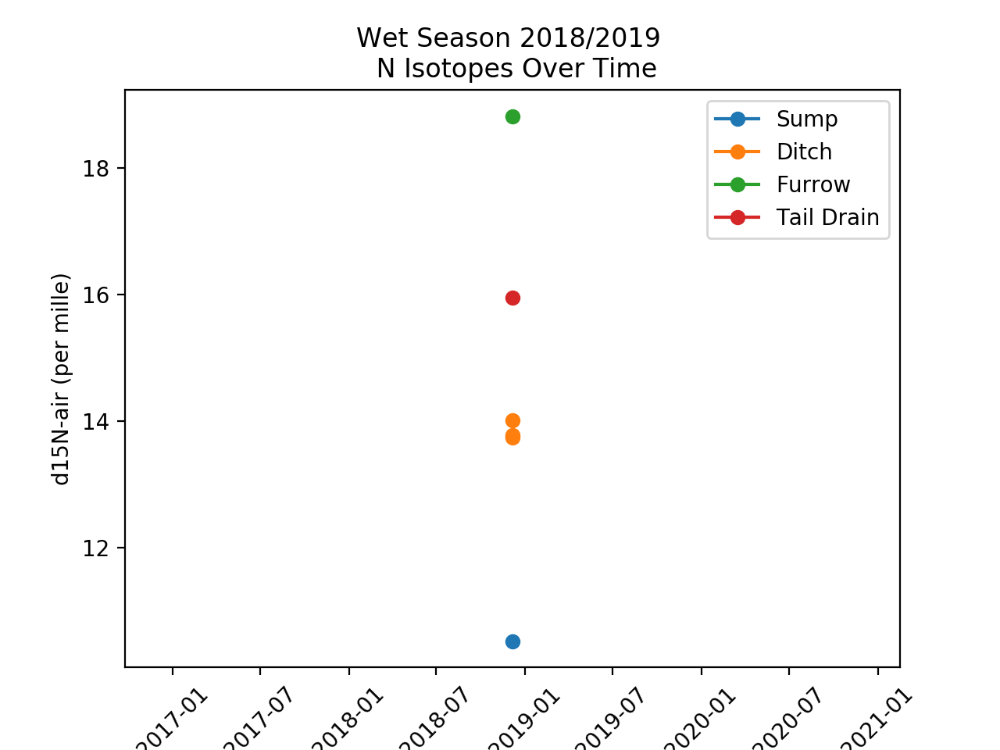

(array([736330., 736511., 736695., 736876., 737060., 737241., 737425.,
        737607., 737791.]), <a list of 9 Text xticklabel objects>)

In [170]:
# Wet season 2018/2019 N Stable Isotopes Timeseries

xvar = wet2019_df['Date']
yvar = wet2019_df['d15NAir (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
# plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d15N-air (per mille)')
plt.title('Wet Season 2018/2019 \n N Isotopes Over Time')
plt.legend()
plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


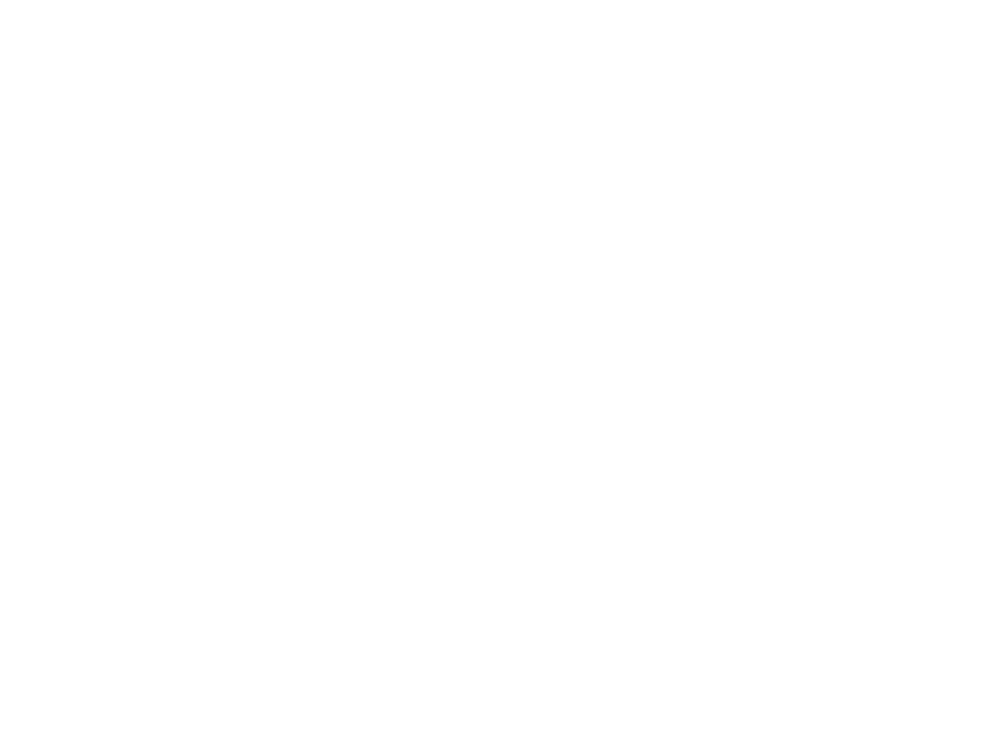

In [171]:

# Dry Season 2019 N Stable Isotopes Timeseries

xvar = dry2019_df['Date']
yvar = dry2019_df['d15NAir (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d15N-air (per mille)')
plt.title('Dry Season 2019 \n N Isotopes Over Time')
plt.legend()
# plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


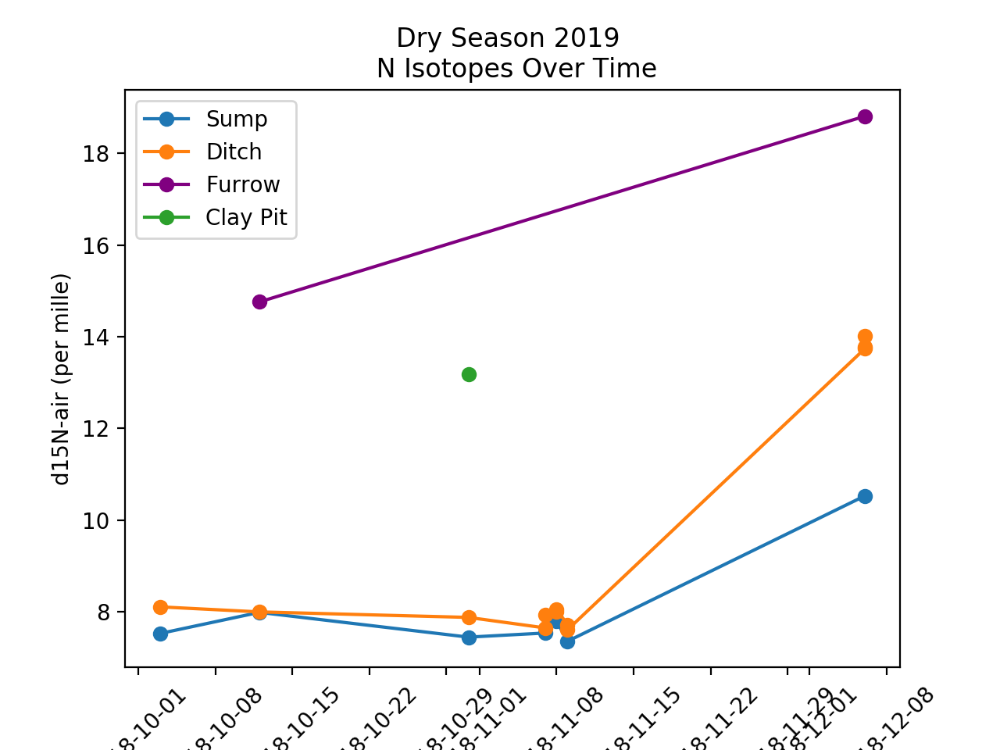

(array([736968., 736975., 736982., 736989., 736996., 736999., 737006.,
        737013., 737020., 737027., 737029., 737036.]),
 <a list of 12 Text xticklabel objects>)

In [173]:

# Dry Season 2019 N Stable Isotopes Timeseries

xvar = Site['Date']
yvar = Site['d15NAir (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d15N-air (per mille)')
plt.title('Dry Season 2019 \n N Isotopes Over Time')
plt.legend()
plt.xticks(rotation=45)

##### O Stable Isotopes

<IPython.core.display.Javascript object>


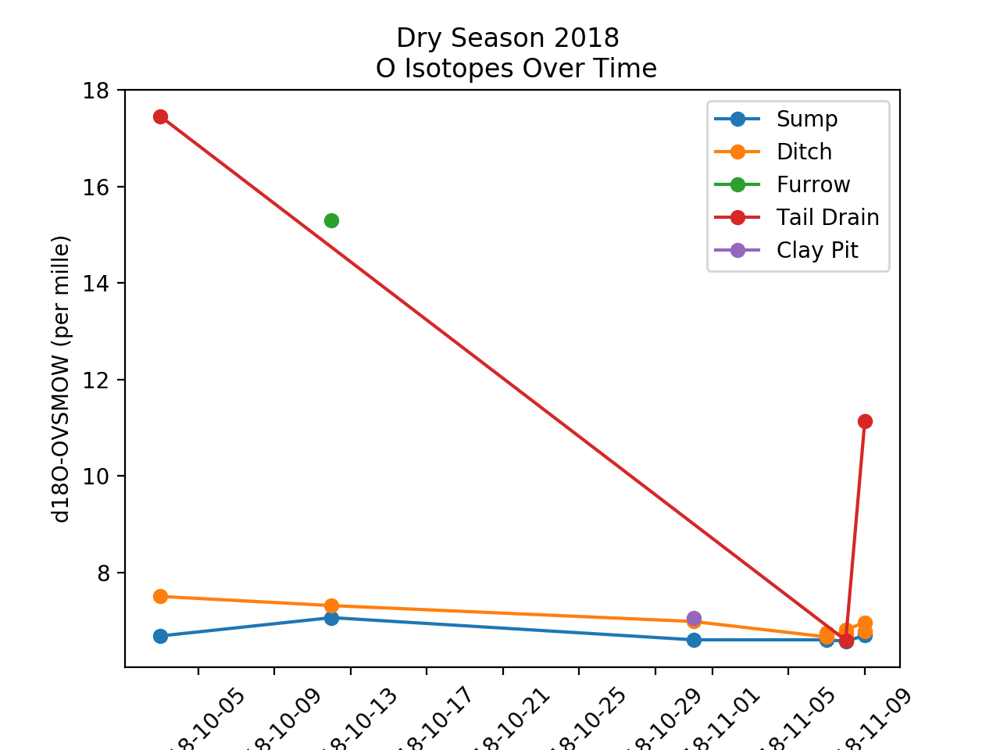

(array([736972., 736976., 736980., 736984., 736988., 736992., 736996.,
        736999., 737003., 737007.]), <a list of 10 Text xticklabel objects>)

In [174]:

# Dry Season O Isotopes Timeseries

xvar = dry2018_df['Date']
yvar = dry2018_df['d18OVSMOW  (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d18O-OVSMOW (per mille)')
plt.title('Dry Season 2018 \n O Isotopes Over Time')
plt.legend()
plt.xticks(rotation=45)




<IPython.core.display.Javascript object>


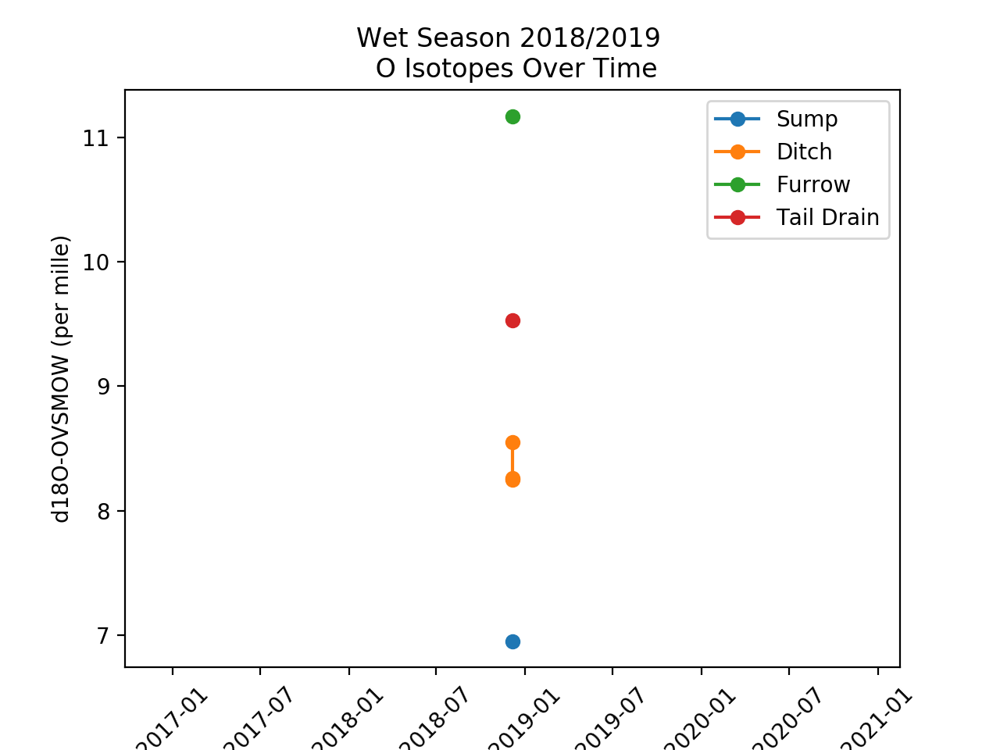

(array([736330., 736511., 736695., 736876., 737060., 737241., 737425.,
        737607., 737791.]), <a list of 9 Text xticklabel objects>)

In [175]:
# Wet season 2018/2019 O Stable Isotopes Timeseries

xvar = wet2019_df['Date']
yvar = wet2019_df['d18OVSMOW  (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
# plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d18O-OVSMOW (per mille)')
plt.title('Wet Season 2018/2019 \n O Isotopes Over Time')
plt.legend()
plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


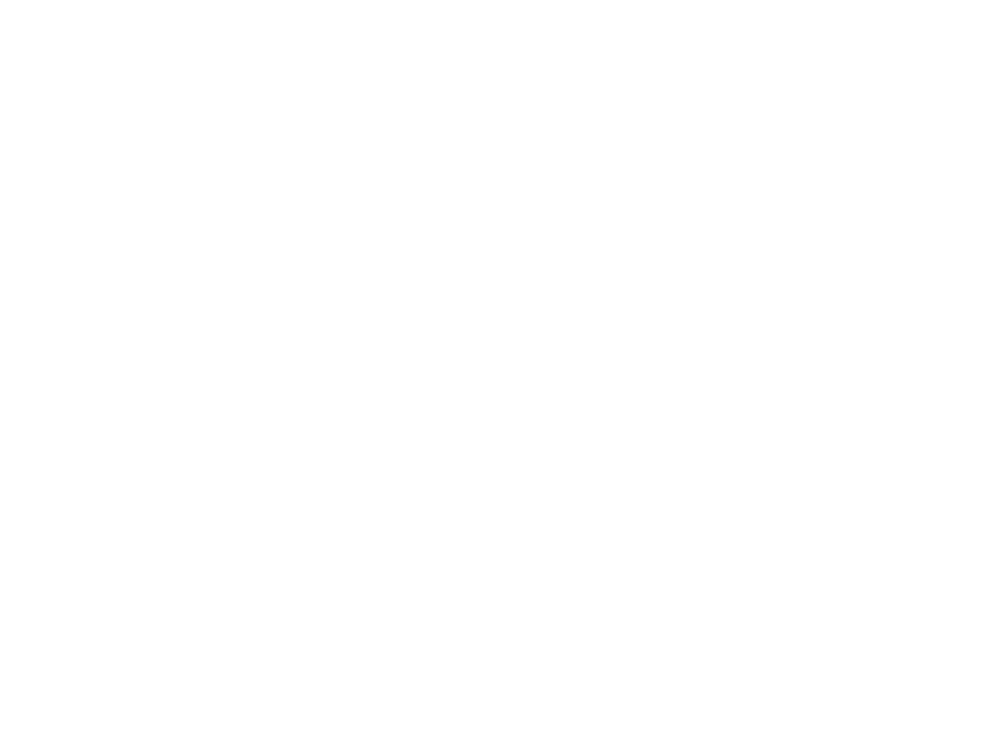

In [176]:

# Dry Season 2019 O Stable Isotopes Timeseries

xvar = dry2019_df['Date']
yvar = dry2019_df['d18OVSMOW  (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d18O-OVSMOW (per mille)')
plt.title('Dry Season 2019 \n O Isotopes Over Time')
plt.legend()
# plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


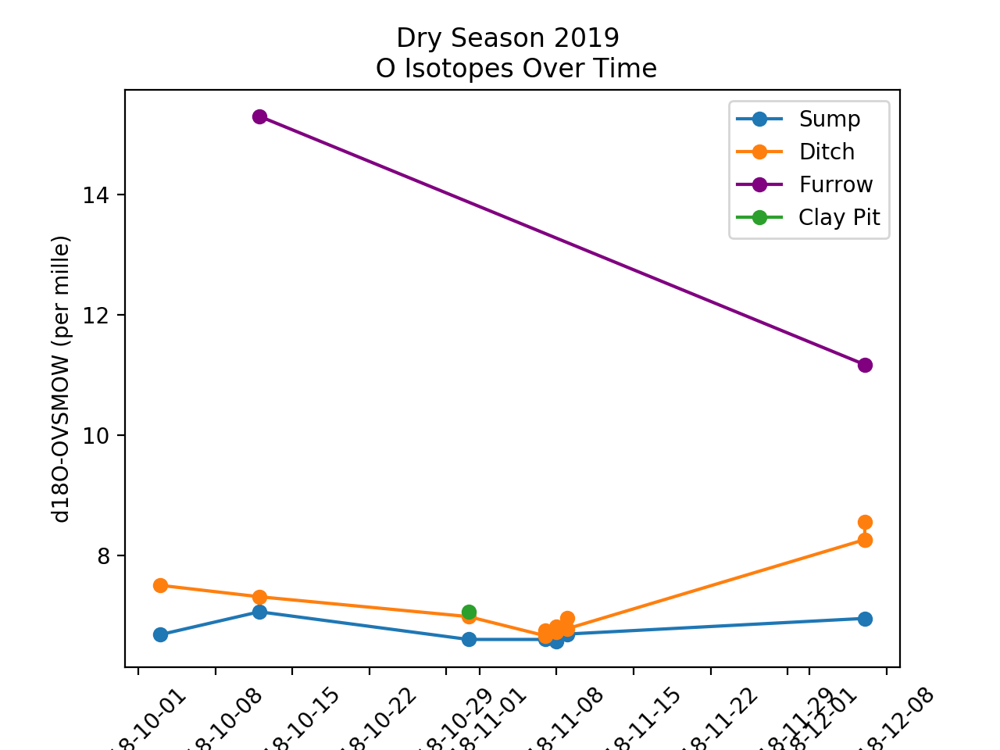

(array([736968., 736975., 736982., 736989., 736996., 736999., 737006.,
        737013., 737020., 737027., 737029., 737036.]),
 <a list of 12 Text xticklabel objects>)

In [179]:

# Dry Season 2019 O Stable Isotopes Timeseries

xvar = Site['Date']
yvar = Site['d18OVSMOW  (‰)']

plt.figure()
plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
# plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',color='purple',label='Furrow')
# plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

# plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
# plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
# plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
# plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
# plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
# plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
# plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
# plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

plt.xlabel('Time')
plt.ylabel('d18O-OVSMOW (per mille)')
plt.title('Dry Season 2019 \n O Isotopes Over Time')
plt.legend()
plt.xticks(rotation=45)

###### Elemental Variables

Variables that show differences between sample types and not between duplicates:  [K, Cl]

Variables that do not show as obvious/consistent of differences :  [Ca, Mg, Na, SO4, HCO3, B, Zn, Cu, Mn, Fe]

<IPython.core.display.Javascript object>


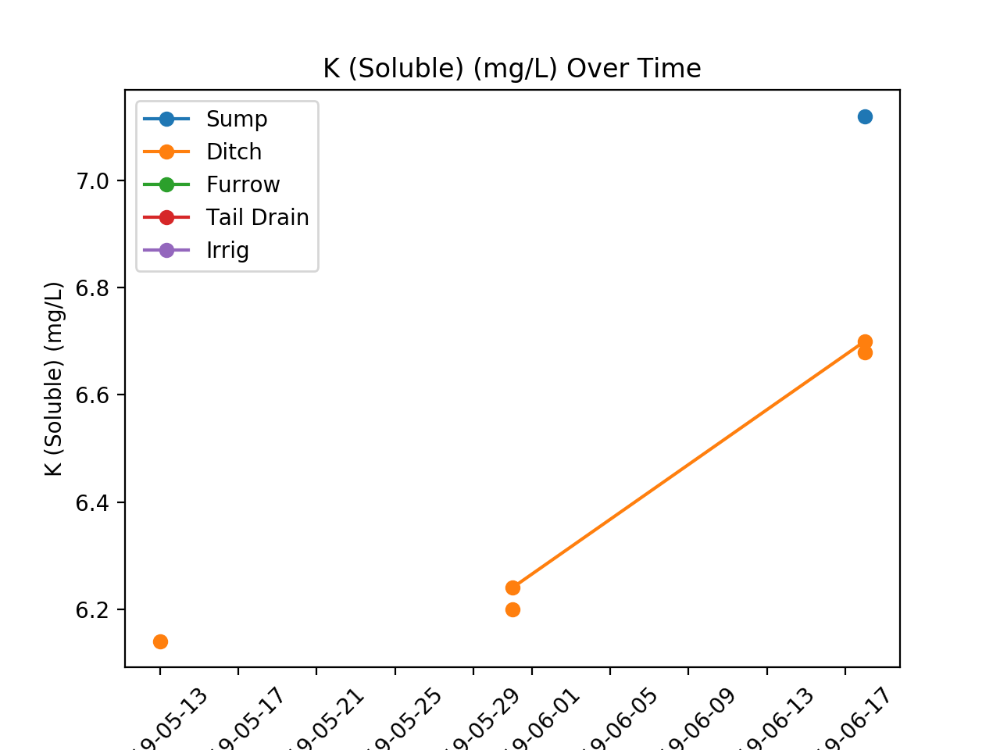

<IPython.core.display.Javascript object>


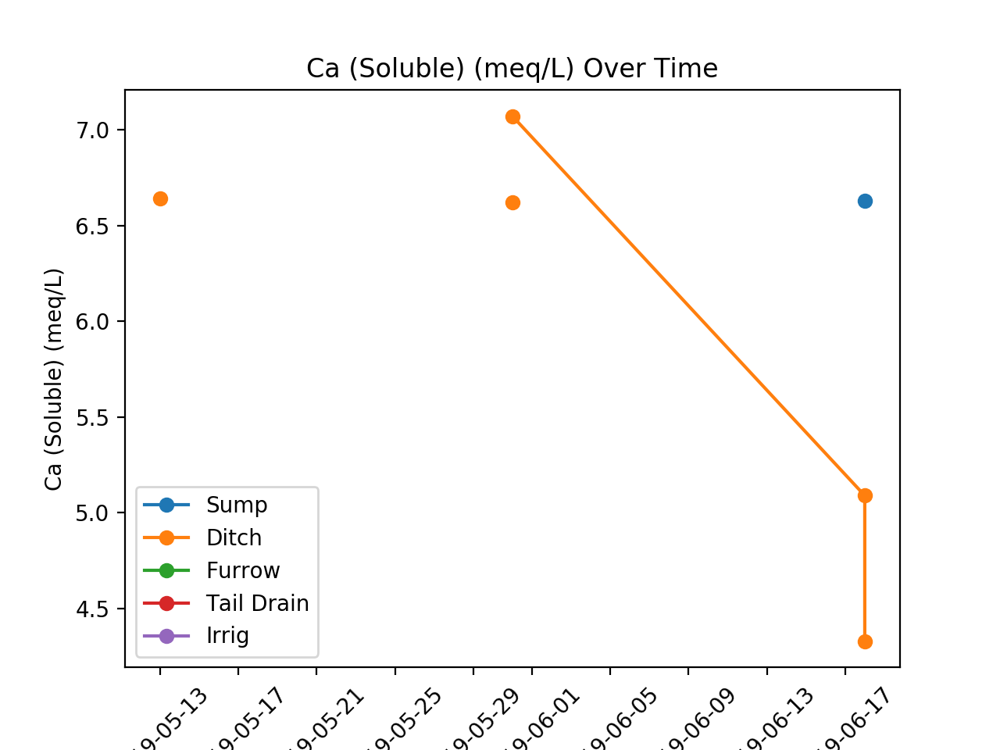

<IPython.core.display.Javascript object>


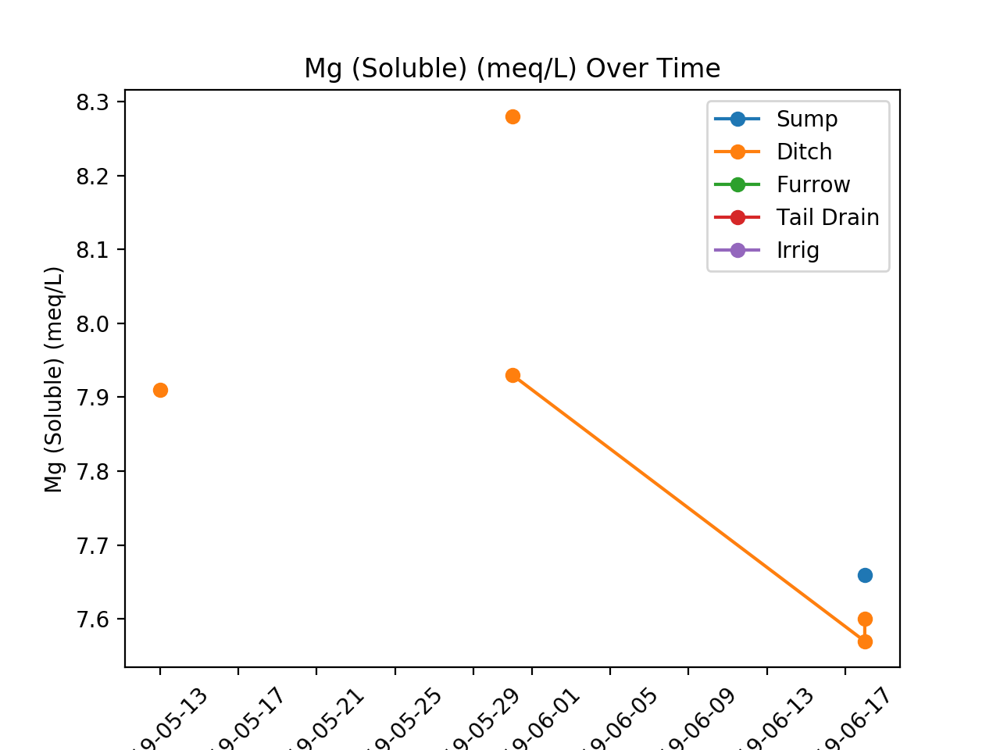

<IPython.core.display.Javascript object>


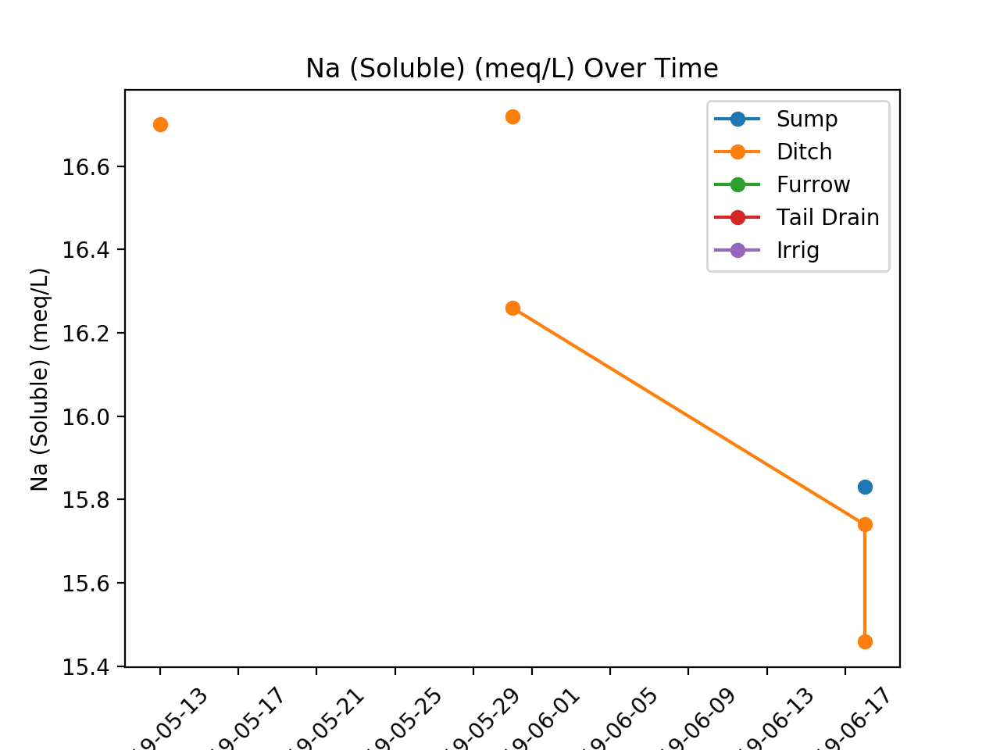

<IPython.core.display.Javascript object>


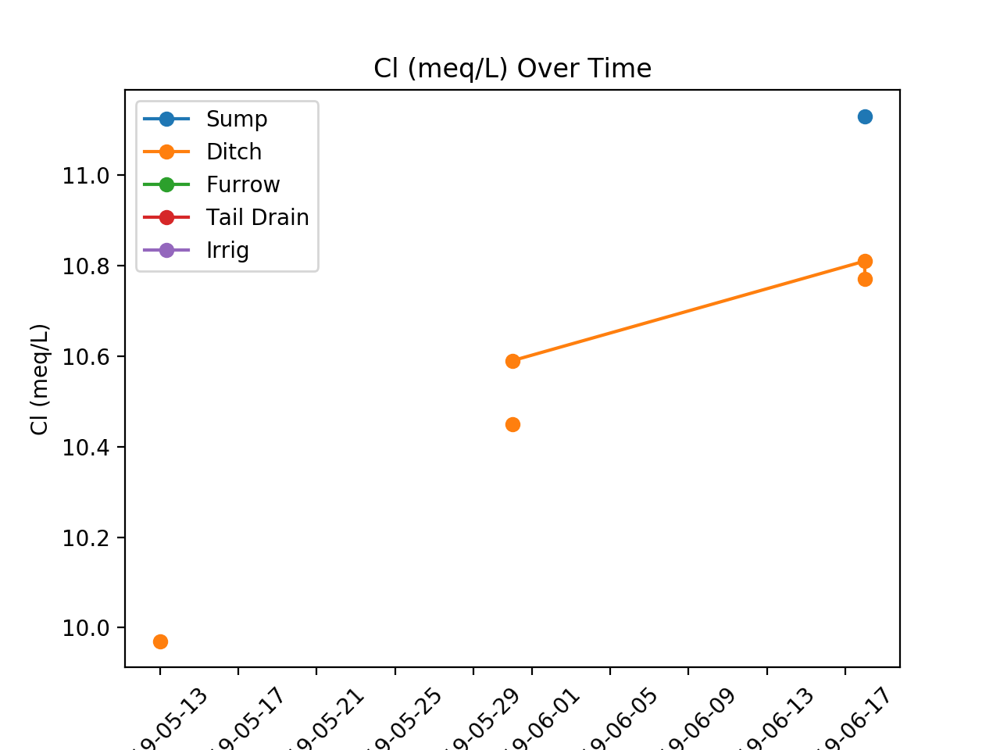

<IPython.core.display.Javascript object>


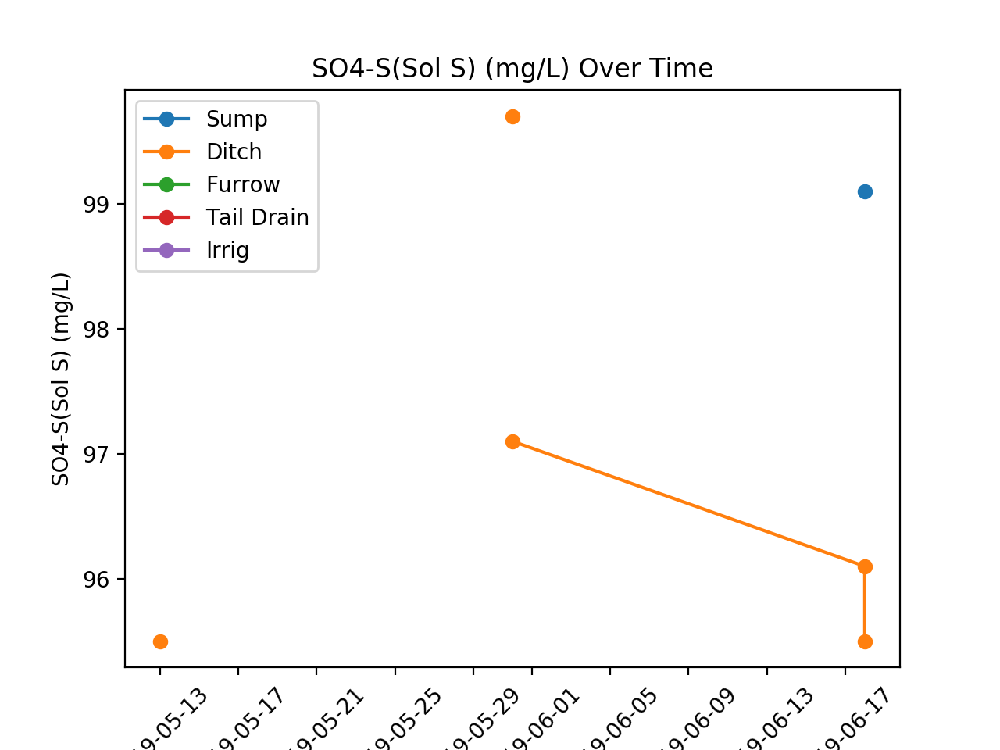

<IPython.core.display.Javascript object>


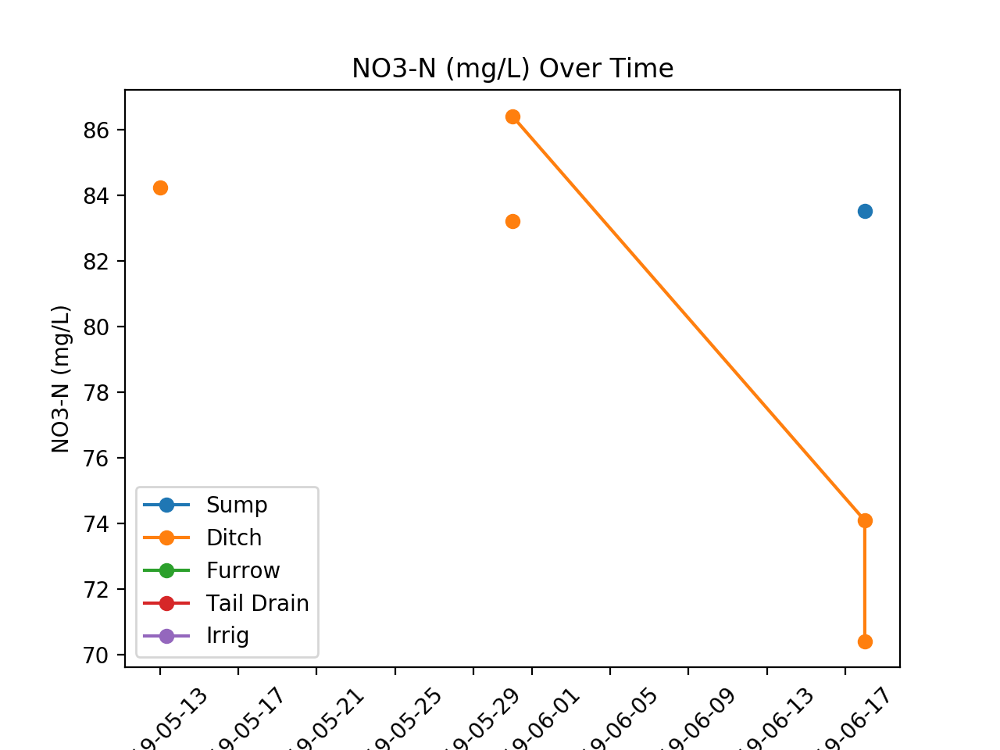

<IPython.core.display.Javascript object>


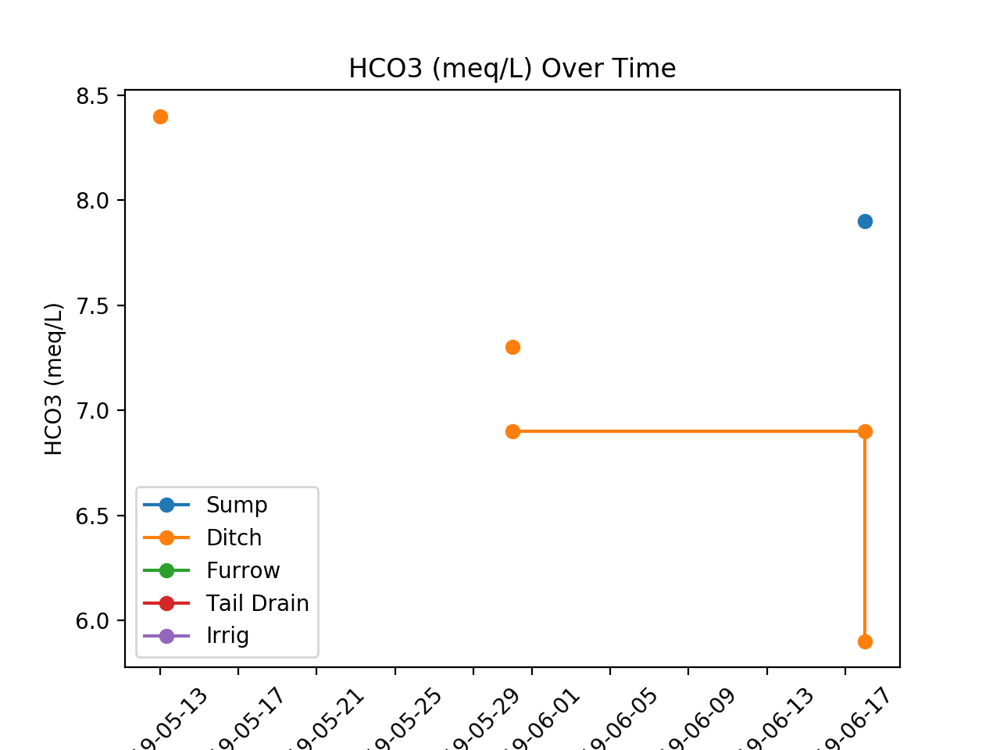

<IPython.core.display.Javascript object>


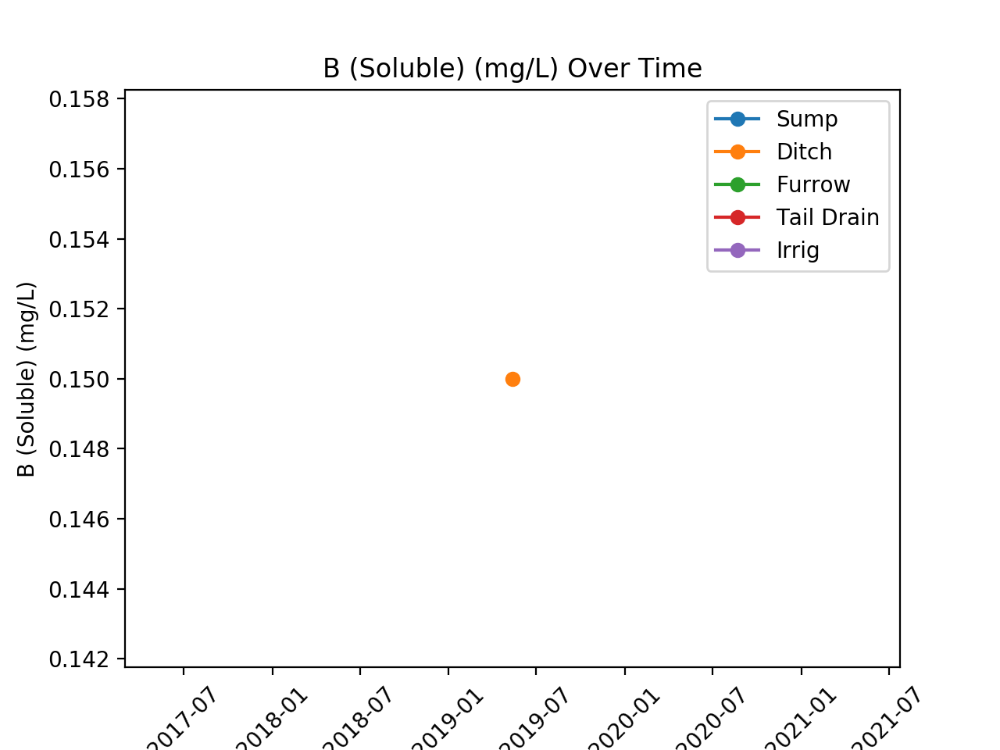

<IPython.core.display.Javascript object>


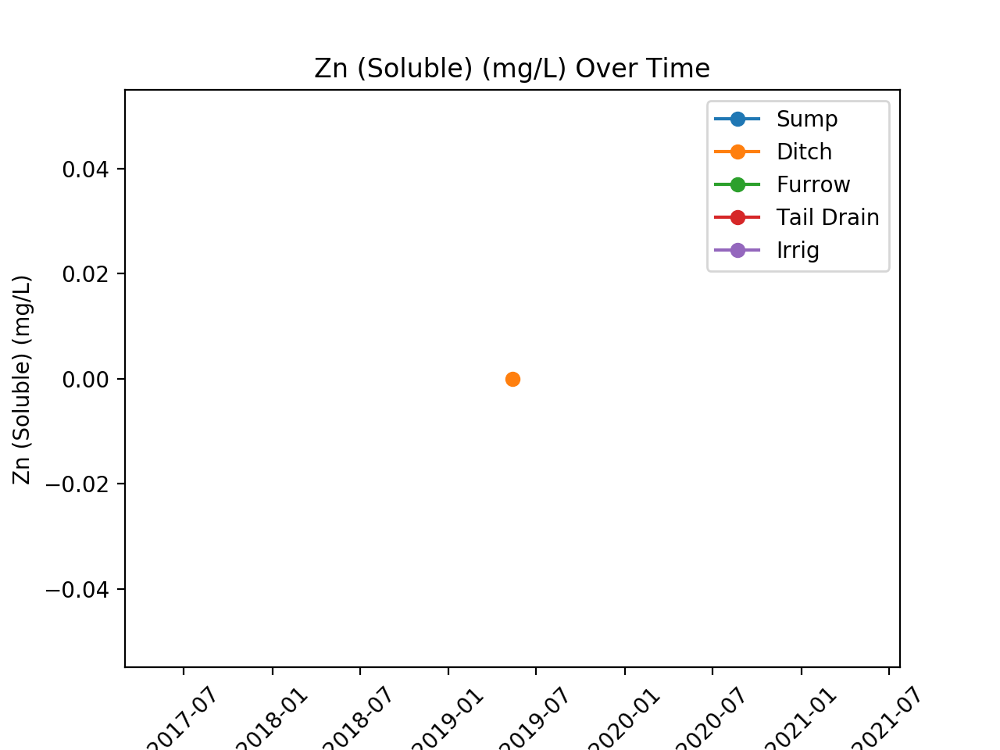

<IPython.core.display.Javascript object>


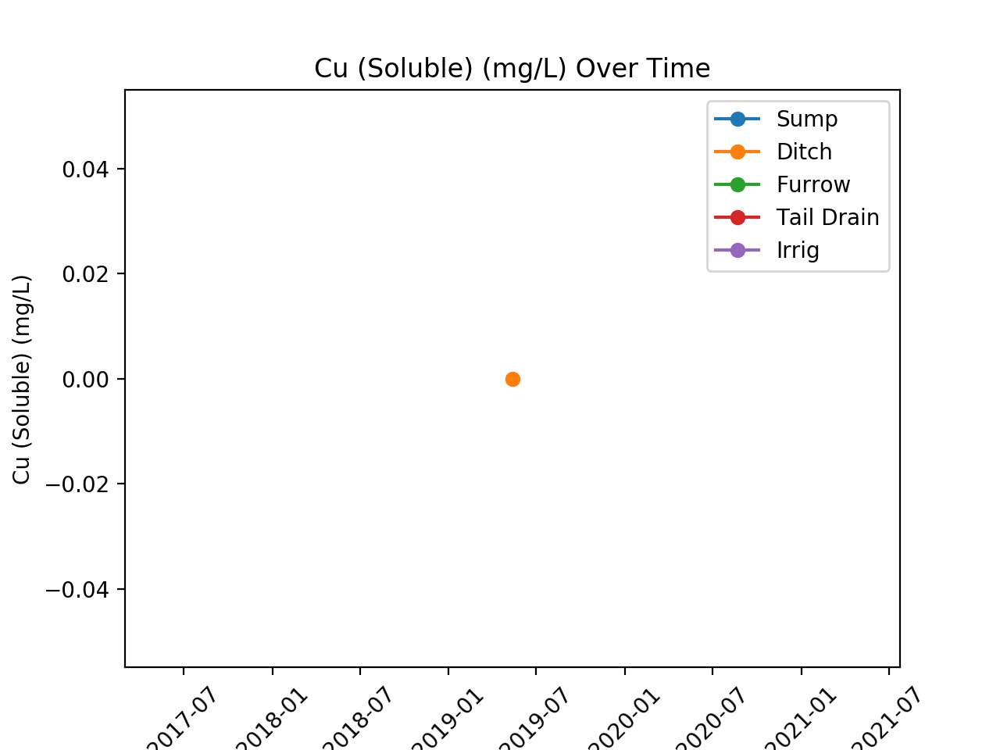

<IPython.core.display.Javascript object>


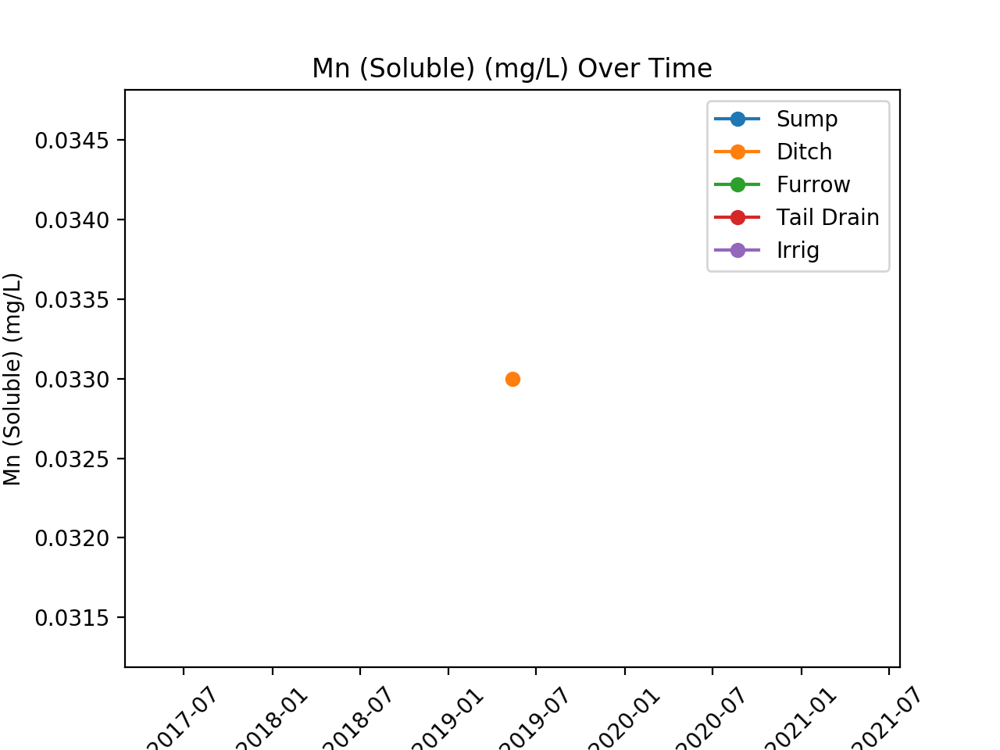

<IPython.core.display.Javascript object>


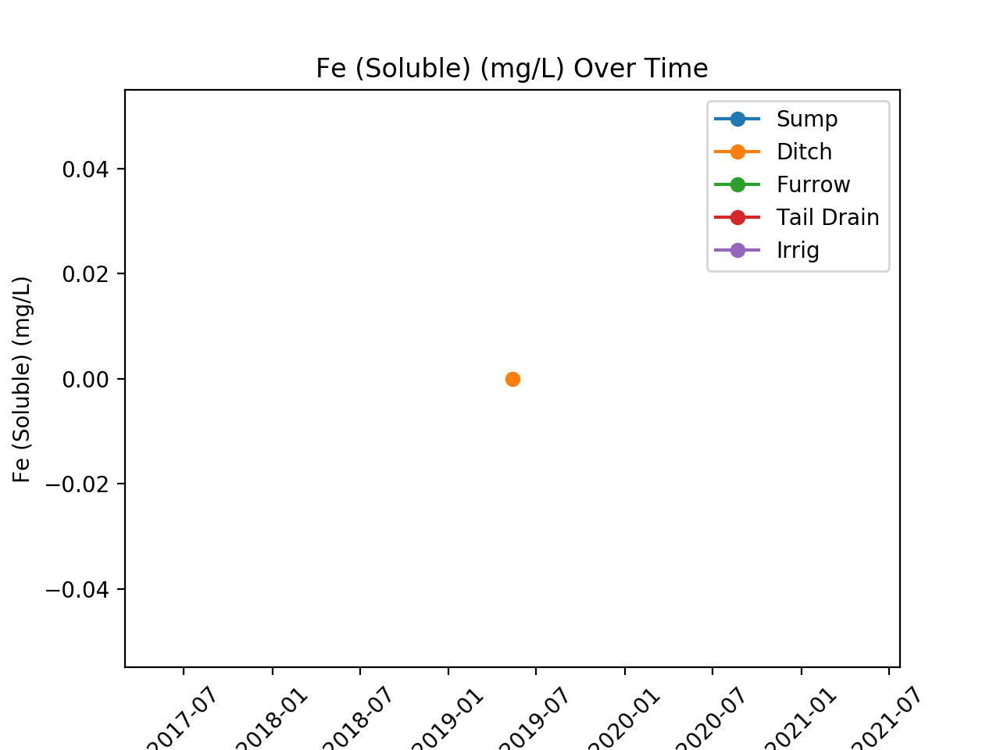

In [180]:
elementals = ['K (Soluble) (mg/L)', 'Ca (Soluble) (meq/L)',
       'Mg (Soluble) (meq/L)', 'Na (Soluble) (meq/L)', 'Cl (meq/L)',
       'SO4-S(Sol S) (mg/L)', 'NO3-N (mg/L)', 'HCO3 (meq/L)',
       'B (Soluble) (mg/L)', 'Zn (Soluble) (mg/L)', 'Cu (Soluble) (mg/L)',
       'Mn (Soluble) (mg/L)', 'Fe (Soluble) (mg/L)']

# Elemental Timeseries


for element in elementals:
    xvar = Site['Date']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('Time')
    plt.ylabel(element)
    plt.title(element+' Over Time')
    plt.legend()
    plt.xticks(rotation=45)

##### Testing for conservative properties... 

Tested elemental variables against other measured variables. 

Could not plot isotopic or radon values b/c there are not samples for the same days (not yet loaded into the spreadsheet...) 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


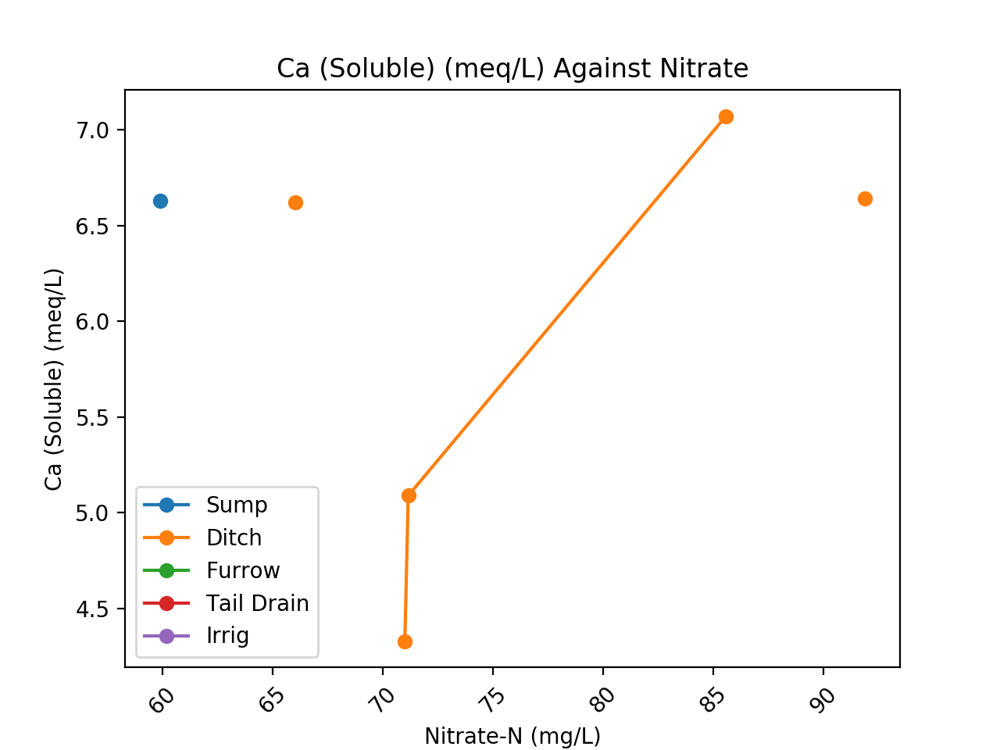

<IPython.core.display.Javascript object>


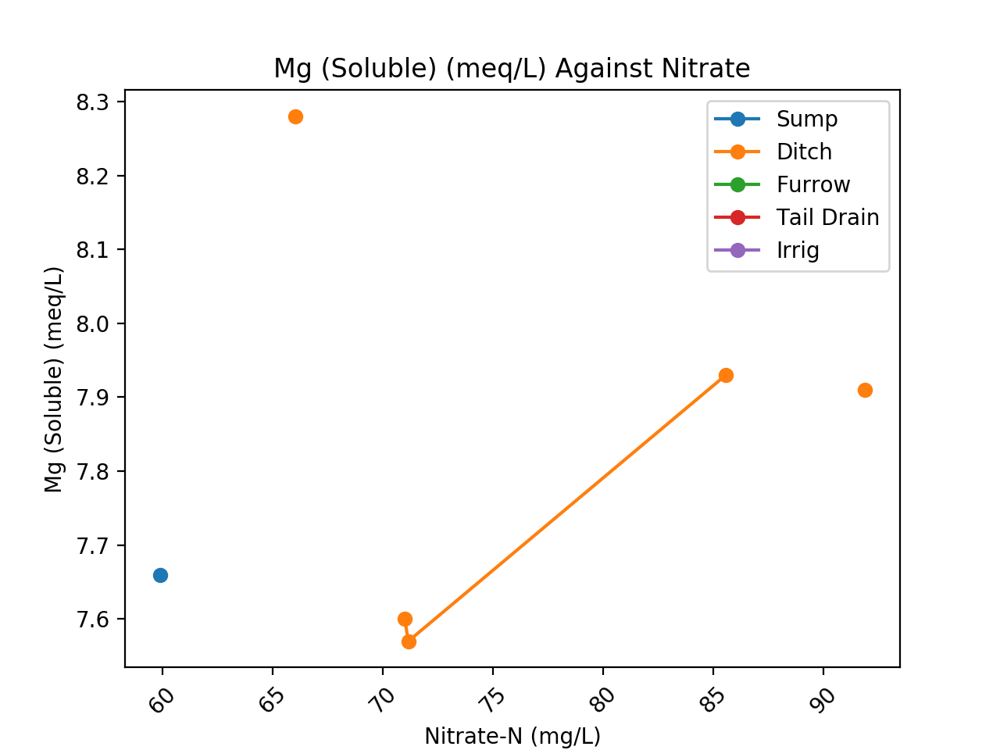

<IPython.core.display.Javascript object>


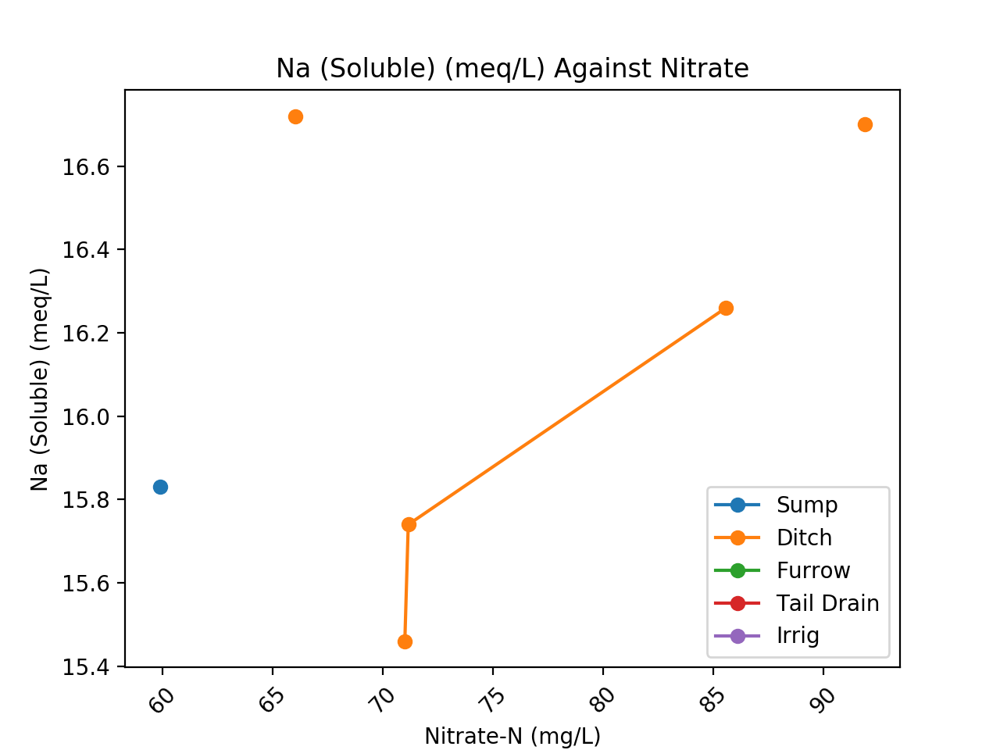

<IPython.core.display.Javascript object>


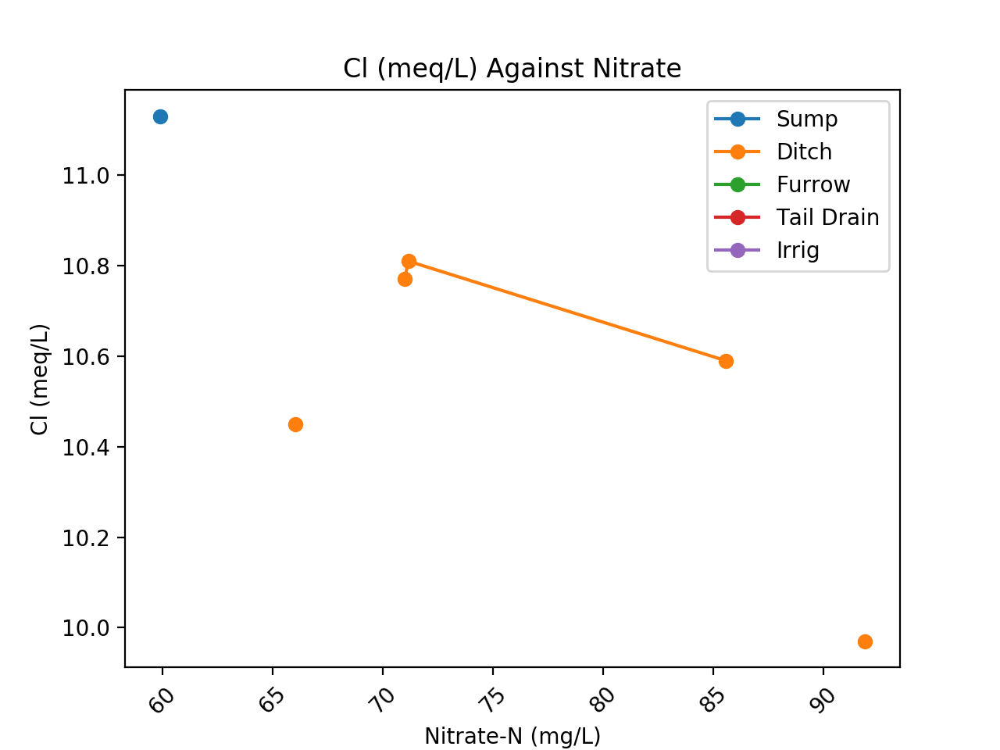

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


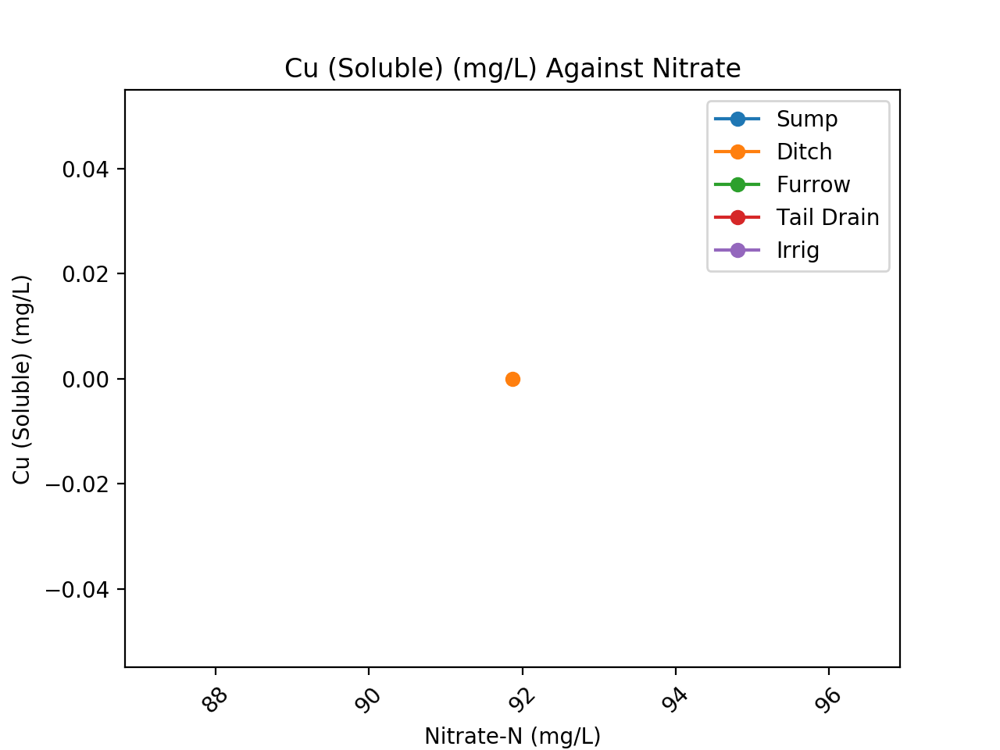

<IPython.core.display.Javascript object>


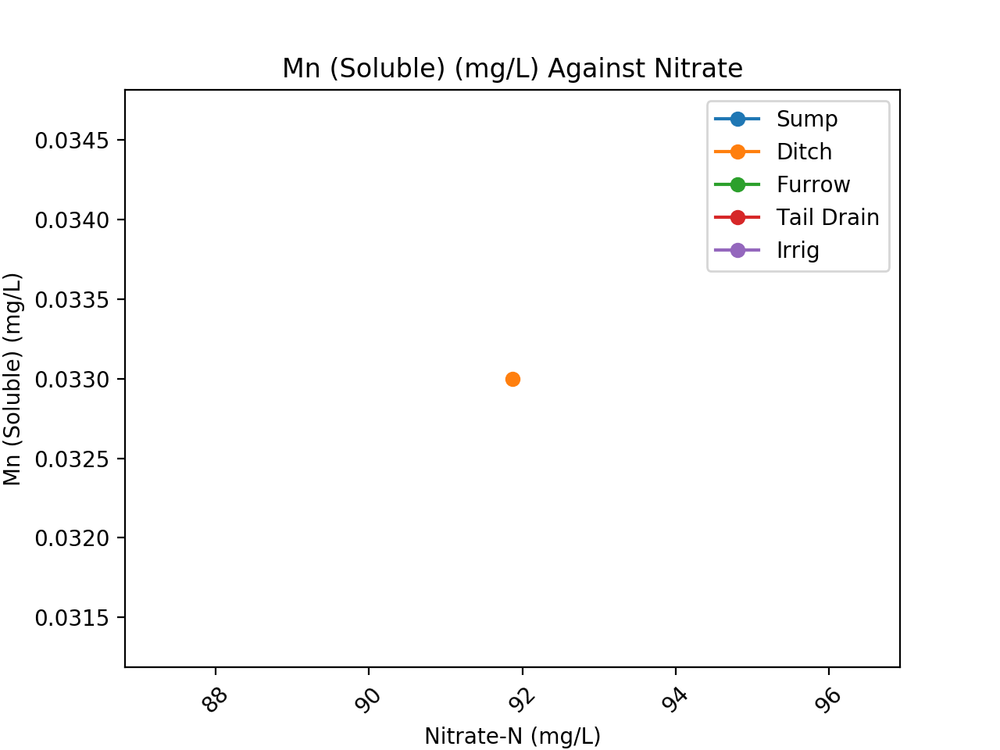

<IPython.core.display.Javascript object>


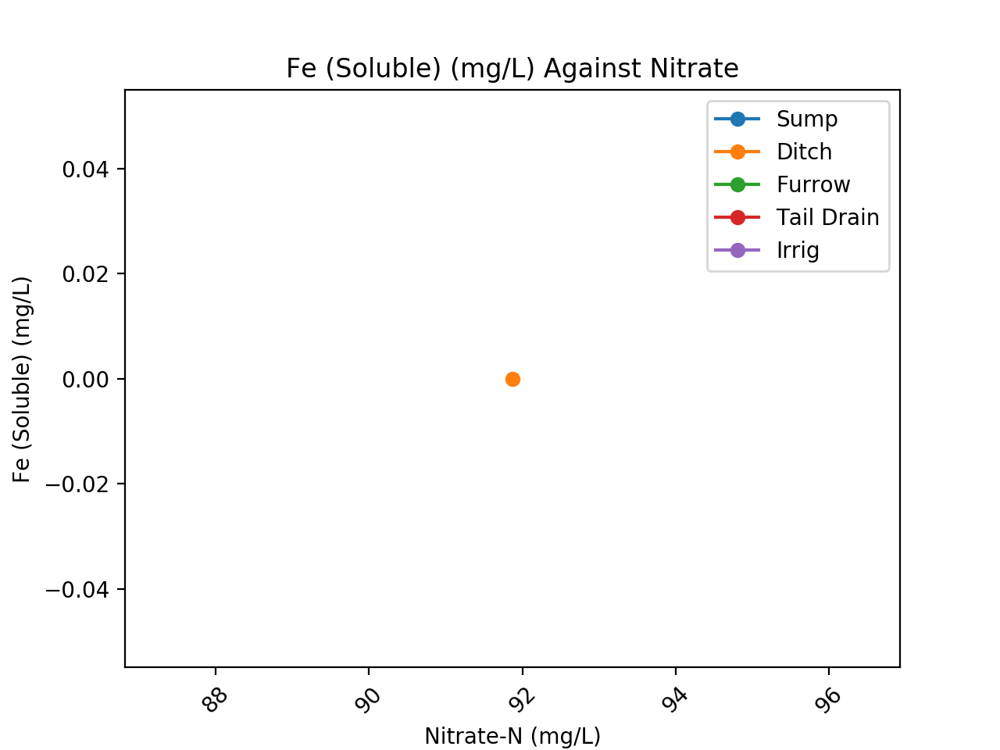

In [151]:
elementals = ['K (Soluble) (mg/L)', 'Ca (Soluble) (meq/L)',
       'Mg (Soluble) (meq/L)', 'Na (Soluble) (meq/L)', 'Cl (meq/L)',
       'SO4-S(Sol S) (mg/L)', 'NO3-N (mg/L)', 'HCO3 (meq/L)',
       'B (Soluble) (mg/L)', 'Zn (Soluble) (mg/L)', 'Cu (Soluble) (mg/L)',
       'Mn (Soluble) (mg/L)', 'Fe (Soluble) (mg/L)']

# Elements against Nitrate Concentration


for element in elementals:
    xvar = Site['Nitrate-N (mg/L)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('Nitrate-N (mg/L)')
    plt.ylabel(element)
    plt.title(element+' Against Nitrate')
    plt.legend()
    plt.xticks(rotation=45)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


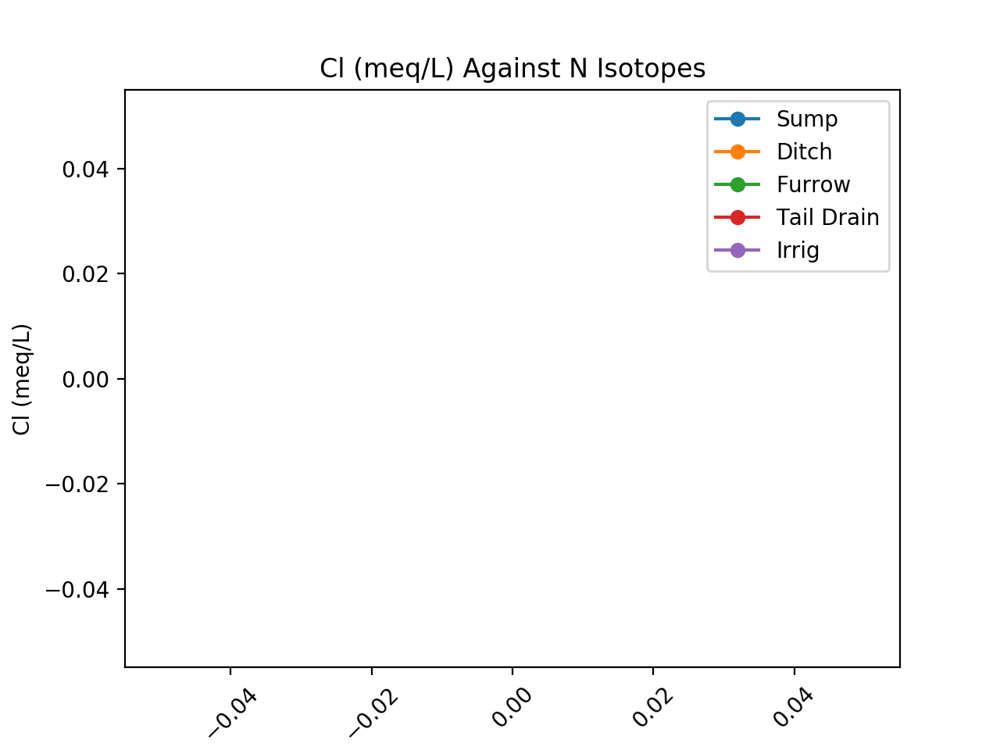

<IPython.core.display.Javascript object>


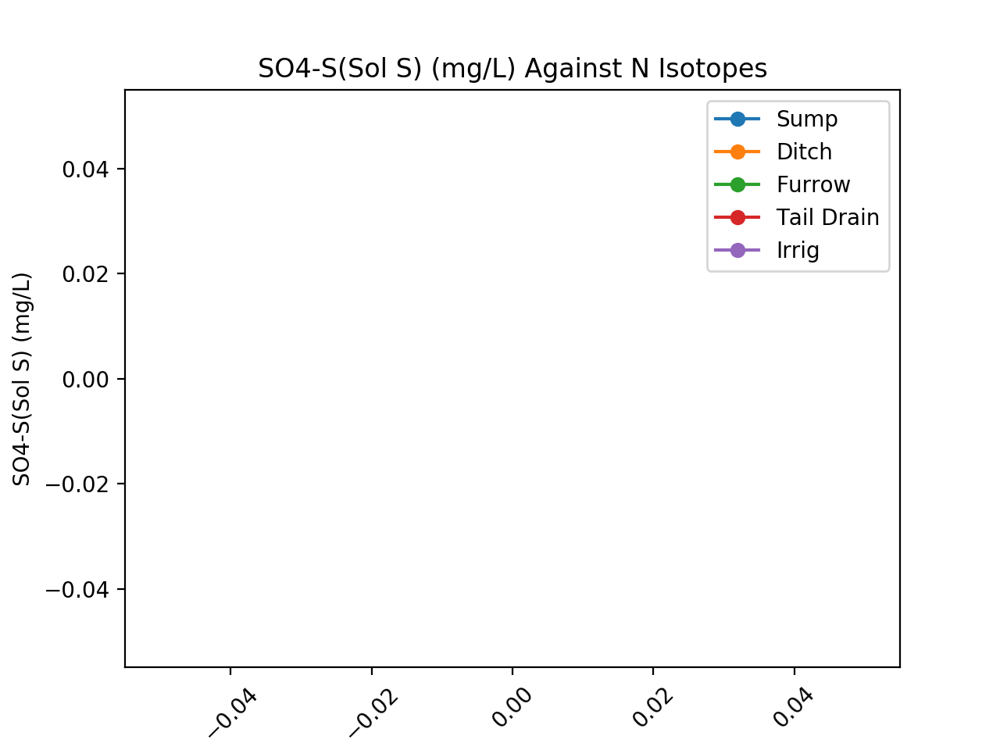

<IPython.core.display.Javascript object>


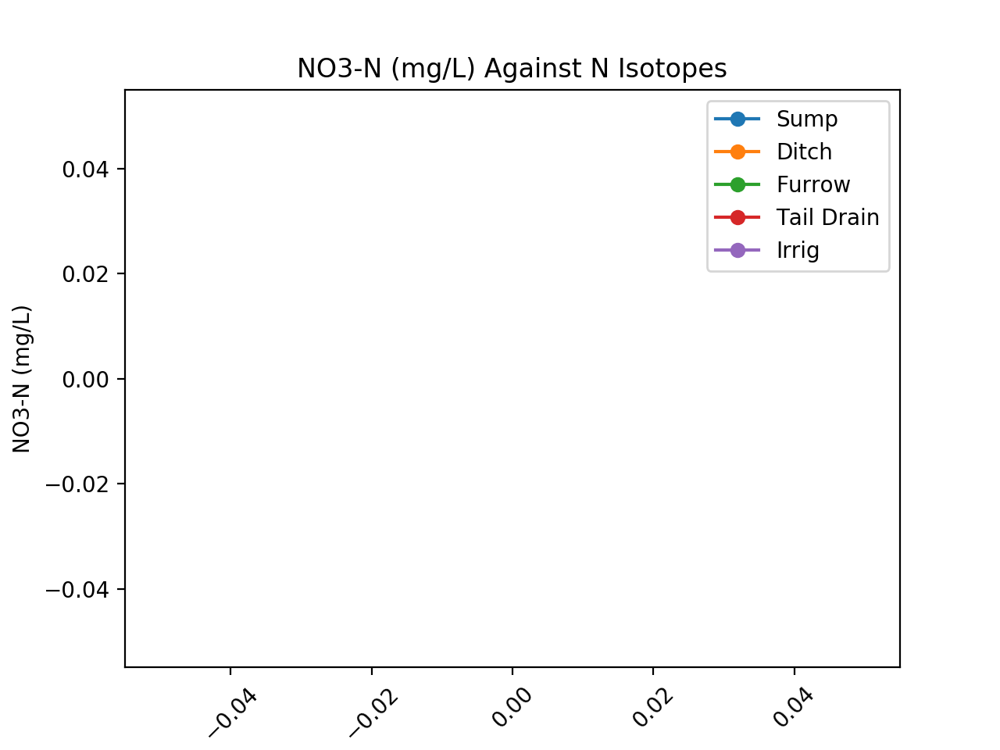

<IPython.core.display.Javascript object>


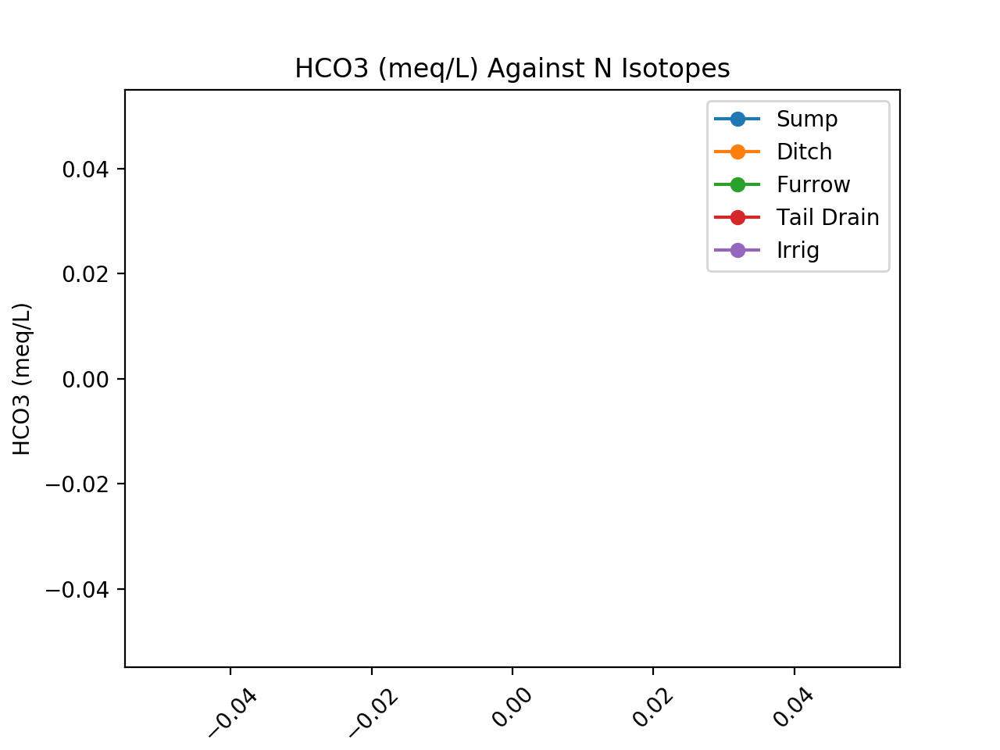

<IPython.core.display.Javascript object>


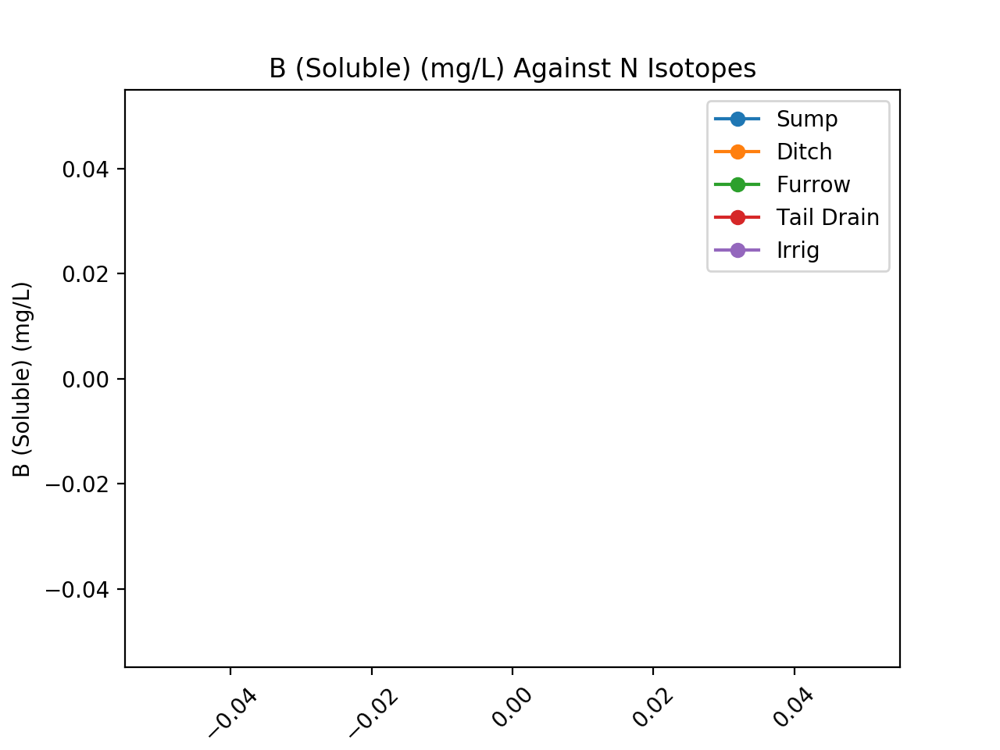

<IPython.core.display.Javascript object>


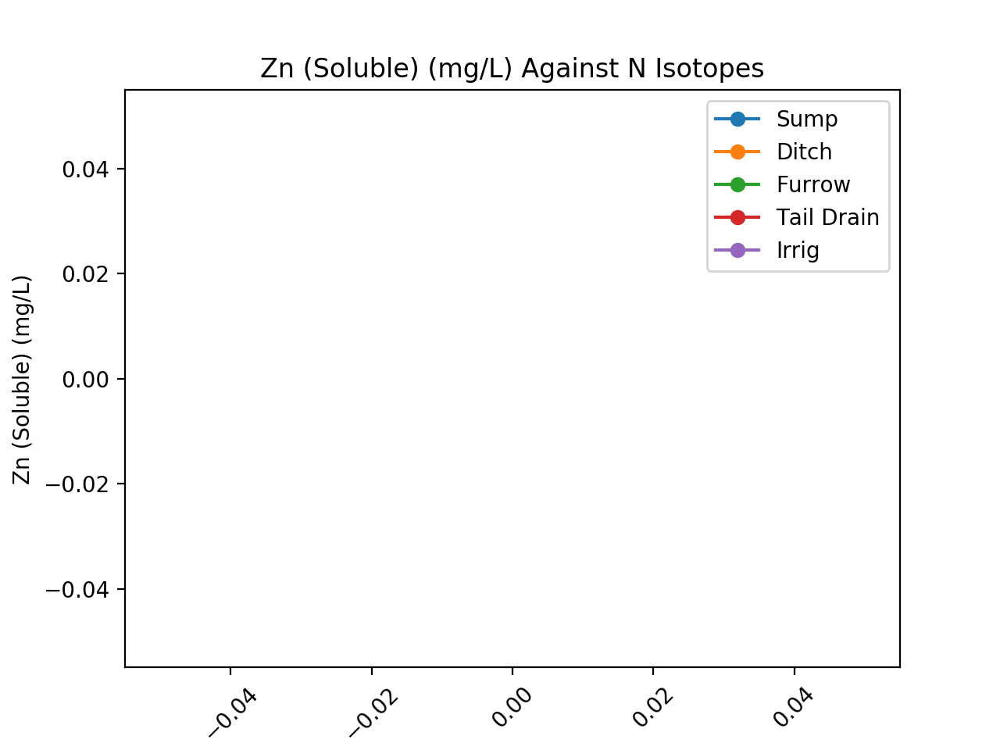

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [152]:
elementals = ['K (Soluble) (mg/L)', 'Ca (Soluble) (meq/L)',
       'Mg (Soluble) (meq/L)', 'Na (Soluble) (meq/L)', 'Cl (meq/L)',
       'SO4-S(Sol S) (mg/L)', 'NO3-N (mg/L)', 'HCO3 (meq/L)',
       'B (Soluble) (mg/L)', 'Zn (Soluble) (mg/L)', 'Cu (Soluble) (mg/L)',
       'Mn (Soluble) (mg/L)', 'Fe (Soluble) (mg/L)']

# Elements against N Isotopes


for element in elementals:
    xvar = Site['d15NAir (‰)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('d15N-air (per mille)')
    plt.ylabel(element)
    plt.title(element+' Against N Isotopes')
    plt.legend()
    plt.xticks(rotation=45)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


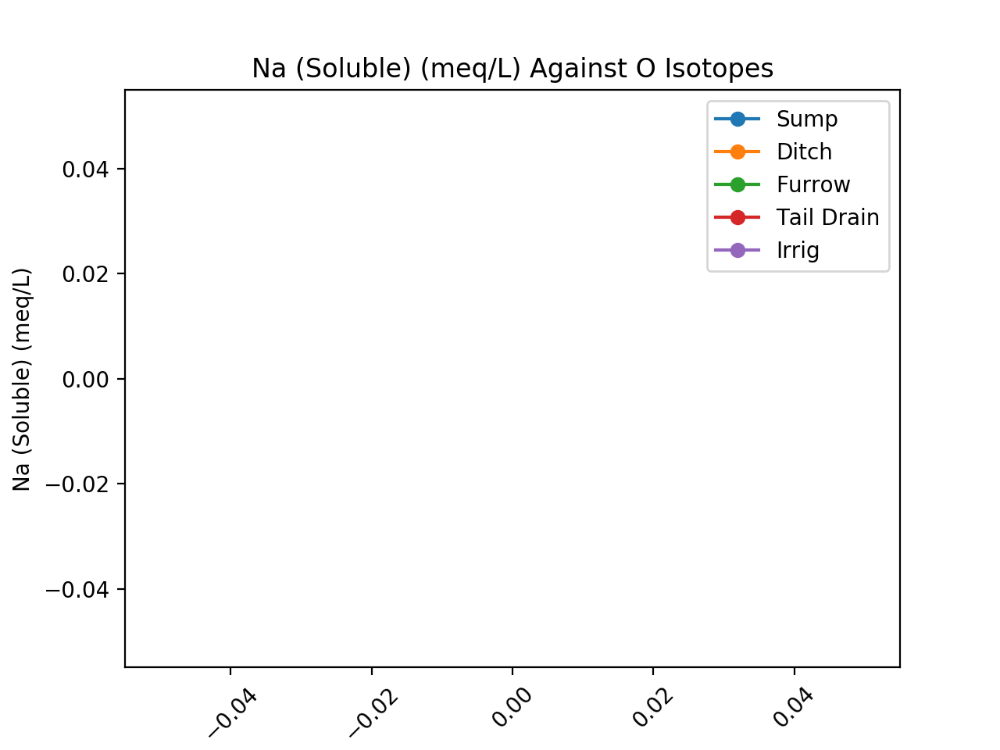

<IPython.core.display.Javascript object>


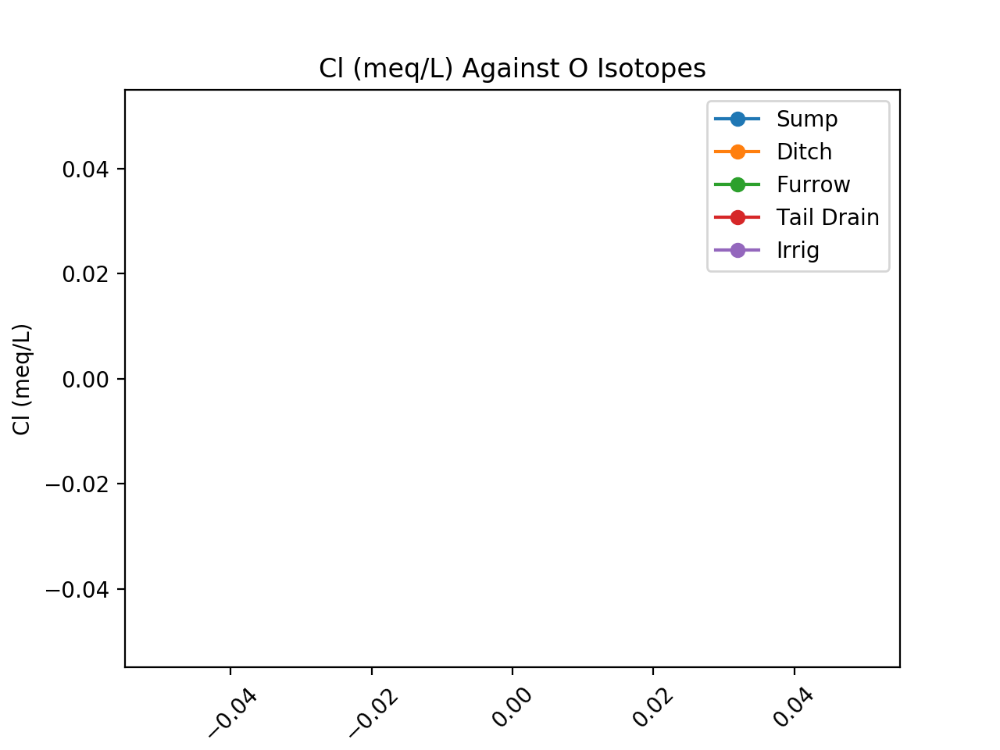

<IPython.core.display.Javascript object>


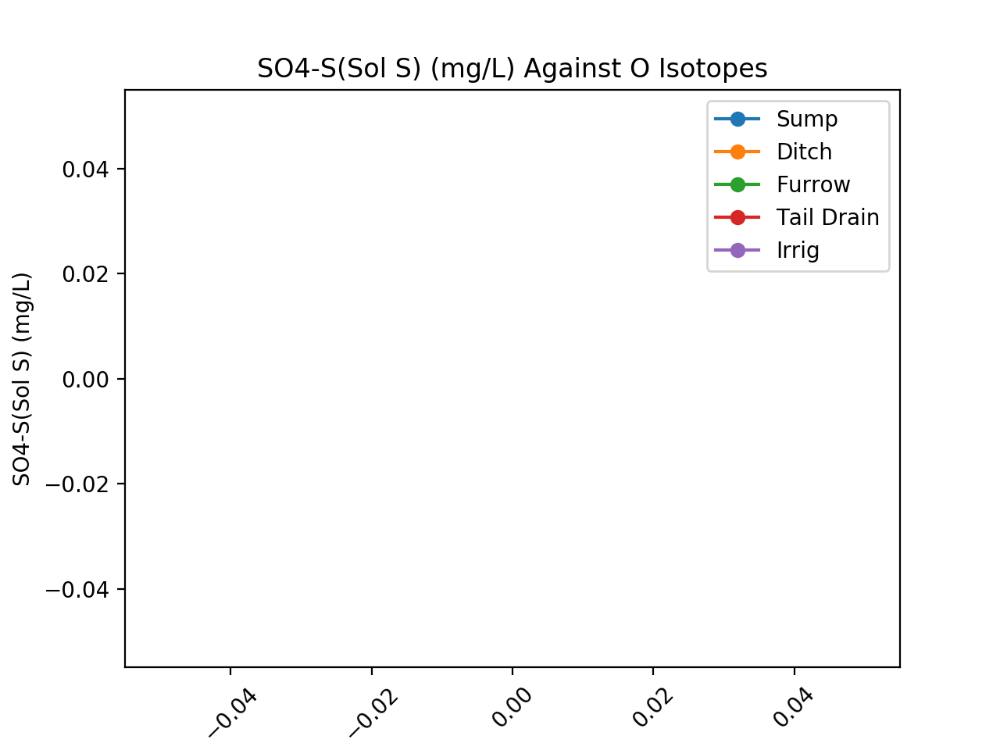

<IPython.core.display.Javascript object>


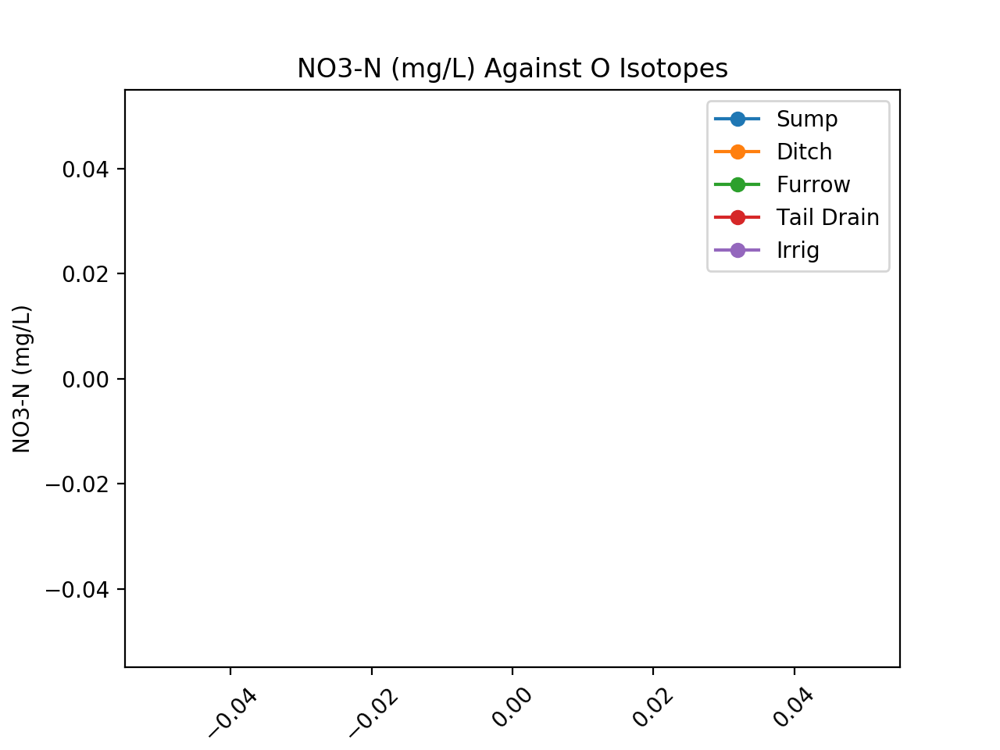

<IPython.core.display.Javascript object>


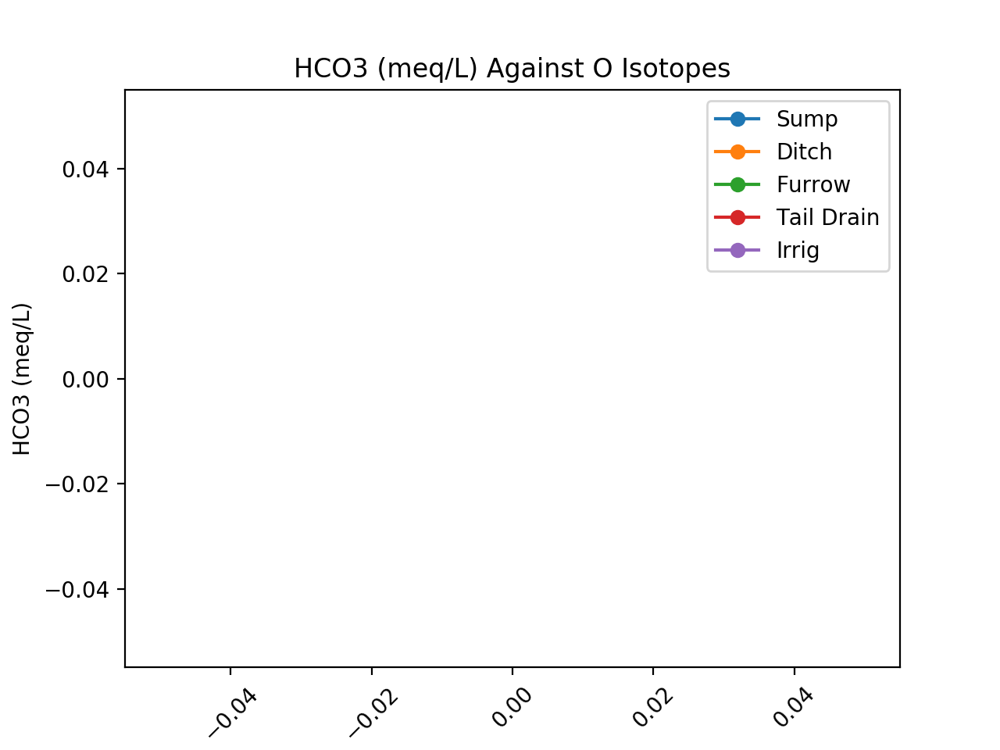

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


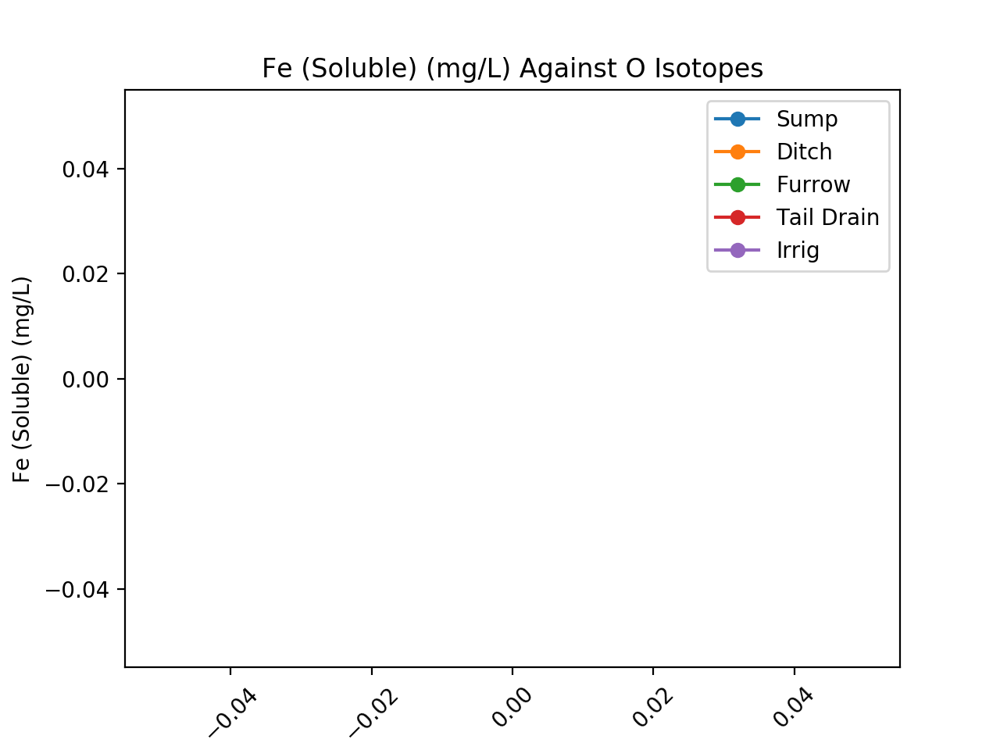

In [153]:
elementals = ['K (Soluble) (mg/L)', 'Ca (Soluble) (meq/L)',
       'Mg (Soluble) (meq/L)', 'Na (Soluble) (meq/L)', 'Cl (meq/L)',
       'SO4-S(Sol S) (mg/L)', 'NO3-N (mg/L)', 'HCO3 (meq/L)',
       'B (Soluble) (mg/L)', 'Zn (Soluble) (mg/L)', 'Cu (Soluble) (mg/L)',
       'Mn (Soluble) (mg/L)', 'Fe (Soluble) (mg/L)']

# Elements against O Isotopes


for element in elementals:
    xvar = Site['d18OVSMOW  (‰)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('d18O-OVSMOW (per mille)')
    plt.ylabel(element)
    plt.title(element+' Against O Isotopes')
    plt.legend()
    plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


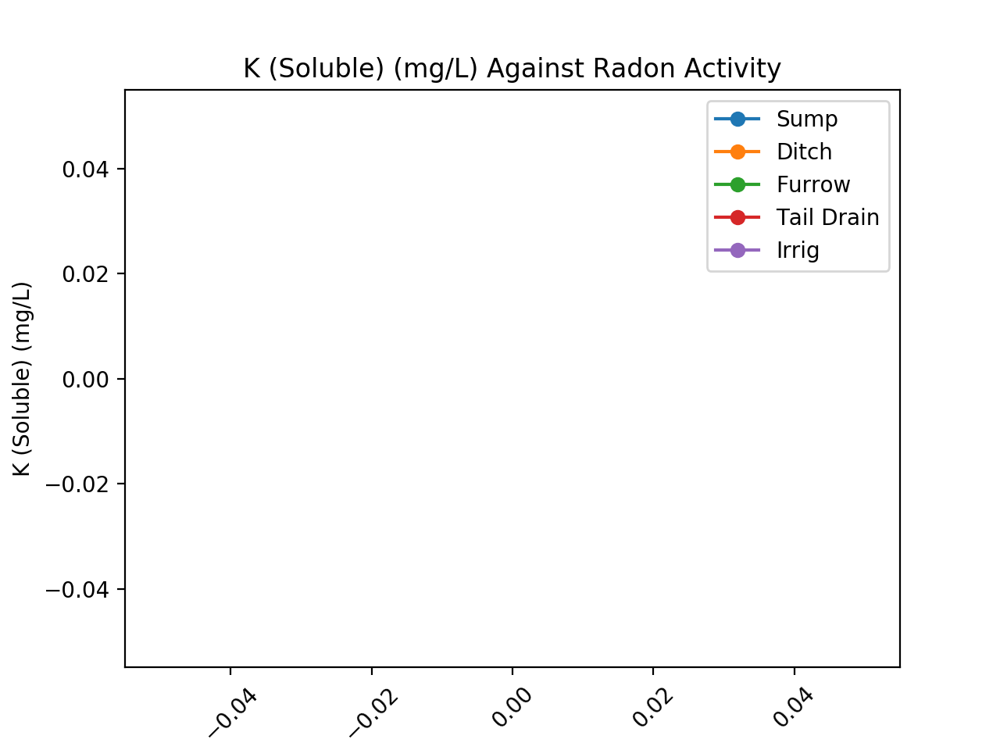

<IPython.core.display.Javascript object>


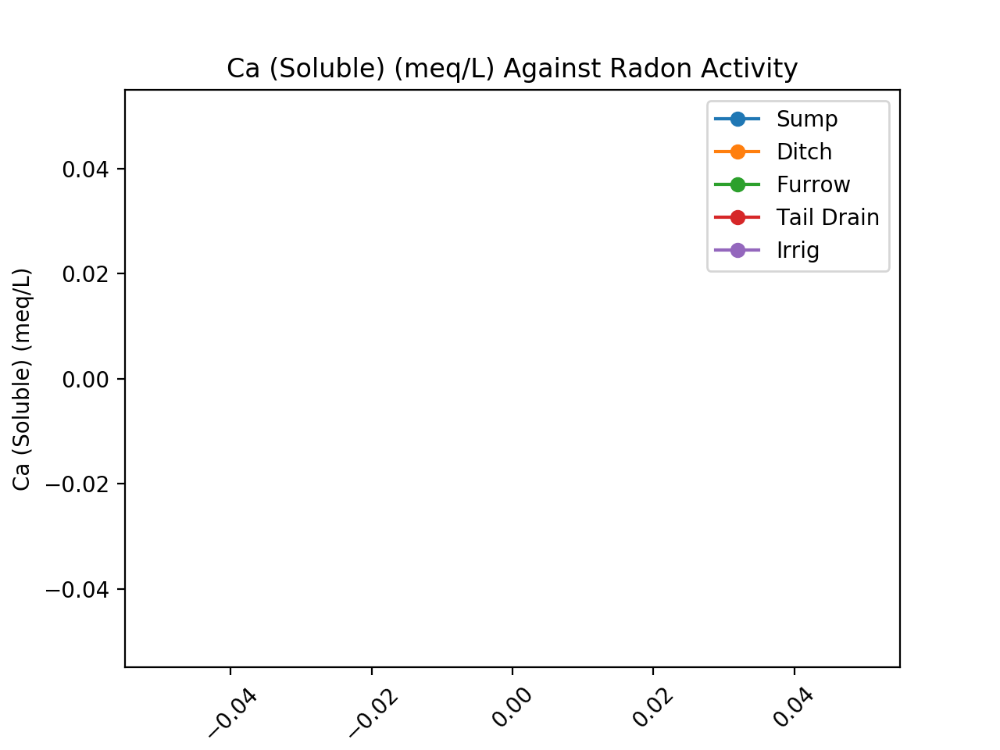

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


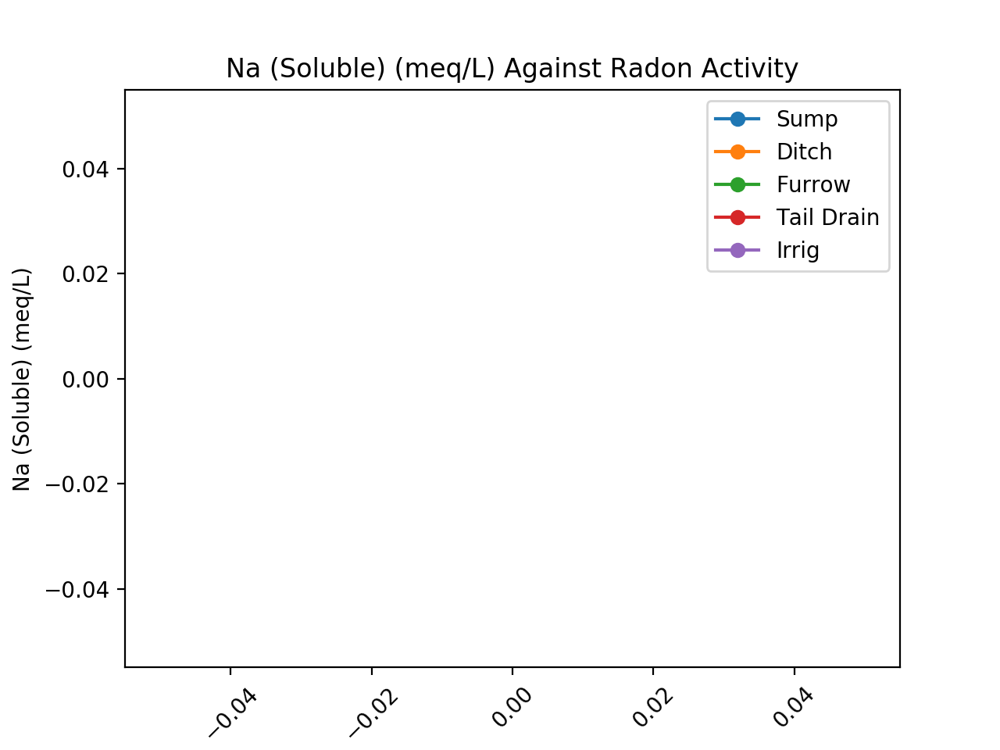

<IPython.core.display.Javascript object>


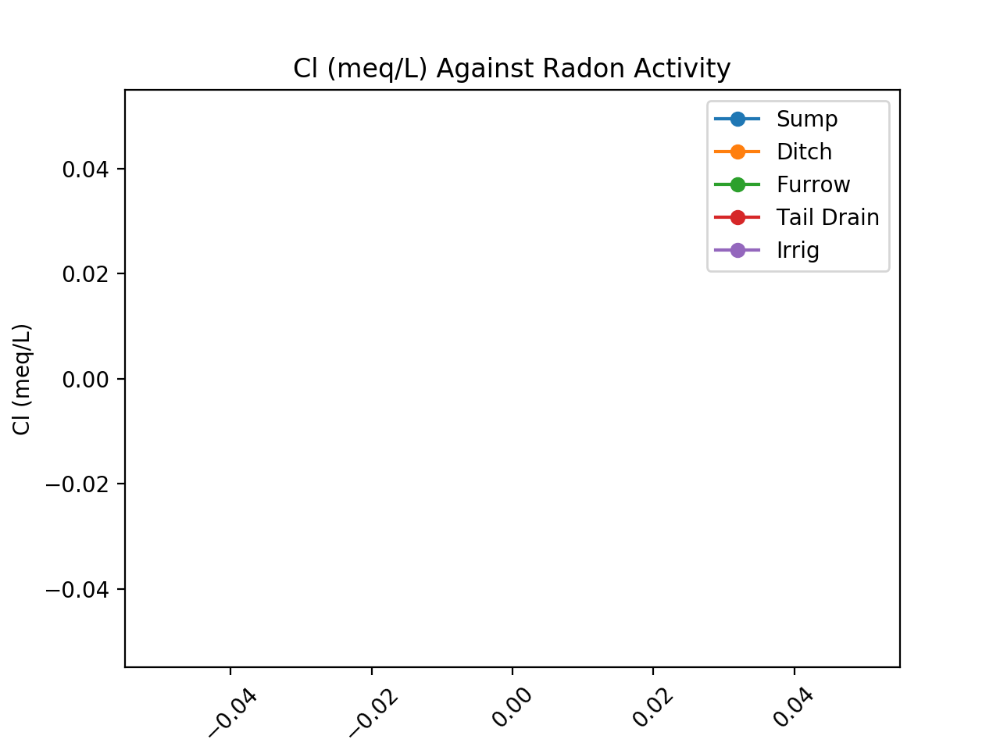

<IPython.core.display.Javascript object>


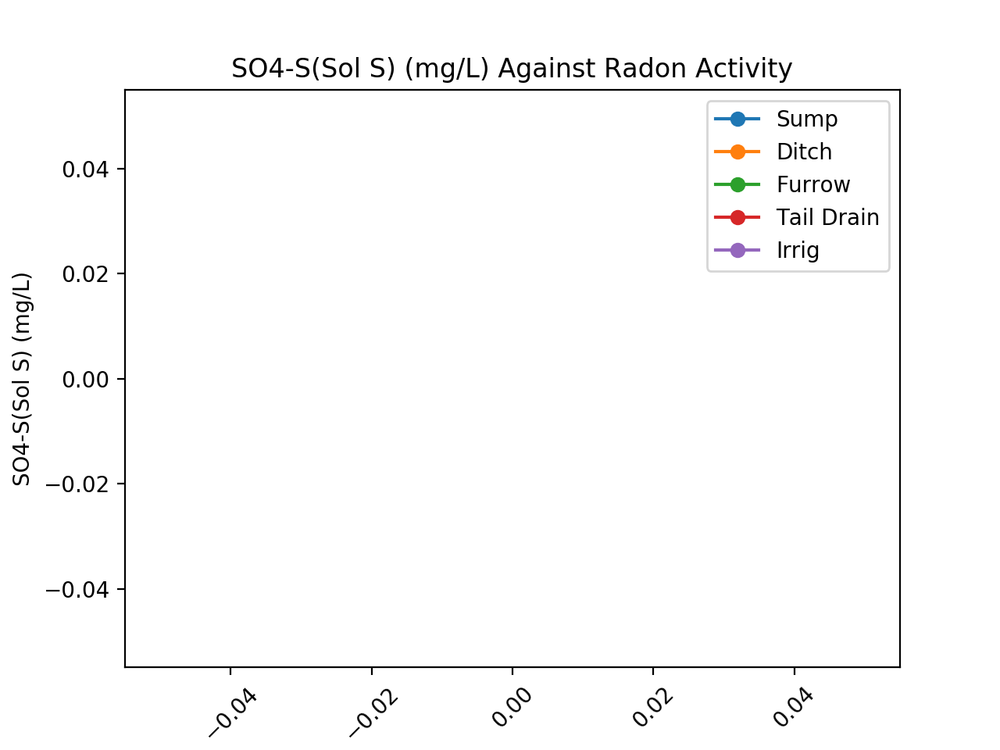

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


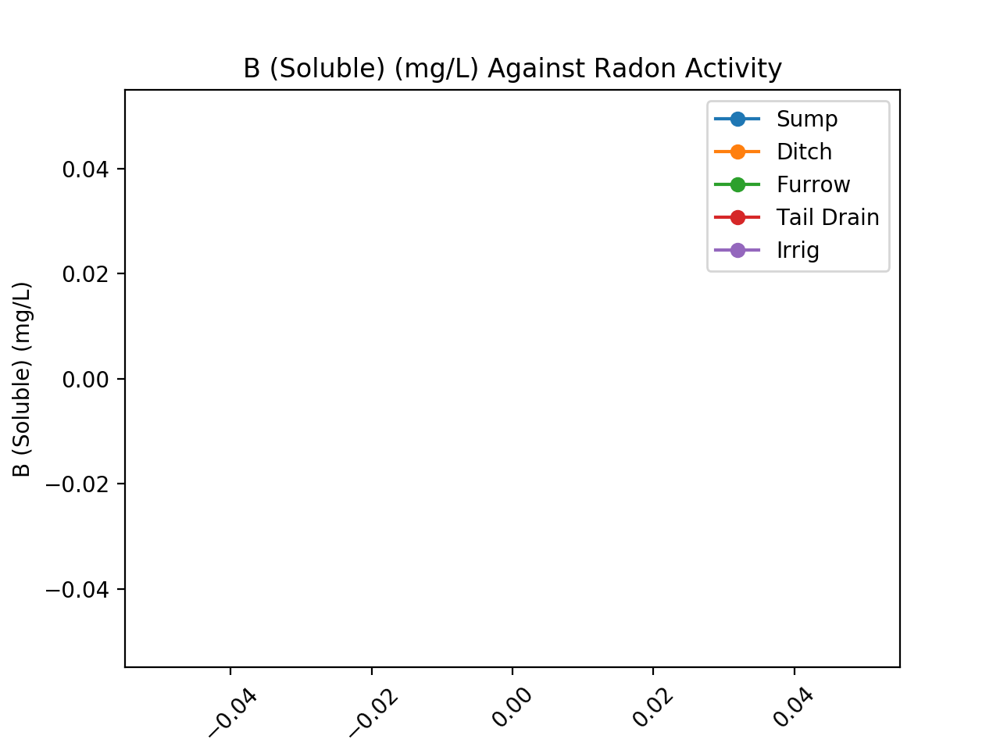

<IPython.core.display.Javascript object>


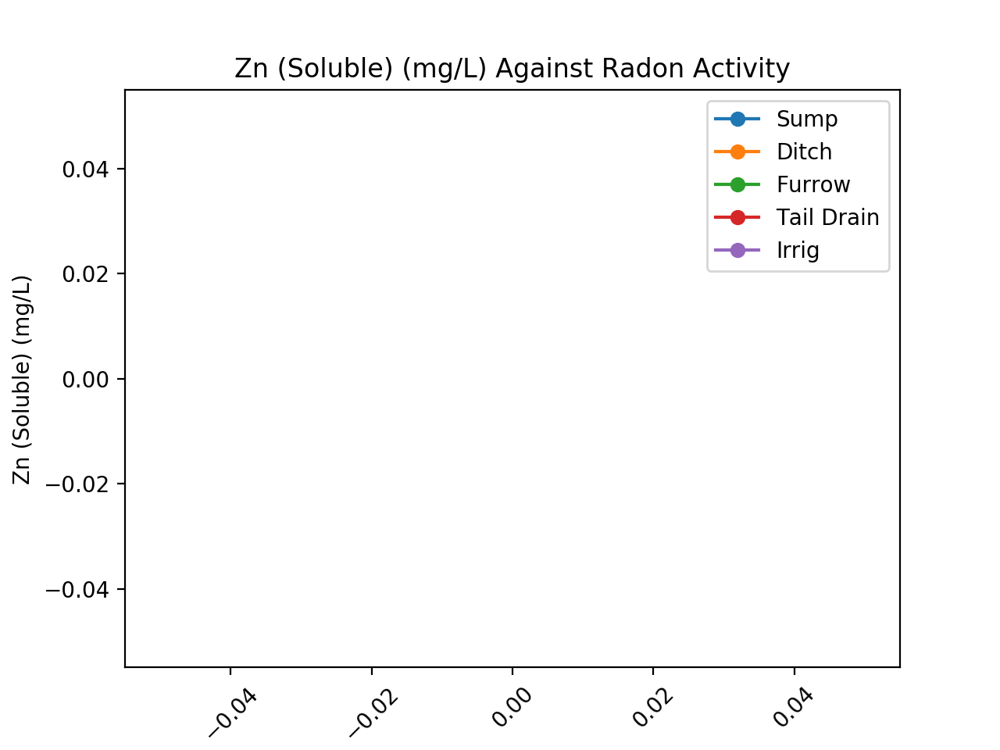

<IPython.core.display.Javascript object>


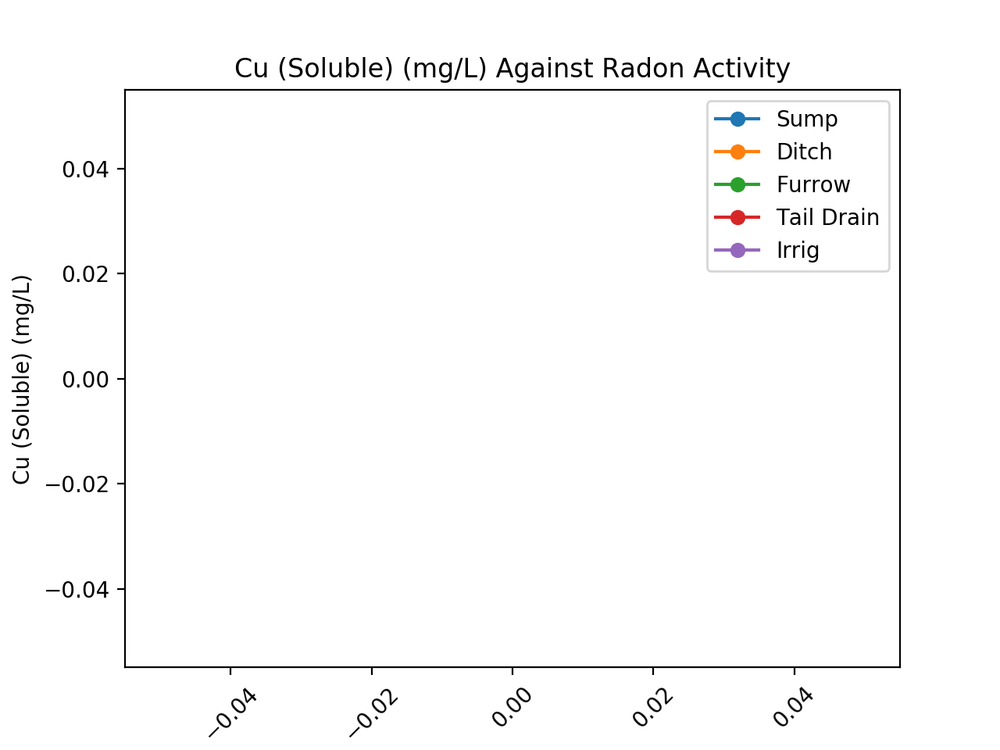

<IPython.core.display.Javascript object>


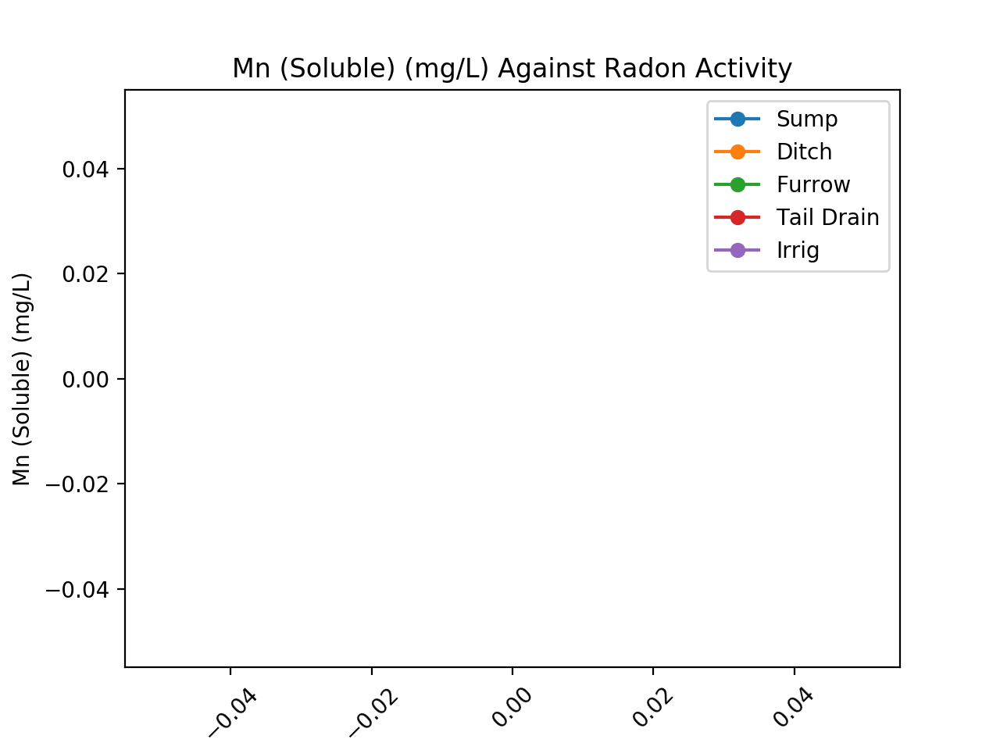

<IPython.core.display.Javascript object>


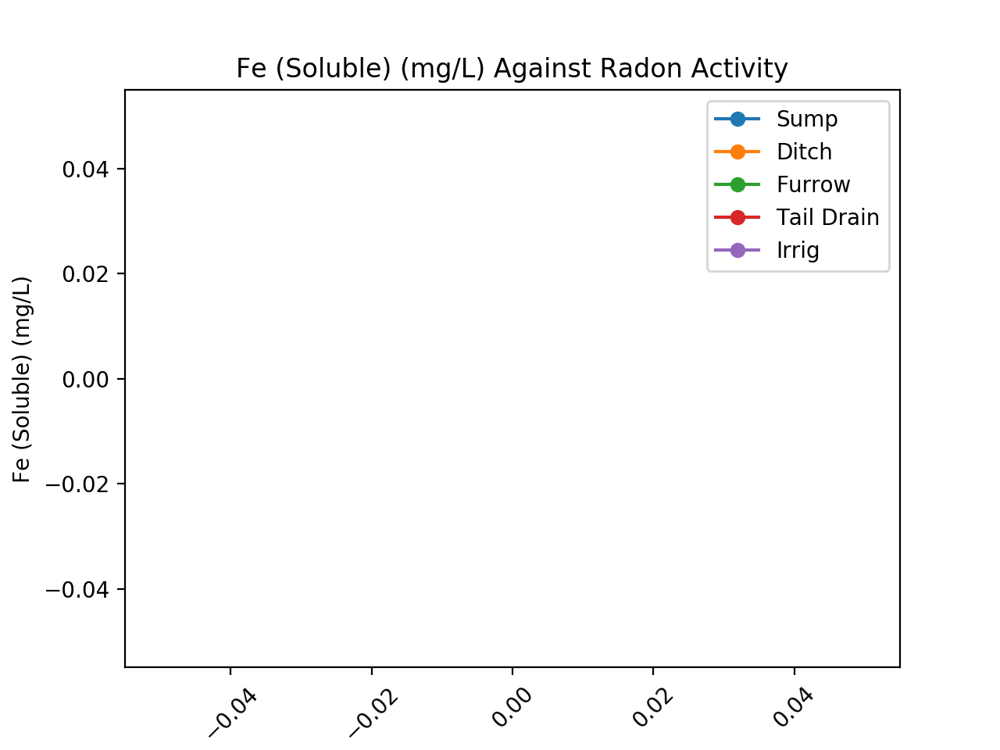

In [154]:
elementals = ['K (Soluble) (mg/L)', 'Ca (Soluble) (meq/L)',
       'Mg (Soluble) (meq/L)', 'Na (Soluble) (meq/L)', 'Cl (meq/L)',
       'SO4-S(Sol S) (mg/L)', 'NO3-N (mg/L)', 'HCO3 (meq/L)',
       'B (Soluble) (mg/L)', 'Zn (Soluble) (mg/L)', 'Cu (Soluble) (mg/L)',
       'Mn (Soluble) (mg/L)', 'Fe (Soluble) (mg/L)']

# Elements against Radon


for element in elementals:
    xvar = Site['Decay Corrected Avg Rn_wat (dpm/L)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('Radon Activity (dpm/L)')
    plt.ylabel(element)
    plt.title(element+' Against Radon Activity')
    plt.legend()
    plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


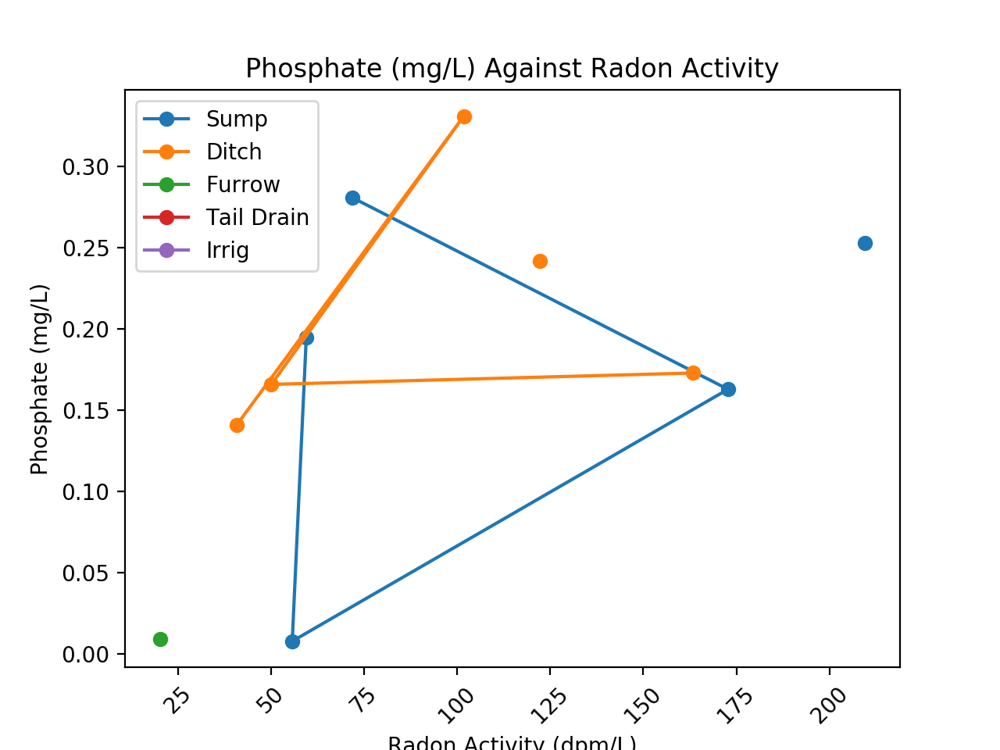

<IPython.core.display.Javascript object>


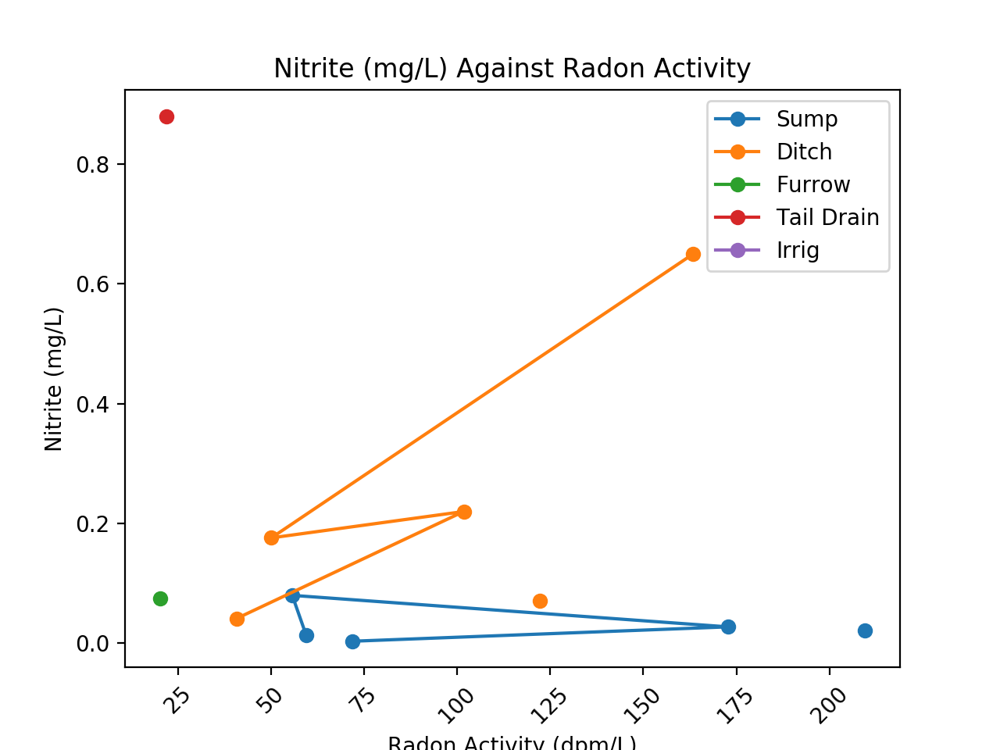

<IPython.core.display.Javascript object>


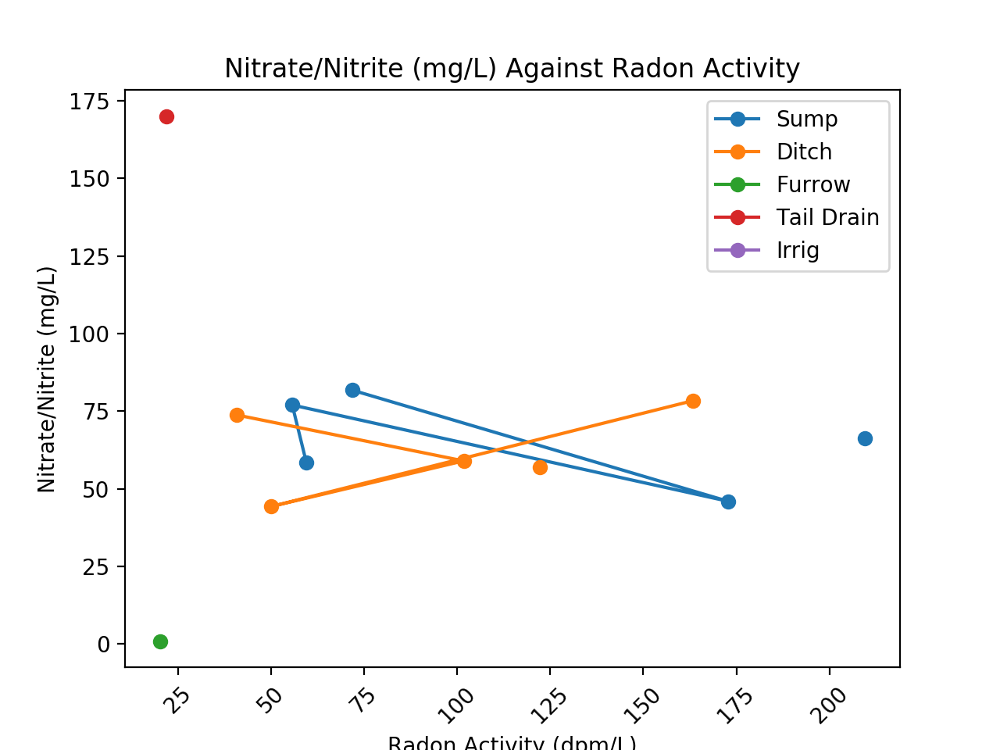

<IPython.core.display.Javascript object>


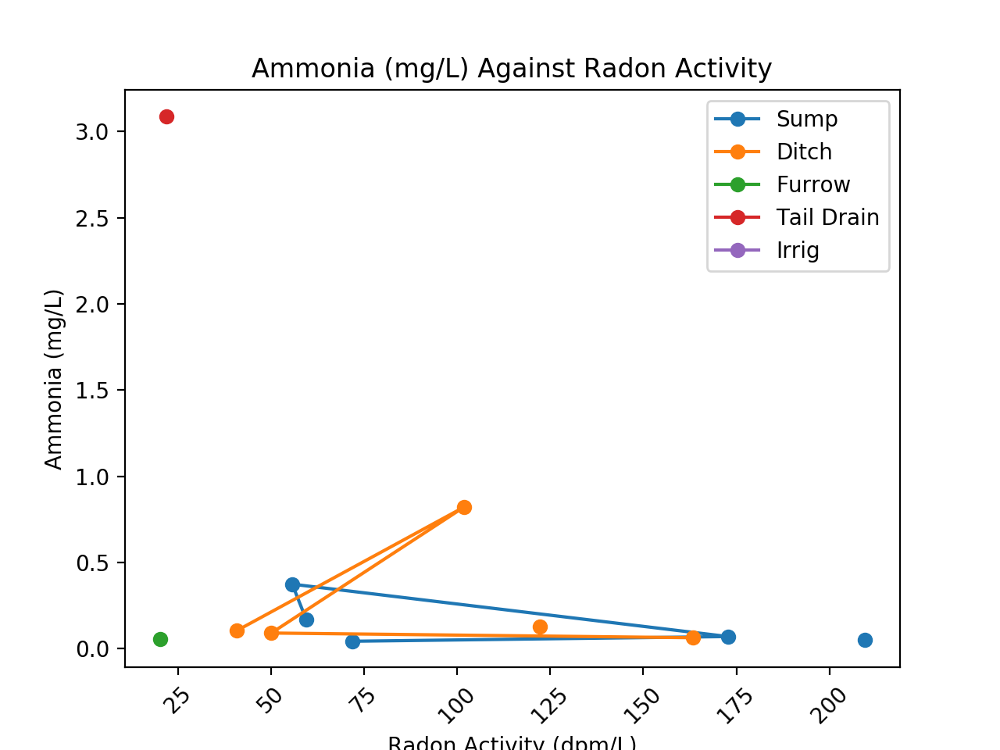

<IPython.core.display.Javascript object>


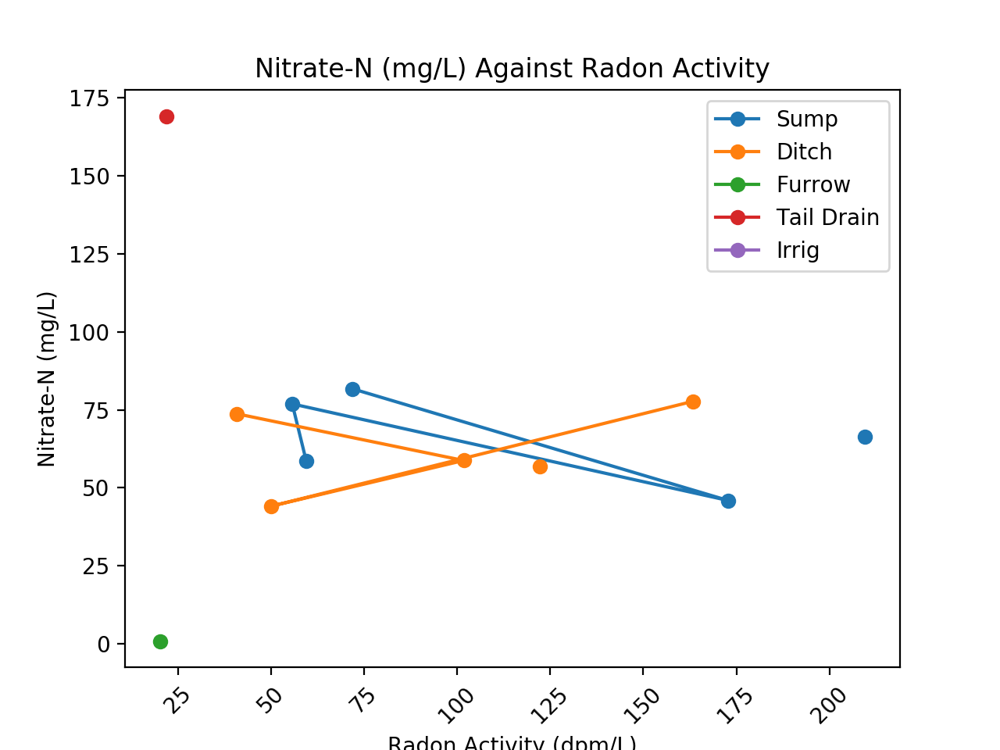

In [181]:
elementals = ['Phosphate (mg/L)', 'Nitrite (mg/L)', 'Nitrate/Nitrite (mg/L)', 
              'Ammonia (mg/L)','Nitrate-N (mg/L)']

# Nutrients against Radon Activity


for element in elementals:
    xvar = Site['Decay Corrected Avg Rn_wat (dpm/L)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('Radon Activity (dpm/L)')
    plt.ylabel(element)
    plt.title(element+' Against Radon Activity')
    plt.legend()
    plt.xticks(rotation=45)

In [156]:

# ******
# Trying to calculate and plot linear regression lines for the data. 
# Howerver, cannot calculate b/c some values have NaNs and interupt the calculation
# Working on how to remove these rows prior to the calculation for BOTH 
# the x and the y varialbe (b/c the lists must be the same length / align properly)
# ******

elementals = ['Phosphate (mg/L)'] 
newtypes = [SUMP]
# 'Nitrite (mg/L)', 'Nitrate/Nitrite (mg/L)', 
#               'Ammonia (mg/L)','Nitrate-N (mg/L)']

# Nutrients against N Isotopes


for element in elementals:
    xvar = Site['d15NAir (‰)']
    yvar = Site[element]
#     for newtype in newtypes:

#     plt.figure()
#     plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    xvar_sump = xvar[SUMP].dropna()
    print(xvar_sump)
#     yvar_sump = yvar[SUMP].dropna()
#         matrix = [x,y]

#         matrix = Site[['d15NAir (‰)', element]]
#         matrix = matrix.dropna()
# #         x = xvar[newtype]
# #         y = yvar[newtype]
#         print(matrix['d15NAir (‰)'][newtype])
        
#         sump_regress = stats.linregress(x,y)
#     print(x)
#     print(y)
# xvar[SUMP]

2      7.53
5      7.99
8      7.45
11     7.54
16     7.80
20     7.36
22    10.53
Name: d15NAir (‰), dtype: float64


<IPython.core.display.Javascript object>


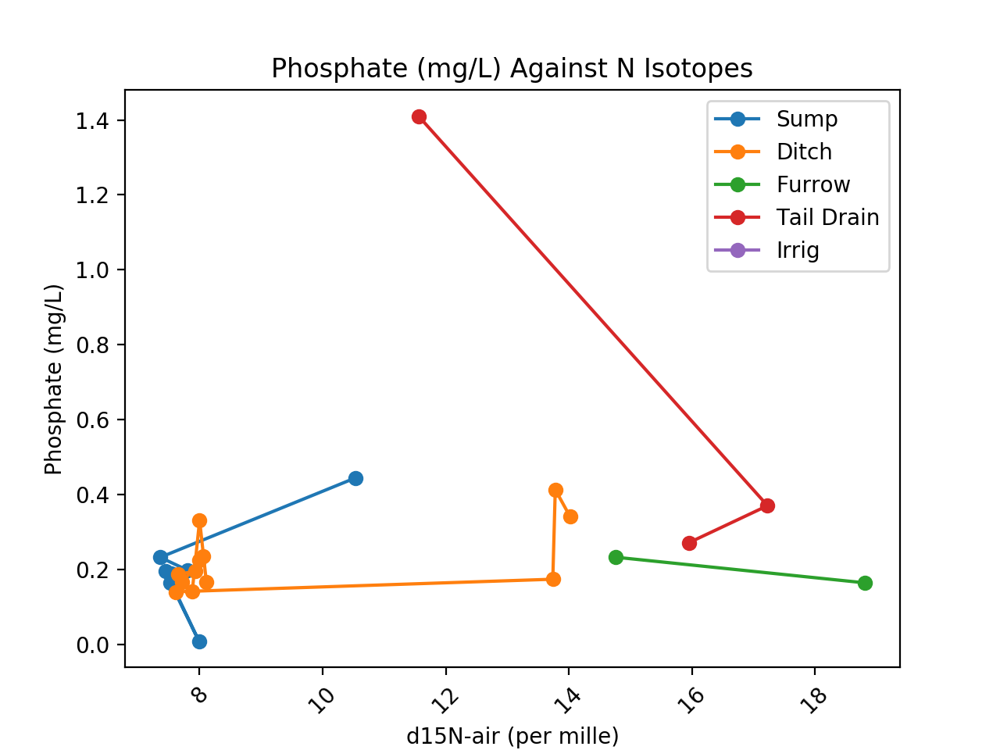

<IPython.core.display.Javascript object>


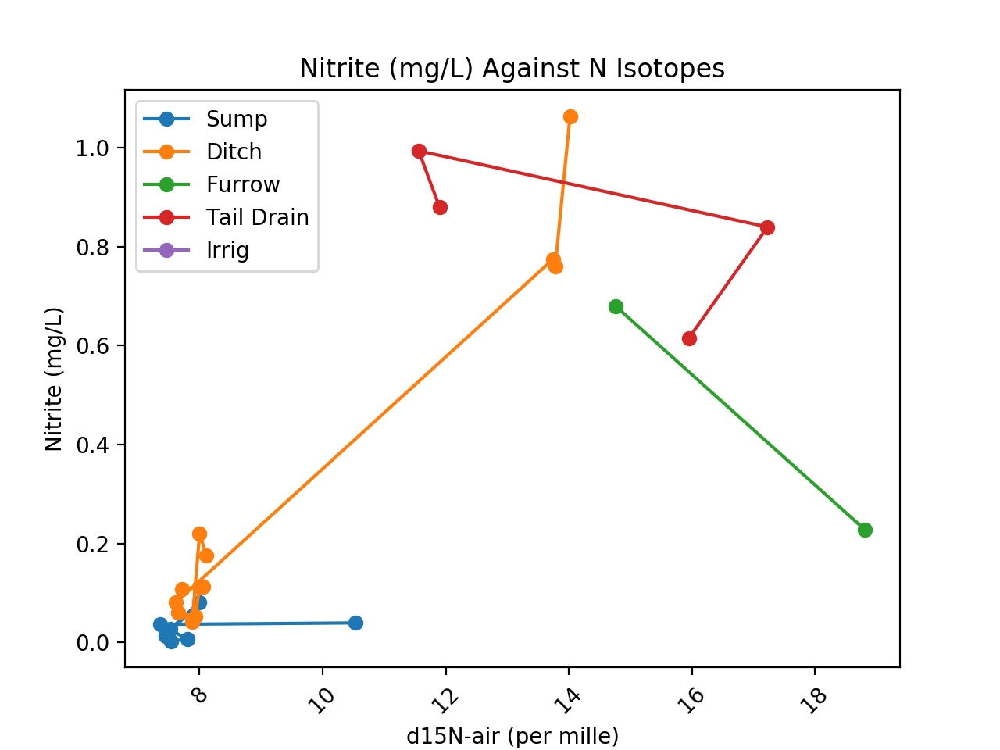

<IPython.core.display.Javascript object>


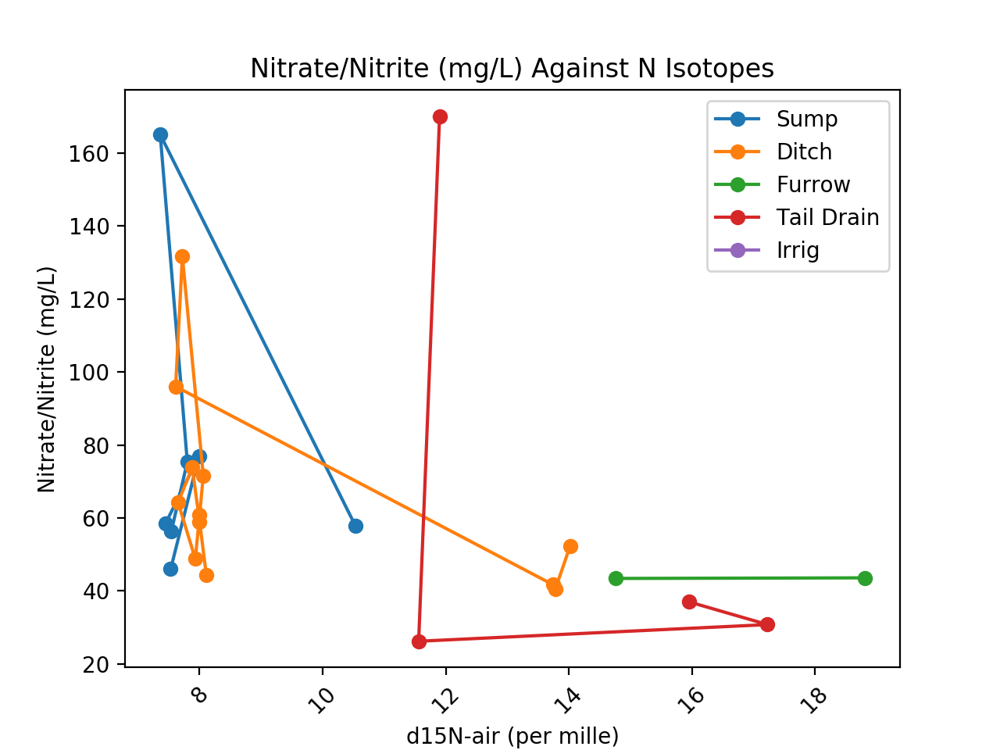

<IPython.core.display.Javascript object>


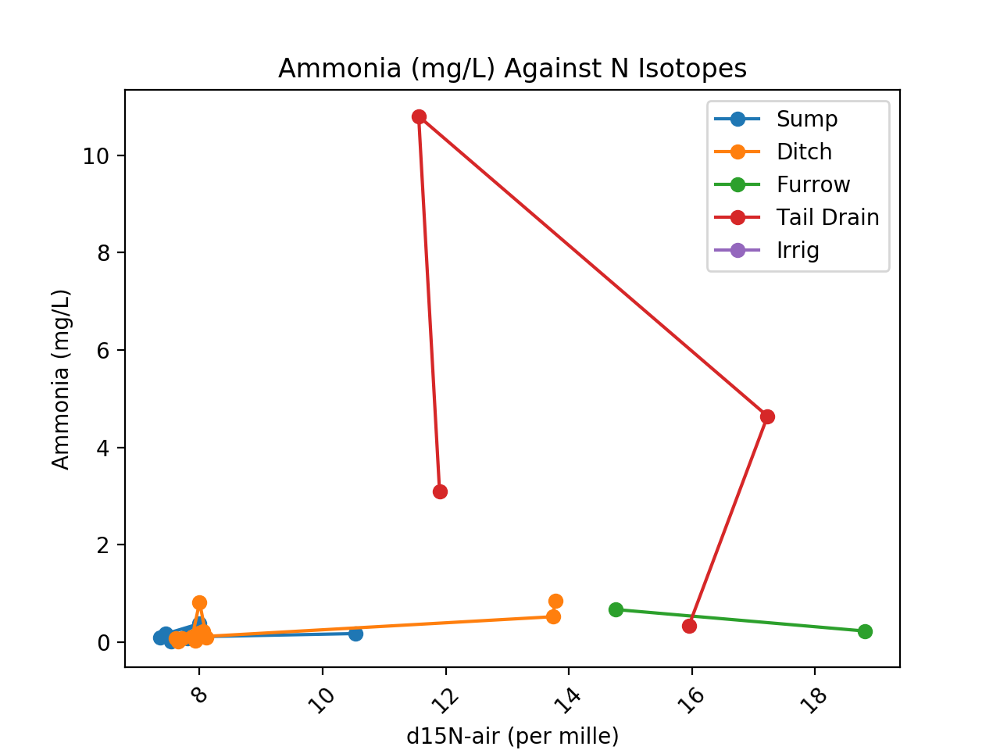

<IPython.core.display.Javascript object>


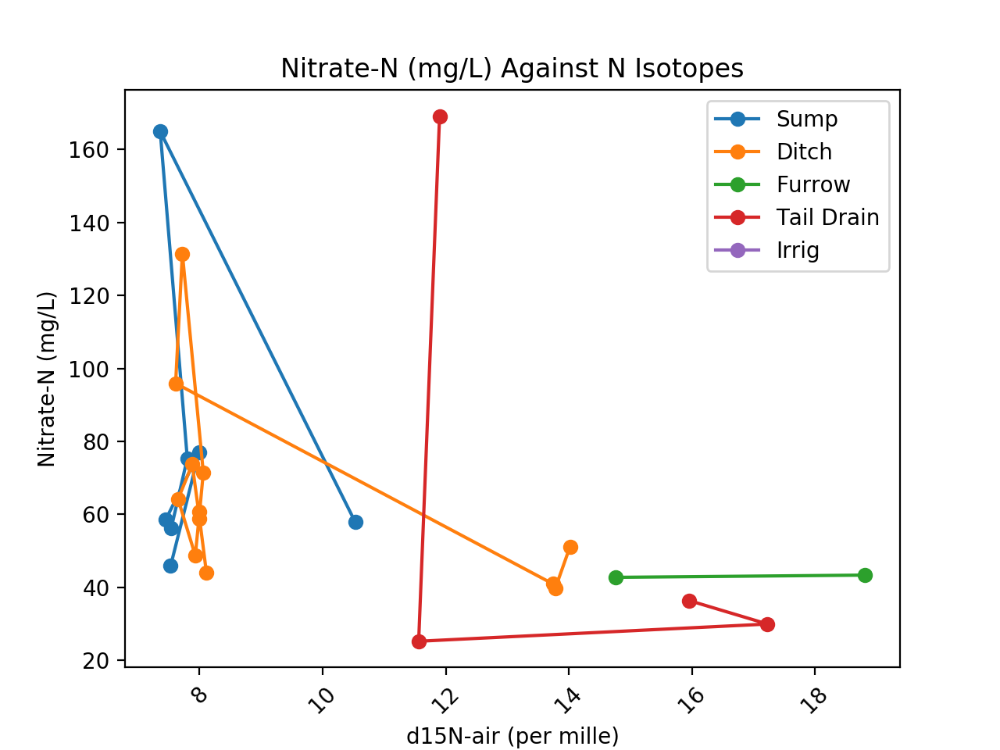

In [157]:
elementals = ['Phosphate (mg/L)', 'Nitrite (mg/L)', 'Nitrate/Nitrite (mg/L)', 
              'Ammonia (mg/L)','Nitrate-N (mg/L)']

# Nutrients against N Isotopes


for element in elementals:
    xvar = Site['d15NAir (‰)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('d15N-air (per mille)')
    plt.ylabel(element)
    plt.title(element+' Against N Isotopes')
    plt.legend()
    plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


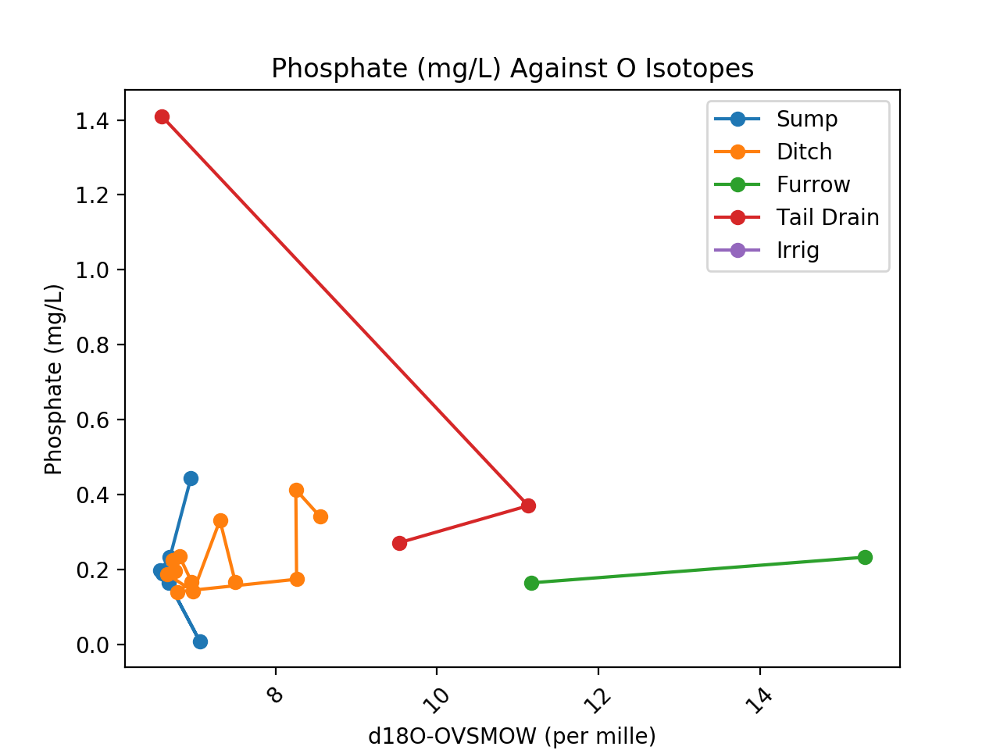

<IPython.core.display.Javascript object>


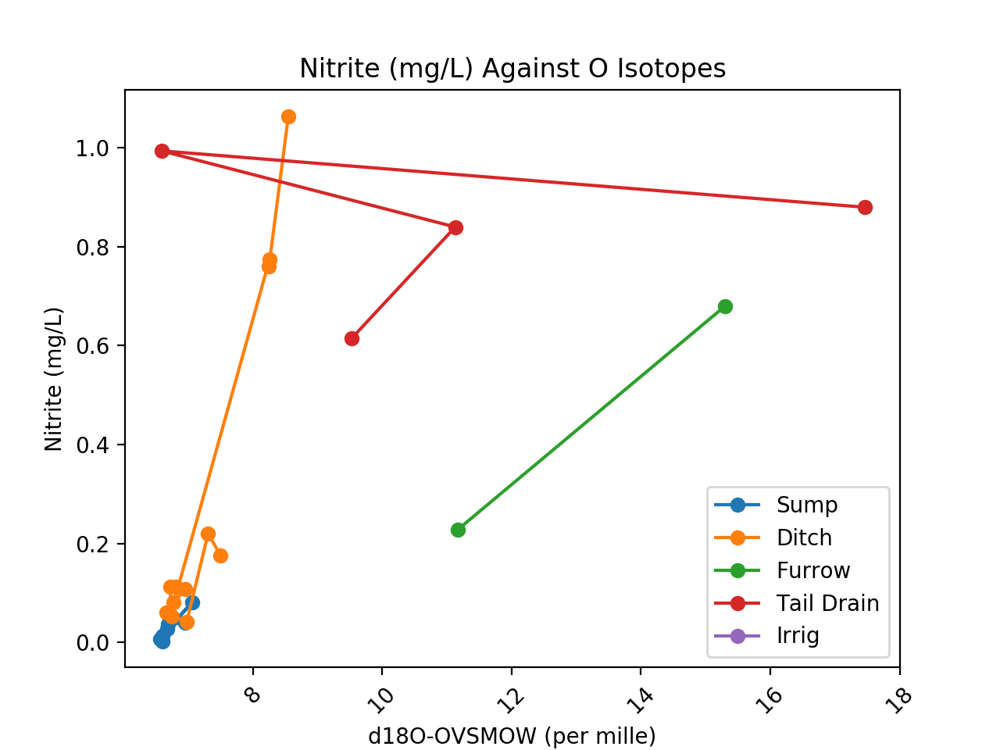

<IPython.core.display.Javascript object>


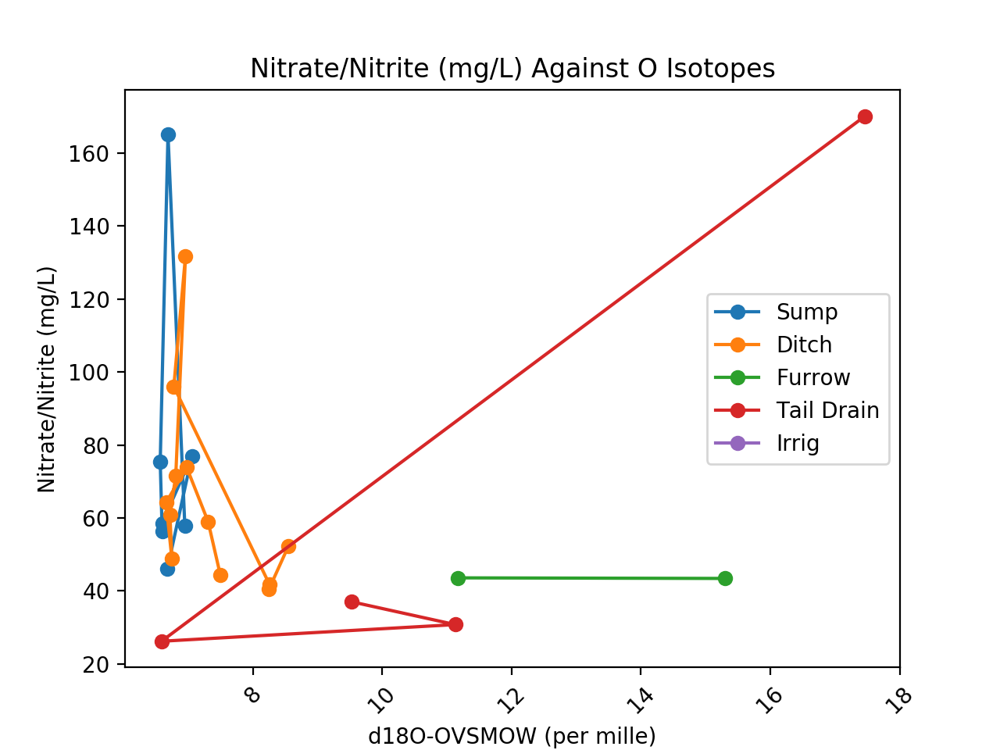

<IPython.core.display.Javascript object>


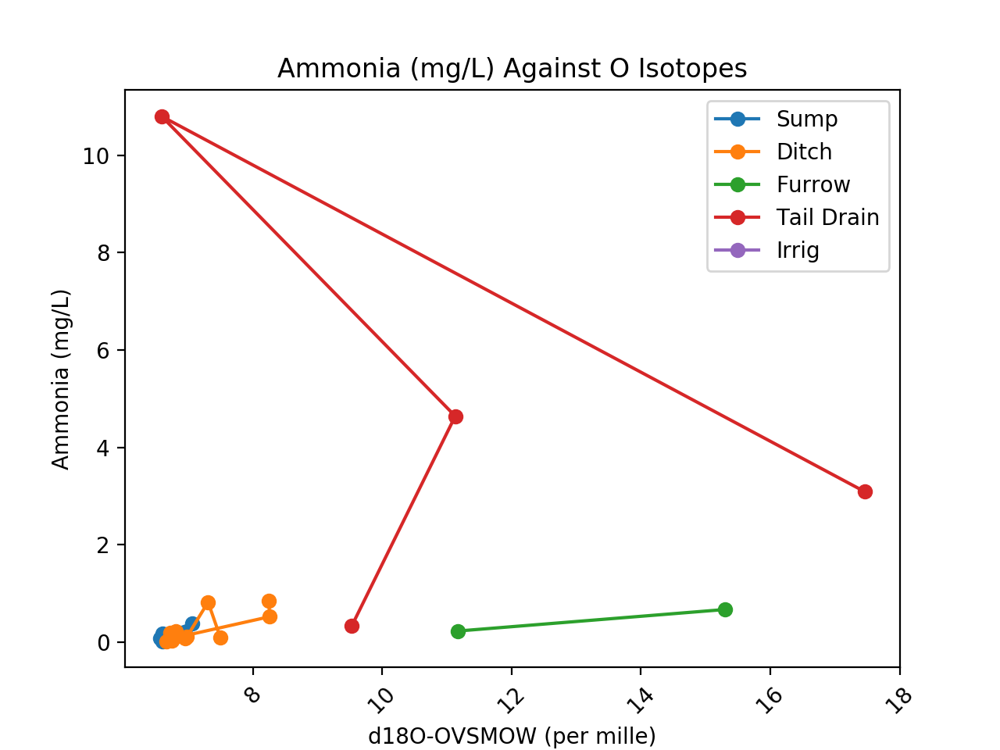

<IPython.core.display.Javascript object>


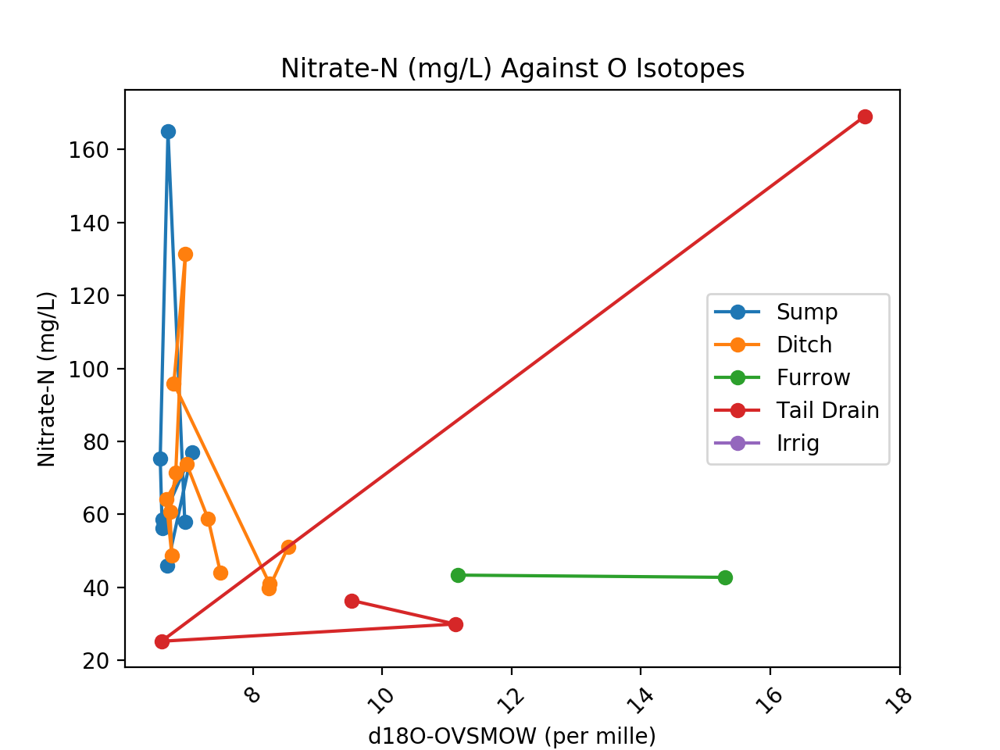

In [158]:
elementals = ['Phosphate (mg/L)', 'Nitrite (mg/L)', 'Nitrate/Nitrite (mg/L)', 
              'Ammonia (mg/L)','Nitrate-N (mg/L)']

# Nutrients against O Isotopes


for element in elementals:
    xvar = Site['d18OVSMOW  (‰)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    # plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('d18O-OVSMOW (per mille)')
    plt.ylabel(element)
    plt.title(element+' Against O Isotopes')
    plt.legend()
    plt.xticks(rotation=45)

<IPython.core.display.Javascript object>


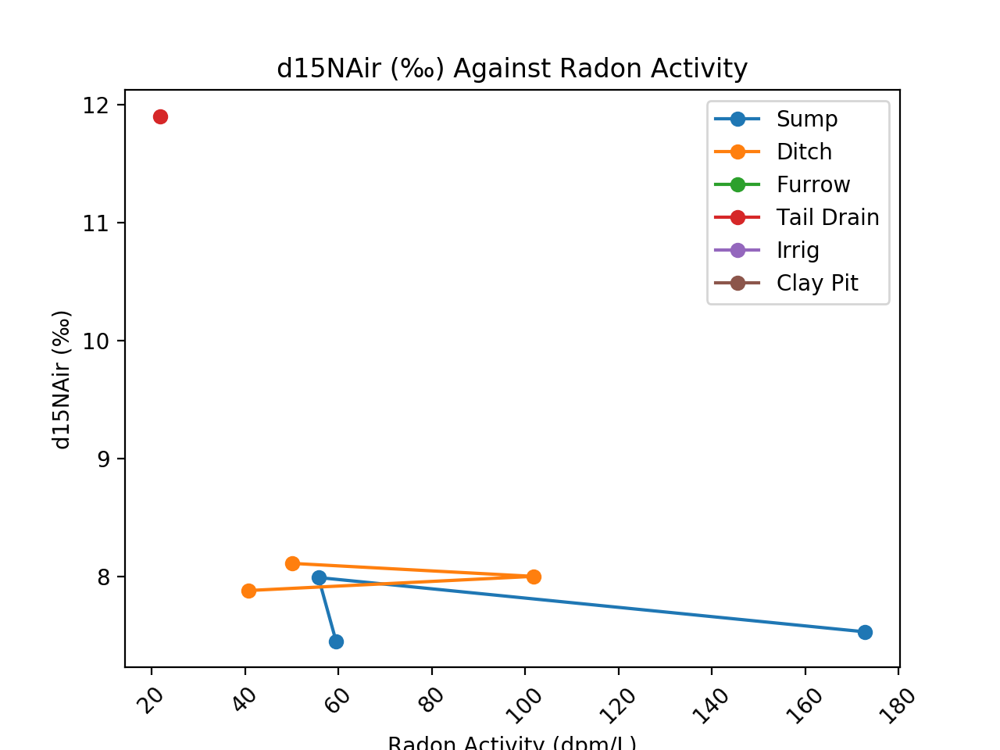

<IPython.core.display.Javascript object>


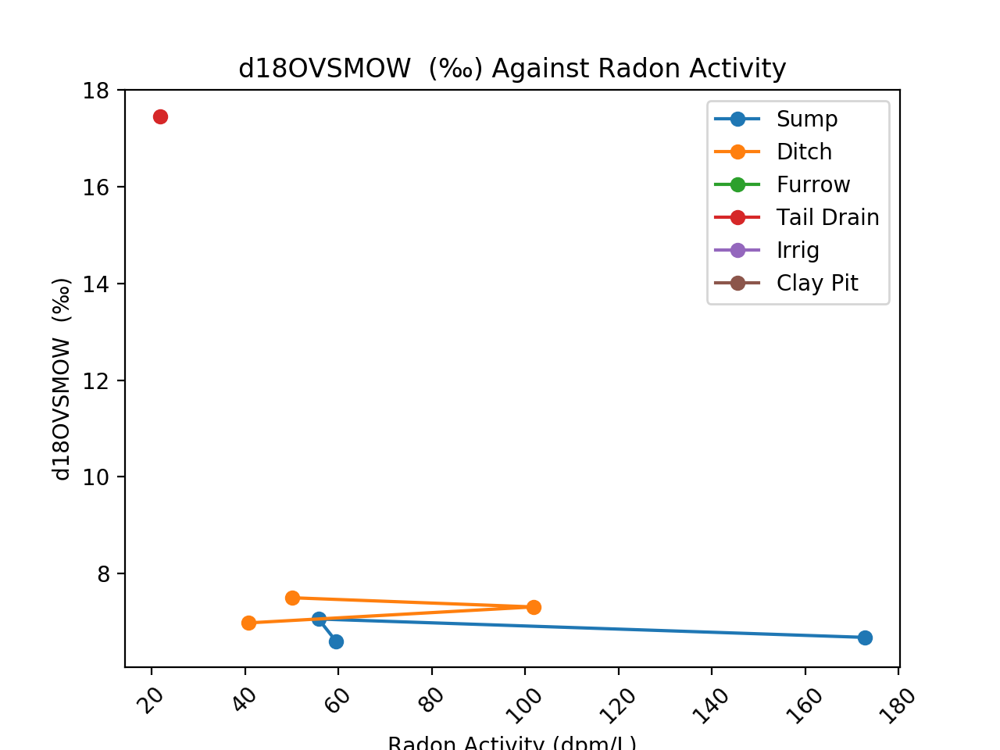

In [182]:
elementals = ['d15NAir (‰)','d18OVSMOW  (‰)']

# Isotopes against Radon Activity


for element in elementals:
    xvar = Site['Decay Corrected Avg Rn_wat (dpm/L)']
    yvar = Site[element]

    plt.figure()
    plt.plot(xvar[SUMP], yvar[SUMP], marker='o',linestyle='-',label='Sump')
    plt.plot(xvar[DITCH], yvar[DITCH], marker='o',linestyle='-',label='Ditch')
    plt.plot(xvar[FURROW], yvar[FURROW], marker='o',linestyle='-',label='Furrow')
    plt.plot(xvar[TAILDRAIN], yvar[TAILDRAIN], marker='o',linestyle='-',label='Tail Drain')
    plt.plot(xvar[IRRIG], yvar[IRRIG], marker='o',linestyle='-',label='Irrig')
    plt.plot(xvar[CLAY_PIT], yvar[CLAY_PIT], marker='o',linestyle='-',label='Clay Pit')

    # plt.plot(xvar[TILE], yvar[TILE], marker='o',linestyle='-',label='Tile')
    # plt.plot(xvar[MC], yvar[MC], marker='o',linestyle='-',label='Moro Cojo')
    # plt.plot(xvar[SAND_PIT], yvar[SAND_PIT], marker='o',linestyle='-',label='Sand Pit')
    # plt.plot(xvar[HARBOR], yvar[HARBOR], marker='o',linestyle='-',label='Harbor')
    # plt.plot(xvar[WETLAND], yvar[WETLAND], marker='o',linestyle='-',label='Wetland')
    # plt.plot(xvar[ES], yvar[ES], marker='o',linestyle='-',label='Elkhorn Slough')
    # plt.plot(xvar[MB], yvar[MB], marker='o',linestyle='-',label='Monterey Bay')
    # plt.plot(xvar[SPRING], yvar[SPRING], marker='o',linestyle='-',label='Spring')

    plt.xlabel('Radon Activity (dpm/L)')
    plt.ylabel(element)
    plt.title(element+' Against Radon Activity')
    plt.legend()
    plt.xticks(rotation=45)

In [160]:
Site.keys()

Index(['index', 'Date', 'Site Name', 'Type', 'Correct Data? ', 'Updated? ',
       'Rn for equilibrated?', 'Depth/Temp/Wind', 'Site Name.1', 'Site_type',
       'Updated_Site_Type', 'Description', 'Latitude', 'Longitude', 'Label',
       'Replecate ', 'Total_Name', 'Sample Analysis', 'BB Sample Color',
       'BB Sediment?', 'Rn-222', 'Nutrients', 'Isotopes', 'Elements',
       'Water Iso.', 'Bkgd Run #', 'RAD7 Run #', 'BB #', 'Volume (L)',
       'Background Date', 'Collection DateTime', 'Analysis Date',
       'Analysis DateTime', 'Decay Time (days)', 'Radon Flag', 'Wind',
       'Nutrient Sample Name', 'Isotope Sample Names', 'Nut. Sample Freezer',
       'Iso. Sample Freezer', 'Elem. Sample Location',
       'Water Isotope Location', 'Field Irrigation Status ', 'Crop Status',
       'Rotation', 'Notes', 'Depth (meters)', 'Area (m2)', 'Flow Rate (m/s)',
       'Water Temp (deg C)', 'Cond. (uS/cm)', 'Salinity ', 'pH', 'DO (%)',
       'DO (mg/L)', 'Date_Check', 'Name_Check', 'Phospha